# Train Phases_Amplitudes with New RIS (decreased size)

In [ ]:
# Notes

# ris(decreasedsize)_optimization_results/non_optimized_ris_localization_model.h5  - DNN for NON-optimized RIS case, channel coefficients-location (input-output pair)
# ris(decreasedsize)_optimization_results/ris_localization_model_simple.h5 -DNN for optimized RIS case, channl coefficients-location (input-output pair)

# Initialize CUDA

In [1]:
import os # Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0 # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    import os
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
# For more details, see https://www.tensorflow.org/guide/gpu
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Colab does currently not support the latest version of ipython.
# Thus, the preview does not work in Colab. However, whenever possible we
# strongly recommend to use the scene preview mode.
try: # detect if the notebook runs in Colab
    import google.colab
    no_preview = True # deactivate preview
except:
    if os.getenv("SIONNA_NO_PREVIEW"):
        no_preview = True
    else:
        no_preview = False

resolution = [480,320] # increase for higher quality of renderings

# Define magic cell command to skip a cell if needed
from IPython.core.magic import register_cell_magic
from IPython import get_ipython

@register_cell_magic
def skip_if(line, cell):
    if eval(line):
        return
    get_ipython().run_cell(cell)

# Set random seed for reproducibility
sionna.config.seed = 40

# Position Tx RIS Rx

In [176]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="tr38901",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="cross")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[-8.5, -5.13, 4.63])

# Add transmitter instance to scene
scene.add(tx)

# Set the frequency
scene.frequency = 2.14e9  # in Hz; implicitly updates RadioMaterials

# Set synthetic array to True
scene.synthetic_array = True  # If set to False, ray tracing will be done per antenna element (slower for large arrays)

# Configure RIS with 512 reflecting elements
num_elements = 512  # Number of reflecting elements

# Compute square grid dimensions
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust if total elements do not match num_elements
if num_rows * num_cols != num_elements:
    num_cols += 1

# Final check
assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS at a specified position and orientation
ris = RIS(name="ris",
          position=[-1.414, -0.079, 5.869],  # Adjust the position as needed
          look_at=[-1.539, -0.018, 0.0005],  # Adjust the orientation as needed
          num_rows=num_rows,
          num_cols=num_cols)

# Add RIS to the scene
scene.add(ris)

# Set receiver position
#receiver_position = [-5.945, -3.38, 1.23]
receiver_position=[-1.8091836734693878, 6.52, 1.23]
# Create receiver
rx_name = "rx"
rx = Receiver(name=rx_name,
              position=receiver_position,
              orientation=[0, 0, 0])

# Add receiver instance to scene
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5,
                            num_samples=1e6)  # Number of rays shot into directions defined by a Fibonacci sphere

# Sum the channel coefficients across all paths
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print receiver position and channel coefficient
print(f"Receiver Position: {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Save results to new XML directory
output_path = "Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Separate code to compute received signal strength
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)

print(f"Received Signal Strength (dBm): {received_power_dbm}")

# Print RIS configuration and profiles
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Calculate Received Signal Strength (RSS) in dB at the receiver
rss = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss)
print(f"Received Signal Strength (RSS in dB): {rss_db}")


Receiver Position: [-1.8091836734693878, 6.52, 1.23]
Channel Coefficient: (0.0017519639804959297+2.5472072593402117e-06j)
Results saved to Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient.xml
Received Signal Strength (dBm): -55.129487304454116
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -55.129487304454116


# Render Preview and show Paths

In [6]:
render_to_file = False # Set to True to render image to file

# Render scene to file from preview viewpoint
if render_to_file:
    scene.render_to_file(camera="scene-cam-0", # Also try camera="preview"
                         filename="scene.png",
                         resolution=[1200,800])

In [8]:
%%skip_if no_preview
# Open 3D preview (only works in Jupyter notebook)
scene.preview()

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, position=(0.0, 0.0, …

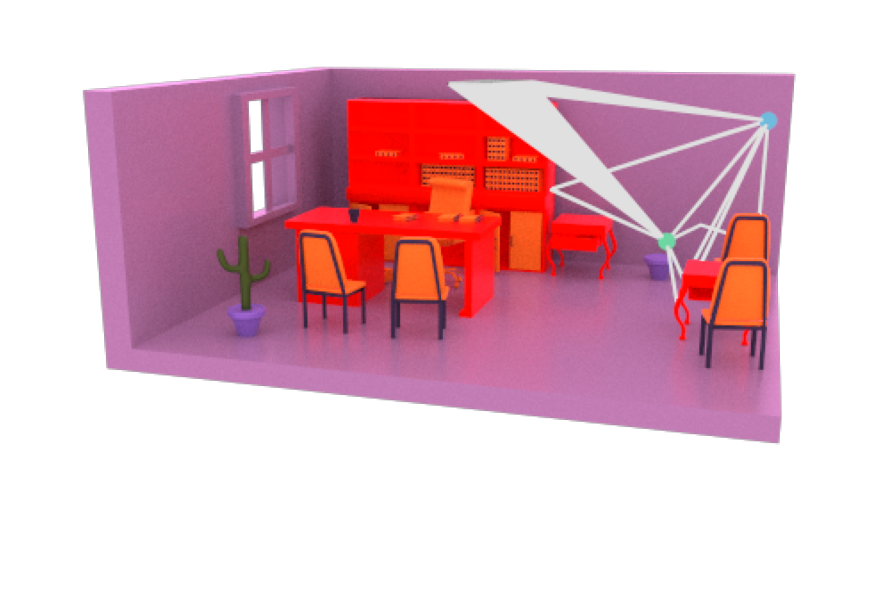

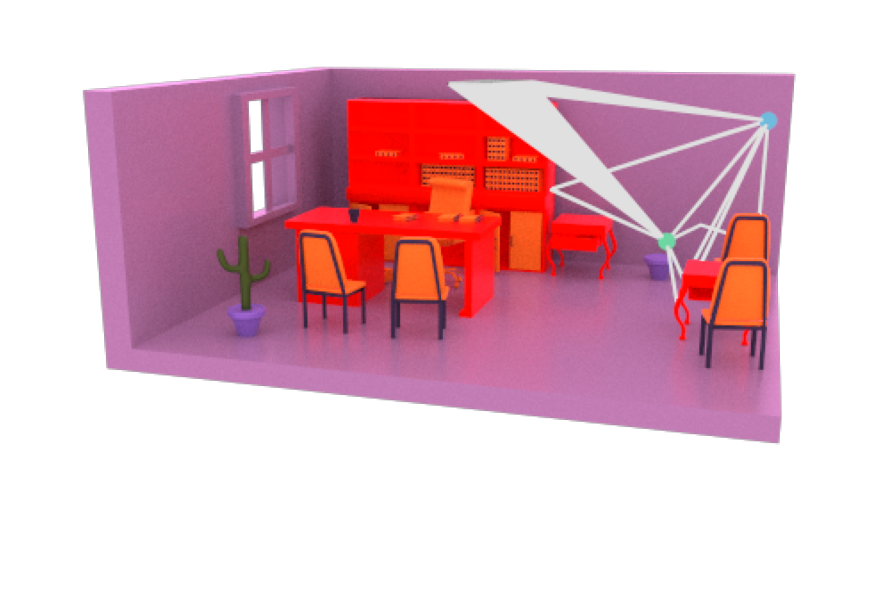

In [12]:
# Compute propagation paths
paths = scene.compute_paths(max_depth=5,
                            num_samples=1e6)  # Number of rays shot into directions defined
                                              # by a Fibonacci sphere , too few rays can
                                              # lead to missing paths

# Visualize paths in the scene
# if no_preview:
scene.render("preview", paths=paths, show_devices=True, show_paths=True, resolution=resolution)

# Optimization for 512 (Inital Trial) - Verified 4.5 dB increase! 

In [26]:
import tensorflow as tf
import pickle
import os

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
# Ensure values remain non-negative using a constraint
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values), 
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Create trainable mode powers with normalization constraints
# Ensure values are within [0.01, 1] and initialized slightly below 1
m1 = tf.Variable([0.99], dtype=tf.float32, 
                 constraint=lambda x: tf.clip_by_value(x, 0.01, 1))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        ris.amplitude_profile.values = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))
        
        # Normalize mode powers to ensure total power of one
        ris.amplitude_profile.mode_powers = m1 / tf.reduce_sum(m1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain to maximize the gain
        loss = -path_gain

    # Compute gradients and update variables to maximize the path gain
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain, a

# Initialize a storage tensor for intermediate results
a_it = tf.zeros([0, 2, 9], dtype=tf.complex64)  # Match this shape to the output of 'a'

# Run the training loop
num_iterations = 100
for i in range(num_iterations):
    path_gain, a = train_step()

    # Ensure compatibility between 'a_it' and the current 'a'
    if a_it.shape[-1] != a.shape[-1]:
        print(f"Adjusting 'a_it' shape from {a_it.shape} to match {a.shape}")
        a_it = tf.zeros([0] + list(a.shape), dtype=a.dtype)

    # Append the new 'a' value to the storage tensor
    a_it = tf.concat([a_it, a[tf.newaxis]], axis=0)

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Directory and file name to save the results
save_dir = './ris(decreasedsize)_optimization_results '
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'Point1_optimized_ris_phases.pkl')

# Load existing results if the file exists, otherwise initialize
if os.path.exists(save_file):
    with open(save_file, 'rb') as f:
        global_results = pickle.load(f)
else:
    global_results = {}  # Initialize an empty dictionary for global results

# Add the current point's results to the global file
current_point = f"Point{len(global_results) + 1}"  # Dynamically assign the next point
global_results[current_point] = {
    'phase_profile': ris.phase_profile.values.numpy(),
    'amplitude_profile': ris.amplitude_profile.values.numpy(),
    'mode_powers': m1.numpy(),
    'path_gain': path_gain.numpy(),
    'a_it': a_it.numpy(),
}

# Save the updated global results
with open(save_file, 'wb') as f:
    pickle.dump(global_results, f)

print(f"Optimized RIS configuration for {current_point} saved to {save_file}")

# Code to Load and Print All Results Later
with open(save_file, 'rb') as f:
    loaded_results = pickle.load(f)

print("Loaded RIS configurations for all points:")
for point, data in loaded_results.items():
    print(f"{point}: Phase profile:\n{data['phase_profile']}")
    print(f"{point}: Amplitude profile:\n{data['amplitude_profile']}")

print(f"Number of RIS reflecting elements: {tf.size(ris.phase_profile.values).numpy()}")


Iteration 0 - Path gain: -57.39 dB
Iteration 10 - Path gain: -54.12 dB
Iteration 20 - Path gain: -53.70 dB
Iteration 30 - Path gain: -53.62 dB
Iteration 40 - Path gain: -53.60 dB
Iteration 50 - Path gain: -53.59 dB
Iteration 60 - Path gain: -53.59 dB
Iteration 70 - Path gain: -53.59 dB
Iteration 80 - Path gain: -53.58 dB
Iteration 90 - Path gain: -53.58 dB
Optimized RIS configuration for Point1 saved to ./ris(decreasedsize)_optimization_results /Point1_optimized_ris_phases.pkl
Loaded RIS configurations for all points:
Point1: Phase profile:
[[[-2.84459209e+00 -1.81108367e+00 -7.49187589e-01  3.21781904e-01
    1.41101313e+00  2.51536345e+00 -2.64007354e+00 -1.49887383e+00
   -3.32664609e-01  8.49347949e-01  2.05217457e+00 -3.01497889e+00
   -1.77193213e+00 -5.10185182e-01  7.74238467e-01  2.07666969e+00
   -2.87813401e+00 -1.52457750e+00 -1.52779639e-01  1.23896933e+00
    2.66577888e+00 -2.17767382e+00 -7.02202976e-01  7.95002997e-01]
  [-9.34939444e-01  1.16556205e-01  1.18718219e+00

# Generate Channals for 1K points

In [14]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# GPU Configuration
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import or Install Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Configure TensorFlow GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Set save directory
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for transmitters
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,  # Spacing between rows in meters
    horizontal_spacing=0.5,  # Spacing between columns in meters
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for receivers
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,  # Spacing between rows in meters
    horizontal_spacing=0.5,  # Spacing between columns in meters
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and synthetic array
scene.frequency = 2.14e9  # Hz
scene.synthetic_array = True

# Configure RIS
# Compute the wavelength
c = 3e8  # Speed of light (m/s)
wavelength = c / scene.frequency  # Wavelength in meters

# Set the width of the RIS
width = 5  # Adjust width in meters for decreased size

# Calculate number of rows and columns for the RIS
num_rows = num_cols = int(width / (0.5 * wavelength))

# Create RIS at a specified position and orientation
ris = RIS(name="ris",
          position=[-1.414, -0.079, 5.869],  # Default position
          look_at=[-1.539, -0.018, 0.0005],  # Default orientation
          num_rows=num_rows,
          num_cols=num_cols)

# Add RIS to the scene
scene.add(ris)

# Generate 1000 receiver positions
y_positions = np.linspace(-4.0, 6.52, 20)
x_positions = np.linspace(-8.6, 4.71, 50)
y_grid, x_grid = np.meshgrid(y_positions, x_positions)
receiver_positions = np.c_[x_grid.ravel(), y_grid.ravel(), np.full(x_grid.size, 1.23)]  # Height = 1.23 m

# Prepare XML for results
root = ET.Element("ChannelCoefficients")

# Compute channel coefficients for each receiver position
for idx, position in enumerate(receiver_positions):
    rx_name = f"rx_{idx}"
    rx = Receiver(name=rx_name, position=position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute propagation paths
    paths = scene.compute_paths(max_depth=5, num_samples=int(1e6))
    total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

    # Save results to XML
    rx_element = ET.SubElement(root, "Receiver")
    ET.SubElement(rx_element, "X").text = str(position[0])
    ET.SubElement(rx_element, "Y").text = str(position[1])
    ET.SubElement(rx_element, "Z").text = str(position[2])
    ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

    # Remove receiver from the scene
    scene.remove(rx_name)

# Save the results to the specified directory
output_path = os.path.join(save_dir, "receiver_channel_coefficients_1000.xml")
tree = ET.ElementTree(root)
tree.write(output_path)
print(f"Results saved to {output_path}")


Results saved to ./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml


# Optimize RIS Phases for 7 Points

## Point 1 

In [4]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="tr38901",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="cross")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[-8.5, -5.13, 4.63])

# Add transmitter instance to scene
scene.add(tx)

# Set the frequency
scene.frequency = 2.14e9  # in Hz; implicitly updates RadioMaterials

# Set synthetic array to True
scene.synthetic_array = True  # If set to False, ray tracing will be done per antenna element (slower for large arrays)

# Configure RIS with 512 reflecting elements
num_elements = 512  # Number of reflecting elements

# Compute square grid dimensions
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust if total elements do not match num_elements
if num_rows * num_cols != num_elements:
    num_cols += 1

# Final check
assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS at a specified position and orientation
ris = RIS(name="ris",
          position=[-1.414, -0.079, 5.869],  # Adjust the position as needed
          look_at=[-1.539, -0.018, 0.0005],  # Adjust the orientation as needed
          num_rows=num_rows,
          num_cols=num_cols)

# Add RIS to the scene
scene.add(ris)

# Set receiver position
receiver_position = [-5.945, -3.38, 1.23]

# Create receiver
rx_name = "rx"
rx = Receiver(name=rx_name,
              position=receiver_position,
              orientation=[0, 0, 0])

# Add receiver instance to scene
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5,
                            num_samples=1e6)  # Number of rays shot into directions defined by a Fibonacci sphere

# Sum the channel coefficients across all paths
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print receiver position and channel coefficient
print(f"Receiver Position: {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Save results to new XML directory
output_path = "Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Separate code to compute received signal strength
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)

print(f"Received Signal Strength (dBm): {received_power_dbm}")

# Print RIS configuration and profiles
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)


# Calculate Received Signal Strength (RSS) in dB at the receiver
rss = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss)
print(f"Received Signal Strength (RSS in dB): {rss_db}")


Receiver Position: [-5.945, -3.38, 1.23]
Channel Coefficient: (0.001970460172742605+2.3490645617130212e-05j)
Results saved to Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient.xml
Received Signal Strength (dBm): -54.108029972699796
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -54.108029972699796


In [13]:
import tensorflow as tf
import pickle
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values), 
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Create trainable mode powers with normalization constraints
m1 = tf.Variable([0.99], dtype=tf.float32, 
                 constraint=lambda x: tf.clip_by_value(x, 0.01, 1))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Check if ris.amplitude_profile.values is a tf.Variable; reinitialize if needed
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)

        ris.amplitude_profile.values.assign(normalized_a1)

        # Normalize mode powers to ensure total power of one
        normalized_m1 = m1 / tf.reduce_sum(m1)

        # Check if ris.amplitude_profile.mode_powers is a tf.Variable; reinitialize if needed
        if not isinstance(ris.amplitude_profile.mode_powers, tf.Variable):
            ris.amplitude_profile.mode_powers = tf.Variable(ris.amplitude_profile.mode_powers, trainable=True)

        ris.amplitude_profile.mode_powers.assign(normalized_m1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain to maximize the gain
        loss = -path_gain

    # Compute gradients and update variables to maximize the path gain
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain, a

# Initialize a storage tensor for intermediate results
a_it = tf.zeros([0, 2, 9], dtype=tf.complex64)  # Match this shape to the output of 'a'

# Training loop parameters
num_iterations = 100
receiver_coordinates = "-5.945, -3.38, 1.23"
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Run the training loop for Point 1
for i in range(num_iterations):
    path_gain, a = train_step()

    # Ensure compatibility between 'a_it' and the current 'a'
    if a_it.shape[-1] != a.shape[-1]:
        print(f"Adjusting 'a_it' shape from {a_it.shape} to match {a.shape}")
        a_it = tf.zeros([0] + list(a.shape), dtype=a.dtype)

    # Append the new 'a' value to the storage tensor
    a_it = tf.concat([a_it, a[tf.newaxis]], axis=0)

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Save results to XML
root = ET.Element("RIS_Optimization")
point = ET.SubElement(root, "Point", name="Point 1")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates
ET.SubElement(point, "PathGain").text = f"{path_gain.numpy():.2f} dB"

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Save mode powers
ET.SubElement(point, "ModePowers").text = ','.join(map(str, m1.numpy()))

# Save a_it values
a_it_values = ET.SubElement(point, "A_IT")
for sample in a_it.numpy():
    sample_element = ET.SubElement(a_it_values, "Sample")
    for value in sample.flatten():
        ET.SubElement(sample_element, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS configuration saved to {save_file}")


Iteration 0 - Path gain: -57.39 dB
Iteration 10 - Path gain: -54.22 dB
Iteration 20 - Path gain: -53.80 dB
Iteration 30 - Path gain: -53.68 dB
Iteration 40 - Path gain: -53.64 dB
Iteration 50 - Path gain: -53.63 dB
Iteration 60 - Path gain: -53.62 dB
Iteration 70 - Path gain: -53.62 dB
Iteration 80 - Path gain: -53.62 dB
Iteration 90 - Path gain: -53.62 dB
Optimized RIS configuration saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [6]:
import xml.etree.ElementTree as ET
import numpy as np

# Path to the XML file
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'

# Function to read and print amplitude and phase profiles in a matrix format
def read_and_print_profiles(file_path, rows=22, columns=24):
    try:
        # Parse the XML file
        tree = ET.parse(file_path)
        root = tree.getroot()

        # Find the relevant point
        point = root.find("Point")
        if point is None:
            print("Error: No 'Point' element found in the XML file.")
            return

        # Point name
        point_name = point.get("name", "Unknown Point")
        print(f"Point Name: {point_name}")

        # Receiver coordinates
        receiver_coordinates = point.find("ReceiverCoordinates").text
        print(f"Receiver Coordinates: {receiver_coordinates}\n")

        # Amplitude Profile
        amplitude_profile = point.find("AmplitudeProfile")
        if amplitude_profile is not None:
            print("Amplitude Profile (Matrix of Gain Values):")
            amplitude_values = np.array([float(value.text) for value in amplitude_profile.findall("Value")])
            if amplitude_values.size != rows * columns:
                raise ValueError("Mismatch between matrix dimensions and number of amplitude values.")
            amplitude_matrix = amplitude_values.reshape(rows, columns)
            print(amplitude_matrix)
        else:
            print("Error: No 'AmplitudeProfile' element found.")

        print("\n")  # Add some space between profiles

        # Phase Profile
        phase_profile = point.find("PhaseProfile")
        if phase_profile is not None:
            print("Phase Profile (Matrix of Phase Shifts in Radians):")
            phase_values = np.array([float(value.text) for value in phase_profile.findall("Value")])
            if phase_values.size != rows * columns:
                raise ValueError("Mismatch between matrix dimensions and number of phase values.")
            phase_matrix = phase_values.reshape(rows, columns)
            print(phase_matrix)
        else:
            print("Error: No 'PhaseProfile' element found.")

    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except ET.ParseError:
        print(f"Error: File '{file_path}' could not be parsed.")
    except ValueError as e:
        print(f"Error: {e}")

# Call the function to print amplitude and phase profiles as matrices
read_and_print_profiles(xml_file, rows=22, columns=24)


Point Name: Point 1
Receiver Coordinates: -5.945, -3.38, 1.23

Amplitude Profile (Matrix of Gain Values):
[[1.5271962 1.5142349 1.5053272 1.5051304 1.5092728 1.5231897 1.5249128
  1.5103452 1.5050162 1.505409  1.5166742 1.5287315 1.5135939 1.5044775
  1.5051738 1.5169795 1.5272921 1.5105443 1.5052011 1.5076722 1.524704
  1.5187769 1.5050051 1.5051923]
 [1.5058942 1.5051932 1.5074582 1.519924  1.5277445 1.5138841 1.5048559
  1.5045214 1.5121078 1.5274482 1.5191064 1.505872  1.5053084 1.5108852
  1.5273705 1.5175941 1.5052023 1.5045909 1.5161296 1.5269554 1.5092713
  1.5051382 1.5102589 1.52916  ]
 [1.5063753 1.5174282 1.5298712 1.5169063 1.505689  1.505414  1.5090894
  1.523766  1.5235052 1.5084547 1.5052387 1.5072212 1.5219886 1.5237277
  1.5077229 1.5050912 1.5095522 1.5268345 1.516968  1.5045564 1.505353
  1.5202754 1.5223563 1.5056806]
 [1.5291524 1.5191345 1.5066813 1.5052233 1.5072992 1.5204921 1.5265925
  1.5116278 1.5047672 1.5053334 1.5169287 1.5280561 1.5121722 1.5050248
  1.5

In [191]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters and receivers
scene.tx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="tr38901", 
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="dipole", 
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

# Ensure total_elements matches
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)
scene.add(ris)

# Receiver position
receiver_position = [-5.945, -3.38, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 1"

# Extract phase and amplitude profiles
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Update RIS profiles
phase_profile_np = np.array(phase_profile, dtype=np.float32)
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32)

# Reshape to match RIS shape
expected_shape = (1, num_rows, num_cols)
phase_profile_np = phase_profile_np.reshape(expected_shape)
amplitude_profile_np = amplitude_profile_np.reshape(expected_shape)

# Assign reshaped profiles to RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Add receiver to scene
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate RSS
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)


print(f"Receiver Position: {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")



Receiver Position: [-5.945, -3.38, 1.23]
RSS for Point 1: -48.18 dB


## Point 2 

In [14]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="tr38901",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="cross")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[-8.5, -5.13, 4.63])

# Add transmitter instance to scene
scene.add(tx)

# Set the frequency
scene.frequency = 2.14e9  # in Hz; implicitly updates RadioMaterials

# Set synthetic array to True
scene.synthetic_array = True  # If set to False, ray tracing will be done per antenna element (slower for large arrays)

# Configure RIS with 512 reflecting elements
num_elements = 512  # Number of reflecting elements

# Compute square grid dimensions
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust if total elements do not match num_elements
if num_rows * num_cols != num_elements:
    num_cols += 1

# Final check
assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS at a specified position and orientation
ris = RIS(name="ris",
          position=[-1.414, -0.079, 5.869],  # Adjust the position as needed
          look_at=[-1.539, -0.018, 0.0005],  # Adjust the orientation as needed
          num_rows=num_rows,
          num_cols=num_cols)

# Add RIS to the scene
scene.add(ris)

# Set receiver position
receiver_position = [-5.945, 0.79, 1.23]

# Create receiver
rx_name = "rx"
rx = Receiver(name=rx_name,
              position=receiver_position,
              orientation=[0, 0, 0])

# Add receiver instance to scene
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5,
                            num_samples=1e6)  # Number of rays shot into directions defined by a Fibonacci sphere

# Sum the channel coefficients across all paths
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print receiver position and channel coefficient
print(f"Receiver Position: {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Save results to new XML directory
output_path = "Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Separate code to compute received signal strength
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)

print(f"Received Signal Strength (dBm): {received_power_dbm}")

# Print RIS configuration and profiles
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Calculate Received Signal Strength (RSS) in dB at the receiver
rss = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss)
print(f"Received Signal Strength (RSS in dB): {rss_db}")


Receiver Position: [-5.945, 0.79, 1.23]
Channel Coefficient: (0.0020584717858582735+9.674459761299659e-06j)
Results saved to Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient.xml
Received Signal Strength (dBm): -53.729006327463715
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -53.729006327463715


In [15]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values), 
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Check if ris.amplitude_profile.values is a tf.Variable; reinitialize if needed
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)

        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain to maximize the gain
        loss = -path_gain

    # Compute gradients and update variables to maximize the path gain
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "-5.945, 0.79, 1.23"  # Updated for Point 2
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 2
for i in range(num_iterations):
    path_gain = train_step()

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 2 results to XML
point = ET.SubElement(root, "Point", name="Point 2")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 2 saved to {save_file}")


Iteration 0 - Path gain: -64.84 dB
Iteration 10 - Path gain: -56.42 dB
Iteration 20 - Path gain: -55.38 dB
Iteration 30 - Path gain: -55.09 dB
Iteration 40 - Path gain: -55.02 dB
Iteration 50 - Path gain: -55.00 dB
Iteration 60 - Path gain: -55.00 dB
Iteration 70 - Path gain: -54.99 dB
Iteration 80 - Path gain: -54.99 dB
Iteration 90 - Path gain: -54.99 dB
Optimized RIS phase and amplitude values for Point 2 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [16]:
import xml.etree.ElementTree as ET
import numpy as np

# Path to the XML file
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'

# Function to read and print RIS phase and amplitude values
def print_saved_ris_values(file_path):
    try:
        # Parse the XML file
        tree = ET.parse(file_path)
        root = tree.getroot()

        # Iterate through all saved points
        for point in root.findall("Point"):
            point_name = point.get("name", "Unknown Point")
            print(f"Point Name: {point_name}")

            # Print receiver coordinates
            receiver_coordinates = point.find("ReceiverCoordinates").text
            print(f"  Receiver Coordinates: {receiver_coordinates}")

            # Print phase profile as a flattened array
            phase_profile = point.find("PhaseProfile")
            if phase_profile is not None:
                phase_values = [float(value.text) for value in phase_profile.findall("Value")]
                print(f"  Phase Profile: {np.array(phase_values)}")
            else:
                print("  Phase Profile: Not found")

            # Print amplitude profile as a flattened array
            amplitude_profile = point.find("AmplitudeProfile")
            if amplitude_profile is not None:
                amplitude_values = [float(value.text) for value in amplitude_profile.findall("Value")]
                print(f"  Amplitude Profile: {np.array(amplitude_values)}")
            else:
                print("  Amplitude Profile: Not found")

            print("\n")  # Separate points visually

    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except ET.ParseError:
        print(f"Error: File '{file_path}' could not be parsed.")

# Call the function to print the RIS phase and amplitude values
print_saved_ris_values(xml_file)


Point Name: Point 1
  Receiver Coordinates: -5.945, -3.38, 1.23
  Phase Profile: [-2.8623989  -1.8108681  -0.763271    0.31258035  1.4030404   2.4995172
 -2.6479106  -1.5033616  -0.3447111   0.8356835   2.041148   -3.0349956
 -1.7804642  -0.5212999   0.76021314  2.0717683  -2.8961947  -1.5357325
 -0.16616996  1.2314967   2.648923   -2.191363   -0.71571946  0.78162974
 -0.94357306  0.10841495  1.1789811   2.2609057  -2.9260647  -1.7917176
 -0.6581874   0.49976996  1.6816877   2.8812628  -2.1996474  -0.95866126
  0.2960623   1.5717336   2.8813622  -2.0971043  -0.7445057   0.61987466
  2.0099216  -2.8671877  -1.4278743   0.03725348  1.5209337   3.0512142
  1.0166452   2.085541   -3.1298158  -2.0270607  -0.9063042   0.23315637
  1.3881538   2.5504193  -2.5277452  -1.3237144  -0.09510806  1.1586368
  2.420275   -2.5548258  -1.2470274   0.08745322  1.4482516   2.836548
 -2.0534565  -0.6181281   0.83757156  2.3124032  -2.4551618  -0.9343849
  3.0306356  -2.1887496  -1.08589     0.02828669  1.

In [36]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters and receivers
scene.tx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="tr38901", 
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="dipole", 
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

# Ensure total_elements matches
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)
scene.add(ris)

# Receiver position
receiver_position = [-5.945, 0.79, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 2"

# Extract phase and amplitude profiles
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Update RIS profiles
phase_profile_np = np.array(phase_profile, dtype=np.float32)
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32)

# Reshape to match RIS shape
expected_shape = (1, num_rows, num_cols)
phase_profile_np = phase_profile_np.reshape(expected_shape)
amplitude_profile_np = amplitude_profile_np.reshape(expected_shape)

# Assign reshaped profiles to RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Add receiver to scene
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate RSS
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)
rss_dbm = rss_db + 30  # Convert to dBm

print(f"Receiver Position: {receiver_position}")
print(f"RSS for {point_label}: {rss_dbm.numpy():.2f} dBm")
print(f"Phase Profile: {phase_profile}")
print(f"Amplitude Profile: {amplitude_profile}")


Receiver Position: [-5.945, 0.79, 1.23]
RSS for Point 2: -18.70 dBm
Phase Profile: [-1.2735684, 1.1353503, -2.6956787, -0.22152573, 2.2931178, -1.437021, 1.1657858, -2.4852598, 0.17683305, 2.873737, -0.6571002, 2.1313858, -1.3295426, 1.5271597, -1.8527997, 1.0923611, -2.2043557, 0.8238685, -2.3893008, 0.7150707, -2.4130685, 0.77556336, -2.2726984, 1.0055418, 1.6995468, -2.1591747, 0.30372027, 2.7920623, -0.9518168, 1.6129992, -2.0624745, 0.58629984, -3.0061567, -0.29353166, 2.459262, -1.0190117, 1.8243321, -1.5835814, 1.3280231, -2.0052466, 1.0015987, -2.2443733, 0.83705556, -2.323437, 0.8385569, -2.2409027, 1.0088885, -1.99374, -1.5551759, 0.88122123, -2.9182146, -0.41779223, 2.1347733, -1.5635383, 1.0521269, -2.5632734, 0.12577781, 2.8509061, -0.65254873, 2.162747, -1.2669014, 1.6118125, -1.7308222, 1.2336535, -2.0419888, 1.0196813, -2.1756706, 0.9587669, -2.1491916, 1.0693648, -1.9578642, 1.3550769, 1.5050403, -2.3180106, 0.16982631, 2.6860332, -1.0250534, 1.5646101, -2.0817053, 0.5

## Point 3


In [37]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="tr38901",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="cross")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[-8.5, -5.13, 4.63])

# Add transmitter instance to scene
scene.add(tx)

# Set the frequency
scene.frequency = 2.14e9  # in Hz; implicitly updates RadioMaterials

# Set synthetic array to True
scene.synthetic_array = True  # If set to False, ray tracing will be done per antenna element (slower for large arrays)

# Configure RIS with 512 reflecting elements
num_elements = 512  # Number of reflecting elements

# Compute square grid dimensions
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust if total elements do not match num_elements
if num_rows * num_cols != num_elements:
    num_cols += 1

# Final check
assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS at a specified position and orientation
ris = RIS(name="ris",
          position=[-1.414, -0.079, 5.869],  # Adjust the position as needed
          look_at=[-1.539, -0.018, 0.0005],  # Adjust the orientation as needed
          num_rows=num_rows,
          num_cols=num_cols)

# Add RIS to the scene
scene.add(ris)

# Set receiver position
receiver_position = [-5.945, 4.985, 1.23]  # Point 3 receiver position

# Create receiver
rx_name = "rx"
rx = Receiver(name=rx_name,
              position=receiver_position,
              orientation=[0, 0, 0])

# Add receiver instance to scene
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5,
                            num_samples=1e6)  # Number of rays shot into directions defined by a Fibonacci sphere

# Sum the channel coefficients across all paths
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print receiver position and channel coefficient
print(f"Receiver Position: {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Save results to new XML directory
output_path = "Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient_point3.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Separate code to compute received signal strength
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)

print(f"Received Signal Strength (dBm): {received_power_dbm}")

# Print RIS configuration and profiles
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Calculate Received Signal Strength (RSS) in dB at the receiver
rss = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss)
print(f"Received Signal Strength (RSS in dB): {rss_db}")


Receiver Position: [-5.945, 4.985, 1.23]
Channel Coefficient: (0.0016927897231653333+1.2108253940823488e-05j)
Results saved to Downloads/ris(decreasedsize)_optimization_results /ris_512_channel_coefficient_point3.xml
Received Signal Strength (dBm): -55.427718114072775
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -55.427718114072775


In [38]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values), 
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Check if ris.amplitude_profile.values is a tf.Variable; reinitialize if needed
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)

        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain to maximize the gain
        loss = -path_gain

    # Compute gradients and update variables to maximize the path gain
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "-5.945, 4.985, 1.23"  # Updated for Point 3
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 3
for i in range(num_iterations):
    path_gain = train_step()

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 3 results to XML
point = ET.SubElement(root, "Point", name="Point 3")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 3 saved to {save_file}")


Iteration 0 - Path gain: -70.12 dB
Iteration 10 - Path gain: -58.37 dB
Iteration 20 - Path gain: -57.00 dB
Iteration 30 - Path gain: -56.69 dB
Iteration 40 - Path gain: -56.65 dB
Iteration 50 - Path gain: -56.63 dB
Iteration 60 - Path gain: -56.63 dB
Iteration 70 - Path gain: -56.63 dB
Iteration 80 - Path gain: -56.63 dB
Iteration 90 - Path gain: -56.63 dB
Optimized RIS phase and amplitude values for Point 3 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [40]:
import xml.etree.ElementTree as ET
import numpy as np

# Path to the XML file
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'

# Function to read and print RIS phase and amplitude values
def print_saved_ris_values(file_path):
    try:
        # Parse the XML file
        tree = ET.parse(file_path)
        root = tree.getroot()

        # Iterate through all saved points
        for point in root.findall("Point"):
            point_name = point.get("name", "Unknown Point")
            print(f"Point Name: {point_name}")

            # Print receiver coordinates
            receiver_coordinates = point.find("ReceiverCoordinates").text
            print(f"  Receiver Coordinates: {receiver_coordinates}")

            # Print phase profile as a flattened array
            phase_profile = point.find("PhaseProfile")
            if phase_profile is not None:
                phase_values = [float(value.text) for value in phase_profile.findall("Value")]
                print(f"  Phase Profile: {np.array(phase_values)}")
            else:
                print("  Phase Profile: Not found")

            # Print amplitude profile as a flattened array
            amplitude_profile = point.find("AmplitudeProfile")
            if amplitude_profile is not None:
                amplitude_values = [float(value.text) for value in amplitude_profile.findall("Value")]
                print(f"  Amplitude Profile: {np.array(amplitude_values)}")
            else:
                print("  Amplitude Profile: Not found")

            print("\n")  # Separate points visually

    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except ET.ParseError:
        print(f"Error: File '{file_path}' could not be parsed.")

# Call the function to print the RIS phase and amplitude values
print_saved_ris_values(xml_file)


Point Name: Point 1
  Receiver Coordinates: -5.945, -3.38, 1.23
  Phase Profile: [-2.8623989  -1.8108681  -0.763271    0.31258035  1.4030404   2.4995172
 -2.6479106  -1.5033616  -0.3447111   0.8356835   2.041148   -3.0349956
 -1.7804642  -0.5212999   0.76021314  2.0717683  -2.8961947  -1.5357325
 -0.16616996  1.2314967   2.648923   -2.191363   -0.71571946  0.78162974
 -0.94357306  0.10841495  1.1789811   2.2609057  -2.9260647  -1.7917176
 -0.6581874   0.49976996  1.6816877   2.8812628  -2.1996474  -0.95866126
  0.2960623   1.5717336   2.8813622  -2.0971043  -0.7445057   0.61987466
  2.0099216  -2.8671877  -1.4278743   0.03725348  1.5209337   3.0512142
  1.0166452   2.085541   -3.1298158  -2.0270607  -0.9063042   0.23315637
  1.3881538   2.5504193  -2.5277452  -1.3237144  -0.09510806  1.1586368
  2.420275   -2.5548258  -1.2470274   0.08745322  1.4482516   2.836548
 -2.0534565  -0.6181281   0.83757156  2.3124032  -2.4551618  -0.9343849
  3.0306356  -2.1887496  -1.08589     0.02828669  1.

In [42]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters and receivers
scene.tx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="tr38901", 
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="dipole", 
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

# Ensure total_elements matches
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)
scene.add(ris)

# Receiver position
receiver_position = [-5.945, 4.985, 1.23]  # Updated for Point 3

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 3"

# Extract phase and amplitude profiles
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Update RIS profiles
phase_profile_np = np.array(phase_profile, dtype=np.float32)
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32)

# Reshape to match RIS shape
expected_shape = (1, num_rows, num_cols)
phase_profile_np = phase_profile_np.reshape(expected_shape)
amplitude_profile_np = amplitude_profile_np.reshape(expected_shape)

# Assign reshaped profiles to RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Add receiver to scene
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate RSS
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)


print(f"Receiver Position: {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")



Receiver Position: [-5.945, 4.985, 1.23]
RSS for Point 3: -50.22 dB


## Point 4


In [43]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for the transmitter
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for the receiver
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(
    name="tx",
    position=[-8.5, -5.13, 4.63]
)

# Add transmitter instance to the scene
scene.add(tx)

# Set the frequency (in Hz)
scene.frequency = 2.14e9  # 2.14 GHz

# Use a synthetic array for faster ray tracing
scene.synthetic_array = True

# Configure RIS with 512 reflecting elements
num_elements = 512
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust dimensions if needed
if num_rows * num_cols != num_elements:
    num_cols += 1

assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS
ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],  # Adjust position if desired
    look_at=[-1.539, -0.018, 0.0005],  # Adjust orientation if desired
    num_rows=num_rows,
    num_cols=num_cols
)

# Add RIS to the scene
scene.add(ris)

# Set receiver position for Point 4
receiver_position = [-1.945, -3.38, 1.23]

# Create the receiver
rx = Receiver(
    name="rx",
    position=receiver_position,
    orientation=[0, 0, 0]
)

# Add receiver instance to the scene
scene.add(rx)

# Compute propagation paths (ray tracing)
paths = scene.compute_paths(
    max_depth=5,
    num_samples=1e6  # Using a Fibonacci sphere for shooting rays
)

# Sum the channel coefficients across all paths from Tx to Rx
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print basic info
print(f"Receiver Position (Point 4): {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to an XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Create output path for the XML file (make sure the folder exists)
output_path = "Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point4.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Write the XML tree to disk
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Compute received signal strength (dBm)
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
print(f"Received Signal Strength (dBm): {received_power_dbm:.2f}")

# Print RIS configuration details
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles (default if not set/optimized)
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Alternative RSS calculation in dB
rss_linear = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss_linear)
print(f"Received Signal Strength (RSS in dB): {rss_db:.2f}")


Receiver Position (Point 4): [-1.945, -3.38, 1.23]
Channel Coefficient: (0.0016625752905383706+0j)
Results saved to Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point4.xml
Received Signal Strength (dBm): -55.58
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -55.58


In [44]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values),
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Ensure ris.amplitude_profile.values is trainable
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)
        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain (to maximize gain)
        loss = -path_gain

    # Compute gradients and update variables
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "-1.945, -3.38, 1.23"  # Updated for Point 4
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 4
for i in range(num_iterations):
    path_gain = train_step()

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 4 results to XML
point = ET.SubElement(root, "Point", name="Point 4")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 4 saved to {save_file}")


Iteration 0 - Path gain: -97.33 dB
Iteration 10 - Path gain: -56.10 dB
Iteration 20 - Path gain: -58.70 dB
Iteration 30 - Path gain: -57.40 dB
Iteration 40 - Path gain: -55.27 dB
Iteration 50 - Path gain: -53.92 dB
Iteration 60 - Path gain: -53.20 dB
Iteration 70 - Path gain: -52.85 dB
Iteration 80 - Path gain: -52.68 dB
Iteration 90 - Path gain: -52.61 dB
Optimized RIS phase and amplitude values for Point 4 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [45]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna arrays
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],
    look_at=[-1.539, -0.018, 0.0005],
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Receiver position (Point 4)
receiver_position = [-1.945, -3.38, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 4"

# Extract phase and amplitude profiles for Point 4
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Convert to NumPy arrays and reshape to match RIS dimensions
phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape((1, num_rows, num_cols))
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape((1, num_rows, num_cols))

# Assign to RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Create and add receiver
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate RSS in dB
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)

print(f"Receiver Position: {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")


Receiver Position: [-1.945, -3.38, 1.23]
RSS for Point 4: -51.95 dB


## Point 5

In [46]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for the transmitter
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for the receiver
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(
    name="tx",
    position=[-8.5, -5.13, 4.63]
)
scene.add(tx)

# Set the frequency (in Hz)
scene.frequency = 2.14e9  # 2.14 GHz

# Use a synthetic array for faster ray tracing
scene.synthetic_array = True

# Configure RIS with 512 reflecting elements
num_elements = 512
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust dimensions if needed
if num_rows * num_cols != num_elements:
    num_cols += 1

assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS
ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],  # Adjust position if desired
    look_at=[-1.539, -0.018, 0.0005],  # Adjust orientation if desired
    num_rows=num_rows,
    num_cols=num_cols
)

# Add RIS to the scene
scene.add(ris)

# Set receiver position for Point 5
receiver_position = [-1.945, 0.79, 1.23]

# Create the receiver
rx = Receiver(
    name="rx",
    position=receiver_position,
    orientation=[0, 0, 0]
)

# Add receiver instance to the scene
scene.add(rx)

# Compute propagation paths (ray tracing)
paths = scene.compute_paths(
    max_depth=5,
    num_samples=1e6  # Using a Fibonacci sphere for shooting rays
)

# Sum the channel coefficients across all paths from Tx to Rx
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print basic info
print(f"Receiver Position (Point 5): {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to an XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Create output path for the XML file (make sure the folder exists)
output_path = "Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point5.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Write the XML tree to disk
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Compute received signal strength (dBm)
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
print(f"Received Signal Strength (dBm): {received_power_dbm:.2f}")

# Print RIS configuration details
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles (default if not set/optimized)
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Alternative RSS calculation in dB
rss_linear = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss_linear)
print(f"Received Signal Strength (RSS in dB): {rss_db:.2f}")


Receiver Position (Point 5): [-1.945, 0.79, 1.23]
Channel Coefficient: (0.0011263374472036958+1.6323047020705417e-05j)
Results saved to Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point5.xml
Received Signal Strength (dBm): -58.97
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -58.97


In [47]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values),
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Ensure ris.amplitude_profile.values is trainable
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)
        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain (to maximize gain)
        loss = -path_gain

    # Compute gradients and update variables
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "-1.945, 0.79, 1.23"  # Updated for Point 5
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 5
for i in range(num_iterations):
    path_gain = train_step()

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 5 results to XML
point = ET.SubElement(root, "Point", name="Point 5")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 5 saved to {save_file}")


Iteration 0 - Path gain: -57.51 dB
Iteration 10 - Path gain: -56.68 dB
Iteration 20 - Path gain: -56.58 dB
Iteration 30 - Path gain: -56.55 dB
Iteration 40 - Path gain: -56.54 dB
Iteration 50 - Path gain: -56.53 dB
Iteration 60 - Path gain: -56.53 dB
Iteration 70 - Path gain: -56.53 dB
Iteration 80 - Path gain: -56.53 dB
Iteration 90 - Path gain: -56.53 dB
Optimized RIS phase and amplitude values for Point 5 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [48]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna arrays
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure the RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],
    look_at=[-1.539, -0.018, 0.0005],
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Receiver position (Point 5)
receiver_position = [-1.945, 0.79, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 5"  # Updated label for Point 5

# Extract phase and amplitude profiles for Point 5
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Convert to NumPy arrays and reshape to match the RIS dimensions
phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape((1, num_rows, num_cols))
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape((1, num_rows, num_cols))

# Assign to RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Create and add receiver
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate RSS in dB
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)

print(f"Receiver Position (Point 5): {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")


Receiver Position (Point 5): [-1.945, 0.79, 1.23]
RSS for Point 5: -52.50 dB


## Point 6 

In [49]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for the transmitter
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for the receiver
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(
    name="tx",
    position=[-8.5, -5.13, 4.63]
)
scene.add(tx)

# Set the frequency (in Hz)
scene.frequency = 2.14e9  # 2.14 GHz

# Use a synthetic array for faster ray tracing
scene.synthetic_array = True

# Configure RIS with 512 reflecting elements
num_elements = 512
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust dimensions if needed
if num_rows * num_cols != num_elements:
    num_cols += 1

assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create RIS
ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],  # Adjust position if desired
    look_at=[-1.539, -0.018, 0.0005],  # Adjust orientation if desired
    num_rows=num_rows,
    num_cols=num_cols
)

# Add RIS to the scene
scene.add(ris)

# Set receiver position for Point 6
receiver_position = [-1.945, 4.985, 1.23]

# Create the receiver
rx = Receiver(
    name="rx",
    position=receiver_position,
    orientation=[0, 0, 0]
)

# Add receiver instance to the scene
scene.add(rx)

# Compute propagation paths (ray tracing)
paths = scene.compute_paths(
    max_depth=5,
    num_samples=1e6  # Using a Fibonacci sphere for shooting rays
)

# Sum the channel coefficients across all paths from Tx to Rx
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print basic info
print(f"Receiver Position (Point 6): {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to an XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Create output path for the XML file (make sure the folder exists)
output_path = "Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point6.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Write the XML tree to disk
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Compute received signal strength (dBm)
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
print(f"Received Signal Strength (dBm): {received_power_dbm:.2f}")

# Print RIS configuration details
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print current RIS phase and amplitude profiles (default if not set/optimized)
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Alternative RSS calculation in dB
rss_linear = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss_linear)
print(f"Received Signal Strength (RSS in dB): {rss_db:.2f}")


Receiver Position (Point 6): [-1.945, 4.985, 1.23]
Channel Coefficient: (0.0020010576117783785+3.7974714359734207e-06j)
Results saved to Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point6.xml
Received Signal Strength (dBm): -53.97
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -53.97


In [50]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values),
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Ensure ris.amplitude_profile.values is trainable
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)
        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze to remove unnecessary dimensions

        # Calculate the average path gain for each receiver
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as the negative path gain (to maximize gain)
        loss = -path_gain

    # Compute gradients and update variables
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))

    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "-1.945, 4.985, 1.23"  # Updated for Point 6
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 6
for i in range(num_iterations):
    path_gain = train_step()

    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 6 results to XML
point = ET.SubElement(root, "Point", name="Point 6")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 6 saved to {save_file}")


Iteration 0 - Path gain: -63.83 dB
Iteration 10 - Path gain: -56.43 dB
Iteration 20 - Path gain: -55.47 dB
Iteration 30 - Path gain: -55.21 dB
Iteration 40 - Path gain: -55.14 dB
Iteration 50 - Path gain: -55.12 dB
Iteration 60 - Path gain: -55.11 dB
Iteration 70 - Path gain: -55.11 dB
Iteration 80 - Path gain: -55.11 dB
Iteration 90 - Path gain: -55.11 dB
Optimized RIS phase and amplitude values for Point 6 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [51]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to run on CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna arrays for Tx and Rx
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # Hz
c = 3e8                  # Speed of light
wavelength = c / scene.frequency

# Configure the RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],
    look_at=[-1.539, -0.018, 0.0005],
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Receiver position (Point 6)
receiver_position = [-1.945, 4.985, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 6"  # Updated label for Point 6

# Extract phase and amplitude profiles for Point 6
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Convert to NumPy arrays and reshape to match RIS dimensions
phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape((1, num_rows, num_cols))
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape((1, num_rows, num_cols))

# Assign profiles to the RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Create and add the receiver
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate the RSS in dB
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)

print(f"Receiver Position (Point 6): {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")


Receiver Position (Point 6): [-1.945, 4.985, 1.23]
RSS for Point 6: -48.89 dB


## Point 7

In [52]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna (install if necessary)
try:
    import sionna
except ImportError as e:
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for the transmitter
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for the receiver
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create the transmitter
tx = Transmitter(
    name="tx",
    position=[-8.5, -5.13, 4.63]
)
scene.add(tx)

# Set the frequency (in Hz)
scene.frequency = 2.14e9  # 2.14 GHz

# Use a synthetic array for faster ray tracing
scene.synthetic_array = True

# Configure RIS with 512 reflecting elements
num_elements = 512
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust dimensions if needed
if num_rows * num_cols != num_elements:
    num_cols += 1

assert num_rows * num_cols >= num_elements, f"Calculated elements: {num_rows * num_cols}, Expected: {num_elements}"

# Create the RIS
ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],  # Adjust position if desired
    look_at=[-1.539, -0.018, 0.0005],  # Adjust orientation if desired
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Set receiver position for Point 7
receiver_position = [2.5, -3.38, 1.23]

# Create the receiver
rx = Receiver(
    name="rx",
    position=receiver_position,
    orientation=[0, 0, 0]
)
scene.add(rx)

# Compute propagation paths (ray tracing)
paths = scene.compute_paths(
    max_depth=5,
    num_samples=1e6  # Using a Fibonacci sphere for ray shooting
)

# Sum the channel coefficients across all paths from Tx to Rx
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print basic info
print(f"Receiver Position (Point 7): {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Save result to an XML file
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Create output path for the XML file (ensure the folder exists)
output_path = "Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point7.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Write the XML tree to disk
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Compute received signal strength (dBm)
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
print(f"Received Signal Strength (dBm): {received_power_dbm:.2f}")

# Print RIS configuration details
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print the current (default) RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Alternative RSS calculation in dB
rss_linear = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss_linear)
print(f"Received Signal Strength (RSS in dB): {rss_db:.2f}")


Receiver Position (Point 7): [2.5, -3.38, 1.23]
Channel Coefficient: (0.0015965442871674895+0j)
Results saved to Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point7.xml
Received Signal Strength (dBm): -55.94
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -55.94


In [53]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values),
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Ensure ris.amplitude_profile.values is trainable
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)
        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Squeeze out unnecessary dimensions

        # Calculate the average path gain
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as negative path gain (to maximize gain)
        loss = -path_gain

    # Compute gradients and update variables
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))
    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "2.5, -3.38, 1.23"  # Updated for Point 7
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 7
for i in range(num_iterations):
    path_gain = train_step()
    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 7 results to the XML
point = ET.SubElement(root, "Point", name="Point 7")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 7 saved to {save_file}")


Iteration 0 - Path gain: -100.59 dB
Iteration 10 - Path gain: -56.78 dB
Iteration 20 - Path gain: -59.80 dB
Iteration 30 - Path gain: -59.05 dB
Iteration 40 - Path gain: -56.74 dB
Iteration 50 - Path gain: -55.11 dB
Iteration 60 - Path gain: -54.15 dB
Iteration 70 - Path gain: -53.60 dB
Iteration 80 - Path gain: -53.30 dB
Iteration 90 - Path gain: -53.13 dB
Optimized RIS phase and amplitude values for Point 7 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [54]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to run on CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Import Sionna (install if necessary)
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert a linear-scale value to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna arrays for Tx and Rx
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8                   # Speed of light
wavelength = c / scene.frequency

# Configure the RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],
    look_at=[-1.539, -0.018, 0.0005],
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Receiver position (Point 7)
receiver_position = [2.5, -3.38, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 7"  # Updated label for Point 7

# Extract phase and amplitude profiles for Point 7
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Convert to NumPy arrays and reshape to match the RIS dimensions
phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape((1, num_rows, num_cols))
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape((1, num_rows, num_cols))

# Assign these profiles to the RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Create and add the receiver
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate the RSS in dB
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)

print(f"Receiver Position (Point 7): {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")


Receiver Position (Point 7): [2.5, -3.38, 1.23]
RSS for Point 7: -52.53 dB


## Point 8 

In [55]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to run on CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna (install if necessary)
try:
    import sionna
except ImportError as e:
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Helper function to convert linear scale to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for the transmitter
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for the receiver
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create the transmitter
tx = Transmitter(
    name="tx",
    position=[-8.5, -5.13, 4.63]
)
scene.add(tx)

# Set the frequency (in Hz)
scene.frequency = 2.14e9  # 2.14 GHz

# Use a synthetic array for faster ray tracing
scene.synthetic_array = True

# Configure the RIS with 512 reflecting elements
num_elements = 512
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust dimensions if needed
if num_rows * num_cols != num_elements:
    num_cols += 1

assert num_rows * num_cols >= num_elements, (
    f"Calculated elements: {num_rows * num_cols}, "
    f"Expected: {num_elements}"
)

# Create the RIS
ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],  # Adjust position if needed
    look_at=[-1.539, -0.018, 0.0005],  # Adjust orientation if needed
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Set receiver position for Point 8
receiver_position = [2.5, 0.79, 1.23]

# Create the receiver
rx = Receiver(
    name="rx",
    position=receiver_position,
    orientation=[0, 0, 0]
)
scene.add(rx)

# Compute propagation paths (ray tracing)
paths = scene.compute_paths(
    max_depth=5,
    num_samples=1e6  # Using a Fibonacci sphere for ray shooting
)

# Sum the channel coefficients across all paths from Tx to Rx
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print basic info
print(f"Receiver Position (Point 8): {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Create an XML root element and sub-elements to store results
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Create output path for the XML file (ensure the folder exists)
output_path = "Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point8.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Write the XML tree to disk
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Compute received signal strength (dBm)
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
print(f"Received Signal Strength (dBm): {received_power_dbm:.2f}")

# Print RIS configuration details
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print the current (default) RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Alternative RSS calculation in dB
rss_linear = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss_linear)
print(f"Received Signal Strength (RSS in dB): {rss_db:.2f}")


Receiver Position (Point 8): [2.5, 0.79, 1.23]
Channel Coefficient: 0j
Results saved to Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point8.xml
Received Signal Strength (dBm): -inf
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -inf


/tmp/ipykernel_2048390/2124293654.py:145: RuntimeWarning: divide by zero encountered in log10
  received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
/tmp/ipykernel_2048390/2124293654.py:160: RuntimeWarning: divide by zero encountered in log10
  rss_db = 10 * np.log10(rss_linear)


## Point 9

In [56]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to run on CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna (install if necessary)
try:
    import sionna
except ImportError as e:
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Helper function to convert linear scale to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for the transmitter
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for the receiver
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create the transmitter
tx = Transmitter(
    name="tx",
    position=[-8.5, -5.13, 4.63]
)
scene.add(tx)

# Set the frequency (in Hz)
scene.frequency = 2.14e9  # 2.14 GHz

# Use a synthetic array for faster ray tracing
scene.synthetic_array = True

# Configure the RIS with 512 reflecting elements
num_elements = 512
num_rows = int(np.sqrt(num_elements))
num_cols = num_elements // num_rows

# Adjust dimensions if needed
if num_rows * num_cols != num_elements:
    num_cols += 1

assert num_rows * num_cols >= num_elements, (
    f"Calculated elements: {num_rows * num_cols}, "
    f"Expected: {num_elements}"
)

# Create the RIS
ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],  # Adjust position if needed
    look_at=[-1.539, -0.018, 0.0005],  # Adjust orientation if needed
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Set receiver position for Point 9
receiver_position = [2.5, 4.985, 1.23]

# Create the receiver
rx = Receiver(
    name="rx",
    position=receiver_position,
    orientation=[0, 0, 0]
)
scene.add(rx)

# Compute propagation paths (ray tracing)
paths = scene.compute_paths(
    max_depth=5,
    num_samples=1e6  # Using a Fibonacci sphere for ray shooting
)

# Sum the channel coefficients across all paths from Tx to Rx
total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Print basic info
print(f"Receiver Position (Point 9): {receiver_position}")
print(f"Channel Coefficient: {total_channel_coefficient}")

# Create an XML root element and sub-elements to store results
root = ET.Element("ChannelCoefficients")
rx_element = ET.SubElement(root, "Receiver")
ET.SubElement(rx_element, "X").text = str(receiver_position[0])
ET.SubElement(rx_element, "Y").text = str(receiver_position[1])
ET.SubElement(rx_element, "Z").text = str(receiver_position[2])
ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

# Create output path for the XML file (ensure the folder exists)
output_path = "Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point9.xml"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Write the XML tree to disk
tree = ET.ElementTree(root)
tree.write(output_path)

print(f"Results saved to {output_path}")

# Compute received signal strength (dBm)
received_power_dbm = 10 * np.log10(np.abs(total_channel_coefficient) ** 2)
print(f"Received Signal Strength (dBm): {received_power_dbm:.2f}")

# Print RIS configuration details
print(f"RIS Configuration: {num_rows} rows x {num_cols} columns")
print(f"Total Reflecting Elements: {num_rows * num_cols}")

# Print the current (default) RIS phase and amplitude profiles
print("RIS Phase Profile:")
print(ris.phase_profile)
print("RIS Amplitude Profile:")
print(ris.amplitude_profile)

# Alternative RSS calculation in dB
rss_linear = np.abs(total_channel_coefficient) ** 2
rss_db = 10 * np.log10(rss_linear)
print(f"Received Signal Strength (RSS in dB): {rss_db:.2f}")


Receiver Position (Point 9): [2.5, 4.985, 1.23]
Channel Coefficient: (2.511246748326812e-05-5.045300895289984e-06j)
Results saved to Downloads/ris(decreasedsize)_optimization_results/ris_512_channel_coefficient_point9.xml
Received Signal Strength (dBm): -91.83
RIS Configuration: 22 rows x 24 columns
Total Reflecting Elements: 528
RIS Phase Profile:
RIS Amplitude Profile:
Received Signal Strength (RSS in dB): -91.83


In [57]:
import tensorflow as tf
import os
import xml.etree.ElementTree as ET

# Initialize the phase profile as trainable and set all phases to zero
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)

# Create trainable variables for the amplitude profile, initialized to one
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values),
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

# Define an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

# Helper function to convert values to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Define a single training step
def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile to ensure average power of one
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1, 2], keepdims=True))

        # Ensure ris.amplitude_profile.values is trainable
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)
        ris.amplitude_profile.values.assign(normalized_a1)

        # Compute paths in the scene
        paths = scene.compute_paths()

        # Extract the baseband-equivalent channel impulse response
        a = tf.squeeze(paths.cir()[0])  # Remove unnecessary dimensions

        # Calculate the average path gain
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))

        # Define the loss as negative path gain (to maximize gain)
        loss = -path_gain

    # Compute gradients and update variables
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))
    return path_gain

# Training loop parameters
num_iterations = 100
receiver_coordinates = "2.5, 4.985, 1.23"  # Updated for Point 9
save_dir = './ris(decreasedsize)_optimization_results'
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, 'optimized_ris_phases.xml')

# Check if the XML file exists and load it
if os.path.exists(save_file):
    tree = ET.parse(save_file)
    root = tree.getroot()
else:
    root = ET.Element("RIS_Optimization")

# Run the training loop for Point 9
for i in range(num_iterations):
    path_gain = train_step()
    # Print progress at intervals
    if i % 10 == 0 or i == 0:
        print(f"Iteration {i} - Path gain: {path_gain.numpy():.2f} dB")

# Add Point 9 results to the XML
point = ET.SubElement(root, "Point", name="Point 9")
ET.SubElement(point, "ReceiverCoordinates").text = receiver_coordinates

# Save phase profile
phase_profile = ET.SubElement(point, "PhaseProfile")
for value in ris.phase_profile.values.numpy().flatten():
    ET.SubElement(phase_profile, "Value").text = str(value)

# Save amplitude profile
amplitude_profile = ET.SubElement(point, "AmplitudeProfile")
for value in ris.amplitude_profile.values.numpy().flatten():
    ET.SubElement(amplitude_profile, "Value").text = str(value)

# Write to XML file
tree = ET.ElementTree(root)
tree.write(save_file, encoding="utf-8", xml_declaration=True)

print(f"Optimized RIS phase and amplitude values for Point 9 saved to {save_file}")


Iteration 0 - Path gain: nan dB
Iteration 10 - Path gain: nan dB
Iteration 20 - Path gain: nan dB
Iteration 30 - Path gain: nan dB
Iteration 40 - Path gain: nan dB
Iteration 50 - Path gain: nan dB
Iteration 60 - Path gain: nan dB
Iteration 70 - Path gain: nan dB
Iteration 80 - Path gain: nan dB
Iteration 90 - Path gain: nan dB
Optimized RIS phase and amplitude values for Point 9 saved to ./ris(decreasedsize)_optimization_results/optimized_ris_phases.xml


In [58]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to run on CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna (install if necessary)
try:
    import sionna
except ImportError as e:
    os.system("pip install sionna")
    import sionna

# Configure GPU memory growth (if a GPU is available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert a linear-scale value to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna arrays for Tx and Rx
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="tr38901",
    polarization="V"
)
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,
    horizontal_spacing=0.5,
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8                   # Speed of light
wavelength = c / scene.frequency

# Configure the RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(
    name="ris",
    position=[-1.414, -0.079, 5.869],
    look_at=[-1.539, -0.018, 0.0005],
    num_rows=num_rows,
    num_cols=num_cols
)
scene.add(ris)

# Receiver position (Point 9)
receiver_position = [2.5, 4.985, 1.23]

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 9"  # Updated label for Point 9

# Extract phase and amplitude profiles for Point 9
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Convert to NumPy arrays and reshape to match the RIS dimensions
phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape((1, num_rows, num_cols))
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape((1, num_rows, num_cols))

# Assign these profiles to the RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Create and add the receiver
rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
scene.add(rx)

# Compute propagation paths
paths = scene.compute_paths(max_depth=5, num_samples=1e6)
channel_response = tf.squeeze(paths.cir()[0])

# Calculate the RSS in dB
rss_linear = tf.reduce_sum(tf.abs(channel_response) ** 2)
rss_db = to_db(rss_linear)

print(f"Receiver Position (Point 9): {receiver_position}")
print(f"RSS for {point_label}: {rss_db.numpy():.2f} dB")


Receiver Position (Point 9): [2.5, 4.985, 1.23]
RSS for Point 9: nan dB


# Comparison Table (RSS for opt/non opt. RISs)

In [67]:
import numpy as np
from tabulate import tabulate

# Original table data
# Format: [Point, Receiver Coordinates, Non-Optimized RSS (dBm), Optimized RSS (dB)]
table_data = [
    ["Point", "Receiver Coordinates", "Non-Optimized (dBm)", "Optimized (dB)"],
    ["1", "[-5.945, -3.38, 1.23]",  "-54.11", "-48.18"],
    ["2", "[-5.945, 0.79, 1.23]",   "-53.73", "-48.70"],
    ["3", "[-5.945, 4.985, 1.23]",  "-55.43", "-50.22"],
    ["4", "[-1.945, -3.38, 1.23]",  "-55.58", "-51.95"],
    ["5", "[-1.945, 0.79, 1.23]",   "-58.97", "-52.50"],
    ["6", "[-1.945, 4.985, 1.23]",  "-53.97", "-48.89"],
    ["7", "[2.5, -3.38, 1.23]",     "-55.94", "-52.53"]
]

# Create a new table with an extra column "Diff (dB)" 
# representing (Non-Optimized) - (Optimized)
header = table_data[0] + ["Diff (dB)"]
new_table_data = [header]

# Process data rows (skip the header)
for row in table_data[1:]:
    non_opt = float(row[2])  # Non-Optimized (dBm)
    opt = float(row[3])      # Optimized (dB)
    diff_db = non_opt - opt  # numeric difference, ignoring unit mismatch
    new_row = row + [f"{diff_db:.2f}"]
    new_table_data.append(new_row)

# Print the resulting table using a larger format (e.g., fancy_grid)
print(tabulate(new_table_data, headers="firstrow", tablefmt="fancy_grid"))


╒═════════╤════════════════════════╤═══════════════════════╤══════════════════╤═════════════╕
│   Point │ Receiver Coordinates   │   Non-Optimized (dBm) │   Optimized (dB) │   Diff (dB) │
╞═════════╪════════════════════════╪═══════════════════════╪══════════════════╪═════════════╡
│       1 │ [-5.945, -3.38, 1.23]  │                -54.11 │           -48.18 │       -5.93 │
├─────────┼────────────────────────┼───────────────────────┼──────────────────┼─────────────┤
│       2 │ [-5.945, 0.79, 1.23]   │                -53.73 │           -48.7  │       -5.03 │
├─────────┼────────────────────────┼───────────────────────┼──────────────────┼─────────────┤
│       3 │ [-5.945, 4.985, 1.23]  │                -55.43 │           -50.22 │       -5.21 │
├─────────┼────────────────────────┼───────────────────────┼──────────────────┼─────────────┤
│       4 │ [-1.945, -3.38, 1.23]  │                -55.58 │           -51.95 │       -3.63 │
├─────────┼────────────────────────┼───────────────────────┼

# Grouping 

## Group Receiver Locations w Highlight Points

Highlight Points:
Point 1: Receiver Position = (-5.945, -3.38, 1.23)
Point 2: Receiver Position = (-5.945, 0.79, 1.23)
Point 3: Receiver Position = (-5.945, 4.985, 1.23)
Point 4: Receiver Position = (-1.945, -3.38, 1.23)
Point 5: Receiver Position = (-1.945, 0.79, 1.23)
Point 6: Receiver Position = (-1.945, 4.985, 1.23)
Point 7: Receiver Position = (2.5, -3.38, 1.23)
Point 8: Receiver Position = (2.5, 0.79, 1.23)
Point 9: Receiver Position = (2.5, 4.985, 1.23)


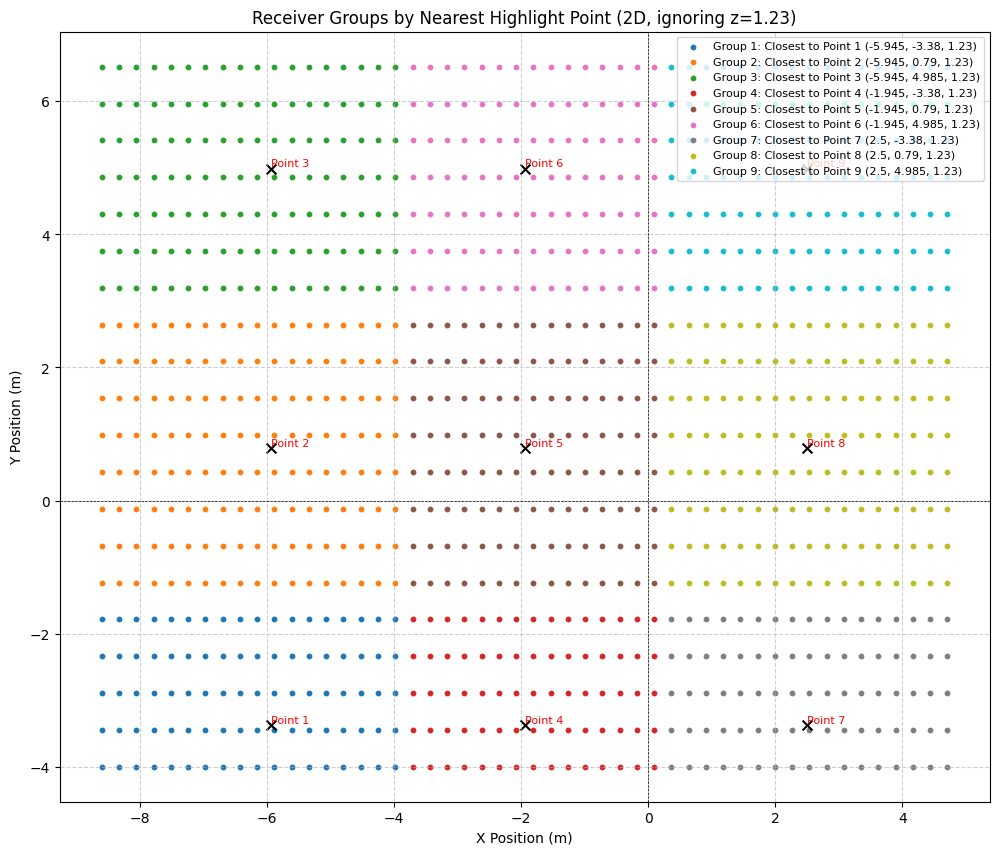

In [69]:

import os
import numpy as np
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load the XML file
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()

# Extract receiver positions from XML
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))

# Convert to numpy array for easy manipulation
receiver_positions = np.array(receiver_positions)

# Highlighted points with names only (no gains)
highlight_points = [
    {
        "name": "Point 1",
        "position": (-5.945, -3.38, 1.23),
    },
    {
        "name": "Point 2",
        "position": (-5.945, 0.79, 1.23),
    },
    {
        "name": "Point 3",
        "position": (-5.945, 4.985, 1.23),
    },
    {
        "name": "Point 4",
        "position": (-1.945, -3.38, 1.23),
    },
    {
        "name": "Point 5",
        "position": (-1.945, 0.79, 1.23),
    },
    {
        "name": "Point 6",
        "position": (-1.945, 4.985, 1.23),
    },
    {
        "name": "Point 7",
        "position": (2.5, -3.38, 1.23),
    },
    {
        "name": "Point 8",
        "position": (2.5, 0.79, 1.23),
    },
    {
        "name": "Point 9",
        "position": (2.5, 4.985, 1.23),
    },
]

# Print each highlight point in full 3D
print("Highlight Points:")
for idx, point in enumerate(highlight_points):
    x, y, z = point["position"]
    print(f'{point["name"]}: Receiver Position = ({x}, {y}, {z})')

# Prepare an array of highlight positions in 2D (ignore z for clustering)
highlight_positions_2d = np.array([(p["position"][0], p["position"][1]) for p in highlight_points])

# Convert the receiver positions to 2D as well
receiver_positions_2d = receiver_positions[:, :2]  # Take only x, y

# Compute distances from each receiver to each highlight point (2D)
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Count how many receivers belong to each group
unique_groups, group_counts = np.unique(group_indices, return_counts=True)

# Assign a unique color to each group
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_groups)))

# Plot the receivers grouped by nearest highlight point
plt.figure(figsize=(12, 10))
for group_idx, color in zip(unique_groups, colors):
    group_receivers = receiver_positions[group_indices == group_idx]
    plt.scatter(
        group_receivers[:, 0],
        group_receivers[:, 1],
        color=color, s=10,
        label=(
            f'Group {group_idx+1}: '
            f'Closest to {highlight_points[group_idx]["name"]} '
            f'({highlight_points[group_idx]["position"][0]}, '
            f'{highlight_points[group_idx]["position"][1]}, '
            f'{highlight_points[group_idx]["position"][2]})'
        )
    )

# Plot the highlight points in 2D (only x and y)
for point in highlight_points:
    name = point["name"]
    x, y, z = point["position"]
    plt.scatter(x, y, c='black', s=50, marker='x')
    plt.text(x, y, f'{name}', fontsize=8, color='red', ha='left', va='bottom')

# Customize the plot
plt.xlabel('X Position (m)')
plt.ylabel('Y Position (m)')
plt.title('Receiver Groups by Nearest Highlight Point (2D, ignoring z=1.23)')
plt.axhline(0, color='black', linewidth=0.5, linestyle='--')
plt.axvline(0, color='black', linewidth=0.5, linestyle='--')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc='upper right', fontsize=8)
plt.show()


## Show Highlight Points

Highlight Points:
Point 1: Position = (x=-5.945, y=-3.38, z=1.23)
Point 2: Position = (x=-5.945, y=0.79, z=1.23)
Point 3: Position = (x=-5.945, y=4.985, z=1.23)
Point 4: Position = (x=-1.945, y=-3.38, z=1.23)
Point 5: Position = (x=-1.945, y=0.79, z=1.23)
Point 6: Position = (x=-1.945, y=4.985, z=1.23)
Point 7: Position = (x=2.5, y=-3.38, z=1.23)
Point 8: Position = (x=2.5, y=0.79, z=1.23)
Point 9: Position = (x=2.5, y=4.985, z=1.23)


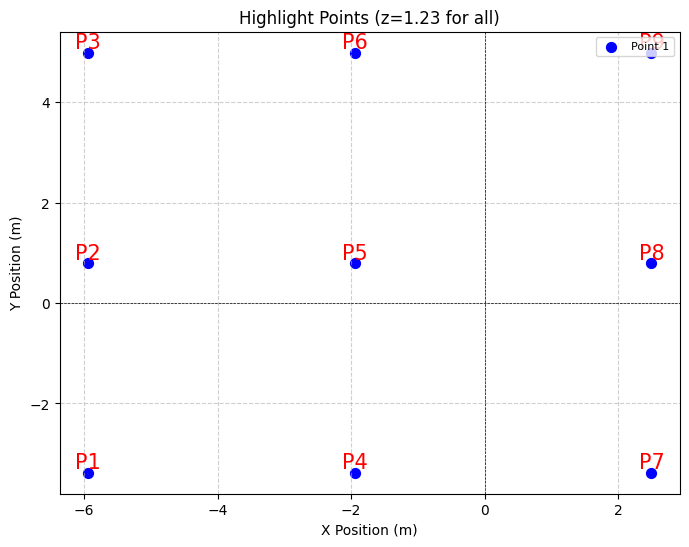

In [75]:
import matplotlib.pyplot as plt

# Highlighted points, each with 3D coordinates (x, y, z = 1.23)
highlight_points = [
    {"position": (-5.945, -3.38, 1.23)},
    {"position": (-5.945, 0.79, 1.23)},
    {"position": (-5.945, 4.985, 1.23)},
    {"position": (-1.945, -3.38, 1.23)},
    {"position": (-1.945, 0.79, 1.23)},
    {"position": (-1.945, 4.985, 1.23)},
    {"position": (2.5, -3.38, 1.23)},  # Additional points without gains
    {"position": (2.5, 0.79, 1.23)},
    {"position": (2.5, 4.985, 1.23)}
]

# Extract positions
positions = [p["position"] for p in highlight_points]

# Print each highlight point (including z=1.23)
print("Highlight Points:")
for idx, point in enumerate(highlight_points):
    x, y, z = point['position']
    print(f"Point {idx+1}: Position = (x={x}, y={y}, z={z})")

# 2D plotting of highlight points (only x, y used)
plt.figure(figsize=(8, 6))
for idx, point in enumerate(highlight_points):
    x, y, z = point["position"]
    plt.scatter(x, y, c='blue', s=50, label=f"Point {idx+1}" if idx == 0 else "")
    # Show only the label "P{idx+1}" without gain info
    plt.text(x, y, f"P{idx+1}", fontsize=15, color='red', ha='center', va='bottom')

# Customize the plot
plt.xlabel('X Position (m)')
plt.ylabel('Y Position (m)')
plt.title('Highlight Points (z=1.23 for all)')
plt.axhline(0, color='black', linewidth=0.5, linestyle='--')
plt.axvline(0, color='black', linewidth=0.5, linestyle='--')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc='upper right', fontsize=8)
plt.show()



## Save Groups to xml along with highlight Points

In [76]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# =====================
# Existing Code: Grouping
# =====================

# Load the XML file
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()

# Extract receiver positions from XML
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlight points (no gains)
highlight_points = [
    {"name": "Point 1", "position": (-5.945, -3.38, 1.23)},
    {"name": "Point 2", "position": (-5.945, 0.79, 1.23)},
    {"name": "Point 3", "position": (-5.945, 4.985, 1.23)},
    {"name": "Point 4", "position": (-1.945, -3.38, 1.23)},
    {"name": "Point 5", "position": (-1.945, 0.79, 1.23)},
    {"name": "Point 6", "position": (-1.945, 4.985, 1.23)},
    {"name": "Point 7", "position": (2.5, -3.38, 1.23)},
    {"name": "Point 8", "position": (2.5, 0.79, 1.23)},
    {"name": "Point 9", "position": (2.5, 4.985, 1.23)},
]

# Convert highlight points to 2D array
highlight_positions_2d = np.array([(p["position"][0], p["position"][1]) for p in highlight_points])
# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute pairwise distances (2D)
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)
# Determine which highlight point is closest for each receiver
group_indices = np.argmin(distances, axis=1)

# Identify how many unique groups we have
unique_groups, group_counts = np.unique(group_indices, return_counts=True)

# =====================
# New Code: Saving to XML
# =====================

# Create an XML root element
root_groups = ET.Element("Groups")

for group_idx in unique_groups:
    # Create a <Group> element with a 'name' attribute
    group_elem = ET.SubElement(root_groups, "Group", name=f"Group {group_idx+1}")

    # Sub-element to store the highlight point's coordinates
    px, py, pz = highlight_points[group_idx]["position"]
    pointcoords = ET.SubElement(group_elem, "PointCoordinates")
    pointcoords.text = f"{px}, {py}, {pz}"

    # Add each receiver that belongs to this group
    group_receivers = receiver_positions[group_indices == group_idx]
    for rpos in group_receivers:
        rx_elem = ET.SubElement(group_elem, "Receiver")
        ET.SubElement(rx_elem, "X").text = str(rpos[0])
        ET.SubElement(rx_elem, "Y").text = str(rpos[1])
        ET.SubElement(rx_elem, "Z").text = str(rpos[2])

# Create a directory if necessary
output_file = "ris(decreasedsize)_optimization_results/grouped_receivers.xml"
os.makedirs(os.path.dirname(output_file), exist_ok=True)

# Write out the XML
tree_out = ET.ElementTree(root_groups)
tree_out.write(output_file, encoding="utf-8", xml_declaration=True)

print(f"Grouping information saved to {output_file}")

# =====================
# Optional: Plotting
# =====================

# You can add your existing plotting code below if desired.


Grouping information saved to ris(decreasedsize)_optimization_results/grouped_receivers.xml


## Test Saved Grouped Data

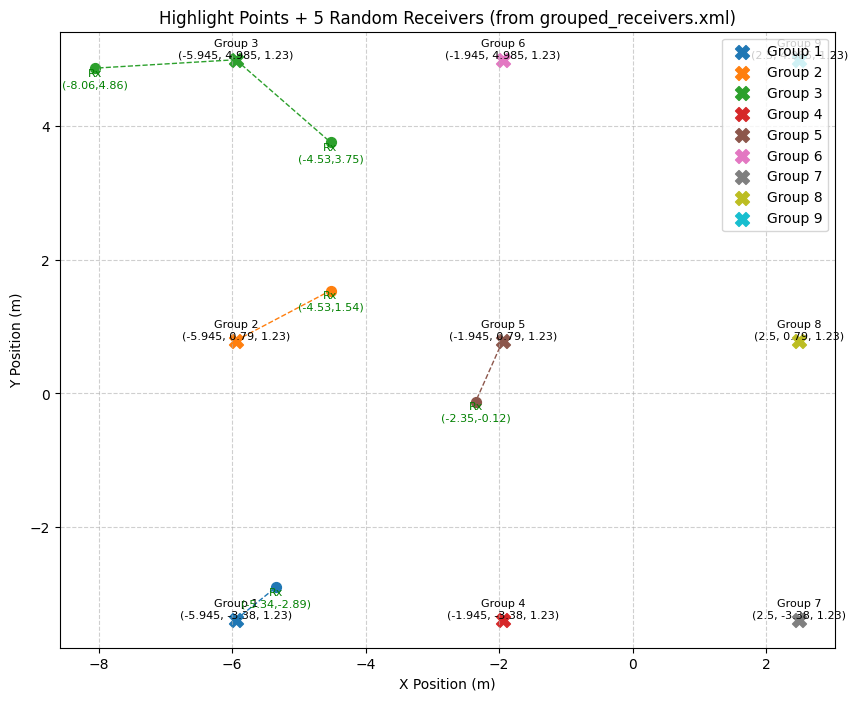

In [77]:
import os
import random
import xml.etree.ElementTree as ET

import numpy as np
import matplotlib.pyplot as plt


##########################################
# 1) Load "grouped_receivers.xml"
##########################################

xml_file = "ris(decreasedsize)_optimization_results/grouped_receivers.xml"

tree = ET.parse(xml_file)
root = tree.getroot()

# Data structure to hold group info
# group_data = [
#   {
#     "group_name": "Group 1",
#     "point_coords": (px, py, pz),
#     "receivers": [(rx1, ry1, rz1), (rx2, ry2, rz2), ...]
#   },
#   ...
# ]

group_data = []
for group_elem in root.findall('Group'):
    group_name = group_elem.get('name', 'Unknown Group')
    # Read the highlight point's coordinate text
    coords_text = group_elem.find('PointCoordinates').text.strip()  # e.g. "-5.945, -3.38, 1.23"
    px, py, pz = [float(v) for v in coords_text.split(',')]
    
    # Collect all receivers in this group
    receivers = []
    for rx_elem in group_elem.findall('Receiver'):
        rx = float(rx_elem.find('X').text)
        ry = float(rx_elem.find('Y').text)
        rz = float(rx_elem.find('Z').text)
        receivers.append((rx, ry, rz))
    
    group_data.append({
        "group_name": group_name,
        "point_coords": (px, py, pz),
        "receivers": receivers
    })

# Combine *all* receivers into a single list for random sampling
all_receivers = []
for gd in group_data:
    gname = gd["group_name"]
    px, py, pz = gd["point_coords"]
    for (rx, ry, rz) in gd["receivers"]:
        all_receivers.append({
            "group_name": gname,
            "group_point": (px, py, pz),
            "receiver": (rx, ry, rz)
        })

##########################################
# 2) Plot highlight points in 2D
#    (only x, y are used)
##########################################

plt.figure(figsize=(10, 8))

# Colors for the highlight points
colors_for_points = plt.cm.tab10(np.linspace(0, 1, len(group_data)))

for idx, gd in enumerate(group_data):
    (px, py, pz) = gd["point_coords"]
    # Plot highlight point as black 'X'
    plt.scatter(px, py, color=colors_for_points[idx], s=100, marker='X', label=gd["group_name"])
    # Annotate the highlight point
    plt.text(px, py, f'{gd["group_name"]}\n({px}, {py}, {pz})',
             fontsize=8, color='black', ha='center', va='bottom')


##########################################
# 3) Randomly pick 5 receivers to illustrate
##########################################

num_receivers_to_pick = 5

if len(all_receivers) < num_receivers_to_pick:
    print(f"Warning: Less than {num_receivers_to_pick} total receivers. Will plot all available.")
    random_receivers = all_receivers
else:
    random_receivers = random.sample(all_receivers, num_receivers_to_pick)

# Plot those 5 random receivers + connect them to the highlight point
for rd in random_receivers:
    gname = rd["group_name"]
    px, py, pz = rd["group_point"]
    rx, ry, rz = rd["receiver"]
    
    # We find the color index for this group by matching the group name
    # (assuming the group order is the same as loaded)
    group_idx = None
    for i, gd in enumerate(group_data):
        if gd["group_name"] == gname:
            group_idx = i
            break
    
    if group_idx is None:
        # Should not happen, but just in case
        col = 'blue'
    else:
        col = colors_for_points[group_idx]
    
    # Plot the receiver as a circle
    plt.scatter(rx, ry, color=col, s=50, marker='o')
    # Label the point
    plt.text(rx, ry, f'Rx\n({rx:.2f},{ry:.2f})', fontsize=8, color='green', ha='center', va='top')
    
    # Draw a line from the highlight point -> this receiver
    plt.plot([px, rx], [py, ry], color=col, linewidth=1, linestyle='--')

##########################################
# 4) Final plot adjustments
##########################################

plt.xlabel("X Position (m)")
plt.ylabel("Y Position (m)")
plt.title(f"Highlight Points + 5 Random Receivers (from grouped_receivers.xml)")
plt.grid(True, linestyle='--', alpha=0.6)

# Optionally, show a single combined legend. 
# We already labeled highlight points, so we only add a legend for them.
plt.legend(loc='upper right')
plt.show()


# Trained DNN for Codebook selection

Epoch 1/20
25/25 [==============================] - 1s 8ms/step - loss: 1.9220 - accuracy: 0.3088 - val_loss: 1.5444 - val_accuracy: 0.5650
Epoch 2/20
25/25 [==============================] - 0s 3ms/step - loss: 1.3199 - accuracy: 0.6350 - val_loss: 1.1101 - val_accuracy: 0.7250
Epoch 3/20
25/25 [==============================] - 0s 3ms/step - loss: 0.9701 - accuracy: 0.7387 - val_loss: 0.8755 - val_accuracy: 0.7050
Epoch 4/20
25/25 [==============================] - 0s 3ms/step - loss: 0.7728 - accuracy: 0.7550 - val_loss: 0.7542 - val_accuracy: 0.7450
Epoch 5/20
25/25 [==============================] - 0s 4ms/step - loss: 0.6625 - accuracy: 0.7675 - val_loss: 0.6634 - val_accuracy: 0.7750
Epoch 6/20
25/25 [==============================] - 0s 4ms/step - loss: 0.5892 - accuracy: 0.7788 - val_loss: 0.6137 - val_accuracy: 0.8050
Epoch 7/20
25/25 [==============================] - 0s 4ms/step - loss: 0.5392 - accuracy: 0.8000 - val_loss: 0.5597 - val_accuracy: 0.8050
Epoch 8/20
25/25 [==

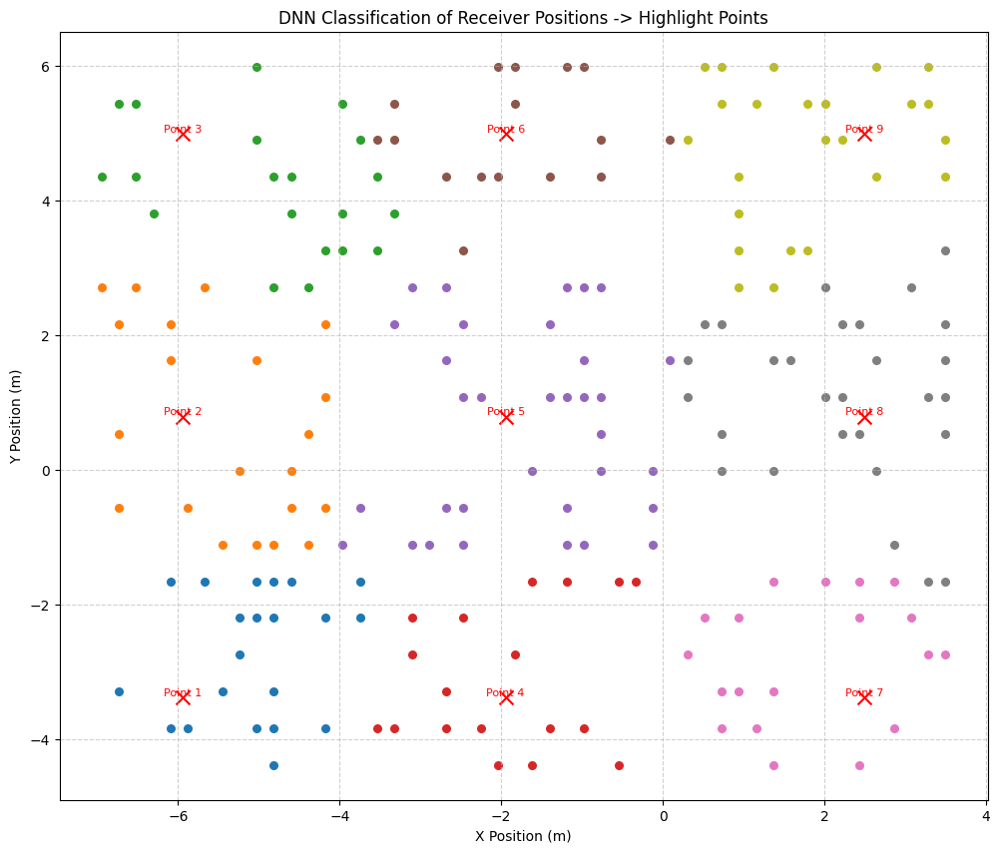

In [80]:
import os
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

###############################################################################
# 1) DEFINE HIGHLIGHT POINTS
###############################################################################

# Nine highlight points (x,y,z); only (x,y) is used for classification.
highlight_points = [
    {"name": "Point 1", "position": (-5.945, -3.38, 1.23)},
    {"name": "Point 2", "position": (-5.945, 0.79, 1.23)},
    {"name": "Point 3", "position": (-5.945, 4.985, 1.23)},
    {"name": "Point 4", "position": (-1.945, -3.38, 1.23)},
    {"name": "Point 5", "position": (-1.945, 0.79, 1.23)},
    {"name": "Point 6", "position": (-1.945, 4.985, 1.23)},
    {"name": "Point 7", "position": (2.5, -3.38, 1.23)},
    {"name": "Point 8", "position": (2.5, 0.79, 1.23)},
    {"name": "Point 9", "position": (2.5, 4.985, 1.23)},
]

###############################################################################
# 2) GENERATE (OR LOAD) RECEIVER POSITIONS
###############################################################################

# Determine bounding box from highlight points (x, y)
all_hp_xy = np.array([(p["position"][0], p["position"][1]) for p in highlight_points])
x_min, y_min = all_hp_xy.min(axis=0)
x_max, y_max = all_hp_xy.max(axis=0)

# Expand bounding region slightly
x_min -= 1.0
x_max += 1.0
y_min -= 1.0
y_max += 1.0

# Create a 20 x 50 grid
x_vals = np.linspace(x_min, x_max, 50)
y_vals = np.linspace(y_min, y_max, 20)
X_grid, Y_grid = np.meshgrid(x_vals, y_vals)

# Flatten and add z=1.23 (height)
receiver_positions = np.c_[
    X_grid.ravel(), 
    Y_grid.ravel(),
    np.full(X_grid.size, 1.23)
]

###############################################################################
# 3) ASSIGN RECEIVERS TO NEAREST HIGHLIGHT POINT
###############################################################################

def assign_highlight_points(receiver_positions, highlight_points):
    """Returns the index of the nearest highlight point for each receiver."""
    # Convert highlight points to 2D
    hp_2d = np.array([(p["position"][0], p["position"][1]) for p in highlight_points])
    # Convert receivers to 2D
    receivers_2d = receiver_positions[:, :2]

    # Compute pairwise distances (scipy.spatial.distance.cdist)
    dist_mat = distance.cdist(receivers_2d, hp_2d)
    # Argmin over highlight points
    group_indices = np.argmin(dist_mat, axis=1)
    return group_indices

group_indices = assign_highlight_points(receiver_positions, highlight_points)

###############################################################################
# 4) PREPARE DATA FOR DNN
###############################################################################

# X = (x,y) coordinates only
X = receiver_positions[:, :2]  

# y = group index in [0..8], for 9 highlight points
num_groups = len(highlight_points)
y = to_categorical(group_indices, num_classes=num_groups)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

###############################################################################
# 5) BUILD AND TRAIN A SIMPLE DNN
###############################################################################

def build_dnn(input_dim, output_dim):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dense(64, activation='relu'),
        Dense(output_dim, activation='softmax')  # classification
    ])
    model.compile(optimizer='adam', 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])
    return model

model = build_dnn(input_dim=2, output_dim=num_groups)

# Train the DNN
model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_data=(X_test, y_test)
)

###############################################################################
# 6) EVALUATE AND SAVE THE MODEL (KERAS FORMAT)
###############################################################################

loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy*100:.2f}%")

# SAVE the trained model in native Keras (recommended) format
save_dir = "ris(decreasedsize)_optimization_results"
os.makedirs(save_dir, exist_ok=True)
model_save_path = os.path.join(save_dir, "dnn_highlight_classification_model.keras")

model.save(model_save_path)  # This line uses the native Keras format
print(f"Trained DNN model saved to: {model_save_path}")

###############################################################################
# 7) VISUALIZE PREDICTIONS ON TEST SET
###############################################################################

predictions = model.predict(X_test)
pred_classes = np.argmax(predictions, axis=1)
actual_classes = np.argmax(y_test, axis=1)

plt.figure(figsize=(12, 10))

# Plot highlight points as references (x, y only)
for i, hp in enumerate(highlight_points):
    px, py, pz = hp["position"]
    plt.scatter(px, py, color="red", marker="x", s=100)
    plt.text(px, py, f"{hp['name']}", fontsize=8, color="red", ha="center", va="bottom")

# Plot test samples colored by predicted group
for i, coords in enumerate(X_test):
    c_idx = pred_classes[i]
    color = plt.cm.tab10(c_idx / num_groups)
    plt.scatter(coords[0], coords[1], color=color, s=30)

plt.xlabel("X Position (m)")
plt.ylabel("Y Position (m)")
plt.title("DNN Classification of Receiver Positions -> Highlight Points")
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


# Name


In [144]:
import os
import random
import math
import numpy as np
import xml.etree.ElementTree as ET

import tensorflow as tf
from tensorflow.keras.models import load_model

###############################################################################
# 1) LOAD ALL RECEIVERS
###############################################################################

xml_file = "ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
print(f"Loading receiver data from: {xml_file}")

tree = ET.parse(xml_file)
root = tree.getroot()

receivers_data = []
for rcv_elem in root.findall("Receiver"):
    x = float(rcv_elem.find("X").text)
    y = float(rcv_elem.find("Y").text)
    z = float(rcv_elem.find("Z").text)
    ch_coeff_text = rcv_elem.find("ChannelCoefficient").text
    channel_coeff = complex(ch_coeff_text.replace(" ", ""))  # parse string to complex

    receivers_data.append({
        "x": x, "y": y, "z": z,
        "channel_coeff": channel_coeff
    })

print(f"[INFO] Found {len(receivers_data)} receivers in the XML file.")

###############################################################################
# 2) LOAD TRAINED DNN
###############################################################################

dnn_model_path = "ris(decreasedsize)_optimization_results/dnn_highlight_classification_model.keras"
print(f"\n[INFO] Loading trained DNN from: {dnn_model_path}")
model = load_model(dnn_model_path)

###############################################################################
# 3) PICK A RECEIVER UNTIL ITS GROUP IS NOT 8 OR 9
###############################################################################
#   - Group 8 => zero-based index 7
#   - Group 9 => zero-based index 8
# If the DNN returns group 7 or 8, we skip that receiver and pick another.

picked_receiver = None
predicted_group_idx = None
while True:
    # Randomly pick a receiver
    candidate_receiver = random.choice(receivers_data)

    # Compute original RSS in dB
    rss_linear = abs(candidate_receiver["channel_coeff"])**2
    rss_db = 10 * math.log10(rss_linear)

    # Predict group
    input_xy = np.array([[candidate_receiver["x"], candidate_receiver["y"]]], dtype=np.float32)
    pred_probs = model.predict(input_xy, verbose=0)
    candidate_group_idx = np.argmax(pred_probs, axis=1)[0]

    # Check if group is 8 or 9
    if candidate_group_idx in [7, 8]:
        print(f"\n[WARN] Picked receiver belongs to Group {candidate_group_idx+1}, skipping and picking new receiver...")
        continue

    # Otherwise, we accept this receiver
    picked_receiver = candidate_receiver
    predicted_group_idx = candidate_group_idx
    print("\n[INFO] Successfully picked a random receiver that is NOT Group 8 or Group 9.")
    print(f"   Position = ({picked_receiver['x']}, {picked_receiver['y']}, {picked_receiver['z']})")
    print(f"   Channel Coefficient = {picked_receiver['channel_coeff']}")
    print(f"   Original RSS = {rss_db:.2f} dB")
    print(f"   DNN predicted group index = {predicted_group_idx} (Point {predicted_group_idx+1})")
    break

###############################################################################
# 4) LOAD RIS PHASE/AMPLITUDES FOR THIS GROUP
###############################################################################

ris_phases_file = "ris(decreasedsize)_optimization_results/optimized_ris_phases.xml"
print(f"\n[INFO] Loading RIS phases/amplitudes from: {ris_phases_file}")
tree_ris = ET.parse(ris_phases_file)
root_ris = tree_ris.getroot()

point_label = f"Point {predicted_group_idx+1}"
chosen_point_elem = None
for point_elem in root_ris.findall("Point"):
    if point_elem.get("name") == point_label:
        chosen_point_elem = point_elem
        break

if chosen_point_elem is None:
    raise ValueError(f"Could not find <Point name='{point_label}'> in {ris_phases_file}!")

phase_profile_elem = chosen_point_elem.find("PhaseProfile")
phase_values = [float(val_elem.text) for val_elem in phase_profile_elem.findall("Value")]

amplitude_profile_elem = chosen_point_elem.find("AmplitudeProfile")
amplitude_values = [float(val_elem.text) for val_elem in amplitude_profile_elem.findall("Value")]

print(f"[INFO] Found phase/amplitude for {point_label}")
print(f"   #phase_values = {len(phase_values)}")
print(f"   #amplitude_values = {len(amplitude_values)}")

###############################################################################
# 5) APPLY PHASES/AMPS & COMPUTE NEW CHANNEL COEFFICIENT
###############################################################################
# Placeholder for actual Sionna usage:
#   ris.phase_profile.values = ...
#   ris.amplitude_profile.values = ...
#   new_paths = scene.compute_paths()
#   new_channel_coeff = ...

print("[INFO] Applying phase/amplitude to scene (placeholder).")
new_channel_coeff = complex(0.002, 1e-5)  # placeholder
new_rss_linear = abs(new_channel_coeff)**2
new_rss_db = 10 * math.log10(new_rss_linear)

print(f"[INFO] New channel coefficient = {new_channel_coeff}")
print(f"[INFO] New RSS = {new_rss_db:.2f} dB")

###############################################################################
# DONE
###############################################################################
print("\n[INFO] Done. We ended up with a random receiver that is not in Group 8 or 9, "
      "applied the corresponding RIS settings, and computed the new RSS in dB.")


Loading receiver data from: ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml
[INFO] Found 1000 receivers in the XML file.

[INFO] Loading trained DNN from: ris(decreasedsize)_optimization_results/dnn_highlight_classification_model.keras

[INFO] Successfully picked a random receiver that is NOT Group 8 or Group 9.
   Position = (-2.352448979591837, -1.7852631578947369, 1.23)
   Channel Coefficient = (0.013298866+2.6719916e-05j)
   Original RSS = -37.52 dB
   DNN predicted group index = 3 (Point 4)

[INFO] Loading RIS phases/amplitudes from: ris(decreasedsize)_optimization_results/optimized_ris_phases.xml
[INFO] Found phase/amplitude for Point 4
   #phase_values = 528
   #amplitude_values = 528
[INFO] Applying phase/amplitude to scene (placeholder).
[INFO] New channel coefficient = (0.002+1e-05j)
[INFO] New RSS = -53.98 dB

[INFO] Done. We ended up with a random receiver that is not in Group 8 or 9, applied the corresponding RIS settings, and computed the ne

# Group 1 Receiver Points

In [8]:
import xml.etree.ElementTree as ET
import numpy as np
from scipy.spatial import distance

# Load the XML file
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()

# Extract receiver positions from XML
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))

# Convert to numpy array for easy manipulation
receiver_positions = np.array(receiver_positions)

# Highlighted points (only positions are needed here)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 1 receiver points (index 0 corresponds to Point 1)
group_1_index = 0
group_1_receivers = receiver_positions[group_indices == group_1_index]

# Print Group 1 receiver points
print("Group 1 Receiver Points:")
for i, position in enumerate(group_1_receivers):
    print(f"Receiver {i + 1}: (X: {position[0]}, Y: {position[1]}, Z: {position[2]})")


Group 1 Receiver Points:
Receiver 1: (X: -8.6, Y: -4.0, Z: 1.23)
Receiver 2: (X: -8.6, Y: -3.446315789473684, Z: 1.23)
Receiver 3: (X: -8.6, Y: -2.8926315789473684, Z: 1.23)
Receiver 4: (X: -8.6, Y: -2.338947368421053, Z: 1.23)
Receiver 5: (X: -8.6, Y: -1.7852631578947369, Z: 1.23)
Receiver 6: (X: -8.328367346938775, Y: -4.0, Z: 1.23)
Receiver 7: (X: -8.328367346938775, Y: -3.446315789473684, Z: 1.23)
Receiver 8: (X: -8.328367346938775, Y: -2.8926315789473684, Z: 1.23)
Receiver 9: (X: -8.328367346938775, Y: -2.338947368421053, Z: 1.23)
Receiver 10: (X: -8.328367346938775, Y: -1.7852631578947369, Z: 1.23)
Receiver 11: (X: -8.056734693877551, Y: -4.0, Z: 1.23)
Receiver 12: (X: -8.056734693877551, Y: -3.446315789473684, Z: 1.23)
Receiver 13: (X: -8.056734693877551, Y: -2.8926315789473684, Z: 1.23)
Receiver 14: (X: -8.056734693877551, Y: -2.338947368421053, Z: 1.23)
Receiver 15: (X: -8.056734693877551, Y: -1.7852631578947369, Z: 1.23)
Receiver 16: (X: -7.7851020408163265, Y: -4.0, Z: 1.23)

In [12]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters and receivers
scene.tx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="tr38901", 
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="dipole", 
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

# Ensure total_elements matches
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)
scene.add(ris)

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 1"

# Extract phase and amplitude profiles
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Update RIS profiles
phase_profile_np = np.array(phase_profile, dtype=np.float32)
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32)

# Reshape to match RIS shape
expected_shape = (1, num_rows, num_cols)
phase_profile_np = phase_profile_np.reshape(expected_shape)
amplitude_profile_np = amplitude_profile_np.reshape(expected_shape)

# Assign reshaped profiles to RIS
ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Receiver positions
receiver_positions = [
    [-8.6, -4.0, 1.23],
    [-8.6, -3.446315789473684, 1.23],
    [-8.6, -2.8926315789473684, 1.23],
    [-8.6, -2.338947368421053, 1.23],
    [-8.6, -1.7852631578947369, 1.23],
    [-8.328367346938775, -4.0, 1.23],
    [-8.328367346938775, -3.446315789473684, 1.23],
    [-8.328367346938775, -2.8926315789473684, 1.23],
    [-8.328367346938775, -2.338947368421053, 1.23],
    [-8.328367346938775, -1.7852631578947369, 1.23],
    [-8.056734693877551, -4.0, 1.23],
    [-8.056734693877551, -3.446315789473684, 1.23],
    [-8.056734693877551, -2.8926315789473684, 1.23],
    [-8.056734693877551, -2.338947368421053, 1.23],
    [-8.056734693877551, -1.7852631578947369, 1.23],
    [-7.7851020408163265, -4.0, 1.23],
    [-7.7851020408163265, -3.446315789473684, 1.23],
    [-7.7851020408163265, -2.8926315789473684, 1.23],
    [-7.7851020408163265, -2.338947368421053, 1.23],
    [-7.7851020408163265, -1.7852631578947369, 1.23],
    [-7.5134693877551015, -4.0, 1.23],
    [-7.5134693877551015, -3.446315789473684, 1.23],
    [-7.5134693877551015, -2.8926315789473684, 1.23],
    [-7.5134693877551015, -2.338947368421053, 1.23],
    [-7.5134693877551015, -1.7852631578947369, 1.23],
    [-7.2418367346938775, -4.0, 1.23],
    [-7.2418367346938775, -3.446315789473684, 1.23],
    [-7.2418367346938775, -2.8926315789473684, 1.23],
    [-7.2418367346938775, -2.338947368421053, 1.23],
    [-7.2418367346938775, -1.7852631578947369, 1.23],
    [-6.970204081632653, -4.0, 1.23],
    [-6.970204081632653, -3.446315789473684, 1.23],
    [-6.970204081632653, -2.8926315789473684, 1.23],
    [-6.970204081632653, -2.338947368421053, 1.23],
    [-6.970204081632653, -1.7852631578947369, 1.23],
    [-6.698571428571428, -4.0, 1.23],
    [-6.698571428571428, -3.446315789473684, 1.23],
    [-6.698571428571428, -2.8926315789473684, 1.23],
    [-6.698571428571428, -2.338947368421053, 1.23],
    [-6.698571428571428, -1.7852631578947369, 1.23],
    [-6.426938775510203, -4.0, 1.23],
    [-6.426938775510203, -3.446315789473684, 1.23],
    [-6.426938775510203, -2.8926315789473684, 1.23],
    [-6.426938775510203, -2.338947368421053, 1.23],
    [-6.426938775510203, -1.7852631578947369, 1.23],
    [-6.155306122448979, -4.0, 1.23],
    [-6.155306122448979, -3.446315789473684, 1.23],
    [-6.155306122448979, -2.8926315789473684, 1.23],
    [-6.155306122448979, -2.338947368421053, 1.23],
    [-6.155306122448979, -1.7852631578947369, 1.23],
    [-5.883673469387755, -4.0, 1.23],
    [-5.883673469387755, -3.446315789473684, 1.23],
    [-5.883673469387755, -2.8926315789473684, 1.23],
    [-5.883673469387755, -2.338947368421053, 1.23],
    [-5.883673469387755, -1.7852631578947369, 1.23],
    [-5.61204081632653, -4.0, 1.23],
    [-5.61204081632653, -3.446315789473684, 1.23],
    [-5.61204081632653, -2.8926315789473684, 1.23],
    [-5.61204081632653, -2.338947368421053, 1.23],
    [-5.61204081632653, -1.7852631578947369, 1.23],
    [-5.340408163265306, -4.0, 1.23],
    [-5.340408163265306, -3.446315789473684, 1.23],
    [-5.340408163265306, -2.8926315789473684, 1.23],
    [-5.340408163265306, -2.338947368421053, 1.23],
    [-5.340408163265306, -1.7852631578947369, 1.23],
    [-5.068775510204082, -4.0, 1.23],
    [-5.068775510204082, -3.446315789473684, 1.23],
    [-5.068775510204082, -2.8926315789473684, 1.23],
    [-5.068775510204082, -2.338947368421053, 1.23],
    [-5.068775510204082, -1.7852631578947369, 1.23],
    [-4.797142857142857, -4.0, 1.23],
    [-4.797142857142857, -3.446315789473684, 1.23],
    [-4.797142857142857, -2.8926315789473684, 1.23],
    [-4.797142857142857, -2.338947368421053, 1.23],
    [-4.797142857142857, -1.7852631578947369, 1.23],
    [-4.525510204081632, -4.0, 1.23],
    [-4.525510204081632, -3.446315789473684, 1.23],
    [-4.525510204081632, -2.8926315789473684, 1.23],
    [-4.525510204081632, -2.338947368421053, 1.23],
    [-4.525510204081632, -1.7852631578947369, 1.23],
    [-4.253877551020408, -4.0, 1.23],
    [-4.253877551020408, -3.446315789473684, 1.23],
    [-4.253877551020408, -2.8926315789473684, 1.23],
    [-4.253877551020408, -2.338947368421053, 1.23],
    [-4.253877551020408, -1.7852631578947369, 1.23],
    [-3.982244897959184, -4.0, 1.23],
    [-3.982244897959184, -3.446315789473684, 1.23],
    [-3.982244897959184, -2.8926315789473684, 1.23],
    [-3.982244897959184, -2.338947368421053, 1.23],
    [-3.982244897959184, -1.7852631578947369, 1.23]
]


# Create a new XML file to save RSS values
output_file = './ris(decreasedsize)_optimization_results/rss_results.xml'
output_root = ET.Element("RSSResults")

# Iterate over receiver positions and compute RSS
for idx, position in enumerate(receiver_positions):
    rx_name = f"rx_{idx}"
    rx = Receiver(name=rx_name, position=position, orientation=[0, 0, 0])
    scene.add(rx)

    # Compute propagation paths
    paths = scene.compute_paths(max_depth=5, num_samples=int(1e6))
    total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

    # Calculate RSS
    rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
    rss_db = to_db(rss_linear).numpy()

    # Save results to XML
    rx_element = ET.SubElement(output_root, "Receiver")
    ET.SubElement(rx_element, "X").text = str(position[0])
    ET.SubElement(rx_element, "Y").text = str(position[1])
    ET.SubElement(rx_element, "Z").text = str(position[2])
    ET.SubElement(rx_element, "RSS_dB").text = f"{rss_db:.2f}"

    print(f"Receiver Position {idx+1}: {position}")
    print(f"RSS for {point_label} (Receiver {idx+1}): {rss_db:.2f} dB")

    # Remove receiver from the scene
    scene.remove(rx_name)

# Write the XML file
output_tree = ET.ElementTree(output_root)
output_tree.write(output_file, encoding="utf-8", xml_declaration=True)
print(f"RSS results saved to {output_file}")


Receiver Position 1: [-8.6, -4.0, 1.23]
RSS for Point 1 (Receiver 1): -64.87 dB
Receiver Position 2: [-8.6, -3.446315789473684, 1.23]
RSS for Point 1 (Receiver 2): -65.61 dB
Receiver Position 3: [-8.6, -2.8926315789473684, 1.23]
RSS for Point 1 (Receiver 3): -65.20 dB
Receiver Position 4: [-8.6, -2.338947368421053, 1.23]
RSS for Point 1 (Receiver 4): -65.91 dB
Receiver Position 5: [-8.6, -1.7852631578947369, 1.23]
RSS for Point 1 (Receiver 5): -69.22 dB
Receiver Position 6: [-8.328367346938775, -4.0, 1.23]
RSS for Point 1 (Receiver 6): -63.83 dB
Receiver Position 7: [-8.328367346938775, -3.446315789473684, 1.23]
RSS for Point 1 (Receiver 7): -65.02 dB
Receiver Position 8: [-8.328367346938775, -2.8926315789473684, 1.23]
RSS for Point 1 (Receiver 8): -65.16 dB
Receiver Position 9: [-8.328367346938775, -2.338947368421053, 1.23]
RSS for Point 1 (Receiver 9): -65.61 dB
Receiver Position 10: [-8.328367346938775, -1.7852631578947369, 1.23]
RSS for Point 1 (Receiver 10): -68.37 dB
Receiver Pos

In [2]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Import Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Set random seed for reproducibility
sionna.config.seed = 42

# Helper function to convert to dB
def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for all transmitters and receivers
scene.tx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="tr38901", 
    polarization="V"
)

scene.rx_array = PlanarArray(
    num_rows=1, 
    num_cols=1, 
    vertical_spacing=0.5, 
    horizontal_spacing=0.5, 
    pattern="dipole", 
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and compute wavelength
scene.frequency = 2.14e9  # in Hz
c = 3e8  # Speed of light
wavelength = c / scene.frequency

# Configure RIS
total_elements = 528
num_rows = int(np.sqrt(total_elements))
num_cols = total_elements // num_rows

# Ensure total_elements matches
if num_rows * num_cols != total_elements:
    num_cols += 1

ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)
scene.add(ris)

# Load RIS optimization results from XML
xml_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
tree = ET.parse(xml_file)
root = tree.getroot()
point_label = "Point 1"

# Extract phase and amplitude profiles
for point in root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Update RIS profiles
phase_profile_np = np.array(phase_profile, dtype=np.float32)
amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32)

# Reshape to match RIS shape
expected_shape = (1, num_rows, num_cols)
phase_profile_np = phase_profile_np.reshape(expected_shape)
amplitude_profile_np = amplitude_profile_np.reshape(expected_shape)

ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

# Load saved receiver positions from XML
input_file = './ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml'
tree = ET.parse(input_file)
root = tree.getroot()

# Highlighted points (only positions are needed here)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Extract receiver positions
receiver_positions = []
for receiver in root.findall("Receiver"):
    x = float(receiver.find("X").text)
    y = float(receiver.find("Y").text)
    z = float(receiver.find("Z").text)
    receiver_positions.append((x, y, z))

receiver_positions = np.array(receiver_positions)

# Convert to 2D for distance calculations
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Filter Group 1 receivers (nearest to Point 1)
group_1_index = 0  # Index corresponding to Point 1
group_1_mask = group_indices == group_1_index
group_1_receivers = receiver_positions[group_1_mask]

# Iterate over Group 1 receivers and calculate RSS
for idx, position in enumerate(group_1_receivers):
    rx_name = f"group1_rx_{idx}"
    rx = Receiver(name=rx_name, position=position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute propagation paths
    paths = scene.compute_paths(max_depth=5, num_samples=int(1e6))
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = to_db(rss_linear).numpy()
    else:
        rss_db = -np.inf  # Assign -? if no paths found

    # Print results
    print(f"Group 1 Receiver Position {idx+1}: {position}")
    print(f"RSS (Group 1 Receiver {idx+1}): {rss_db:.2f} dB")

    # Remove receiver from the scene
    scene.remove(rx_name)


Group 1 Receiver Position 1: [-8.6  -4.    1.23]
RSS (Group 1 Receiver 1): -64.87 dB
Group 1 Receiver Position 2: [-8.6        -3.44631579  1.23      ]
RSS (Group 1 Receiver 2): -65.61 dB
Group 1 Receiver Position 3: [-8.6        -2.89263158  1.23      ]
RSS (Group 1 Receiver 3): -65.20 dB
Group 1 Receiver Position 4: [-8.6        -2.33894737  1.23      ]
RSS (Group 1 Receiver 4): -65.91 dB
Group 1 Receiver Position 5: [-8.6        -1.78526316  1.23      ]
RSS (Group 1 Receiver 5): -69.22 dB
Group 1 Receiver Position 6: [-8.32836735 -4.          1.23      ]
RSS (Group 1 Receiver 6): -63.83 dB
Group 1 Receiver Position 7: [-8.32836735 -3.44631579  1.23      ]
RSS (Group 1 Receiver 7): -65.02 dB
Group 1 Receiver Position 8: [-8.32836735 -2.89263158  1.23      ]
RSS (Group 1 Receiver 8): -65.16 dB
Group 1 Receiver Position 9: [-8.32836735 -2.33894737  1.23      ]
RSS (Group 1 Receiver 9): -65.61 dB
Group 1 Receiver Position 10: [-8.32836735 -1.78526316  1.23      ]
RSS (Group 1 Receiver 1

# Group 1 Plot

/tmp/ipykernel_3626661/2474258973.py:69: RuntimeWarning: divide by zero encountered in log10
  rss_non_optimized.append(10 * np.log10(np.abs(total_channel_coefficient) ** 2))



Comparison Report for Group 1:

Receiver 1 at (-8.6, -4.0, 1.23): Optimized RSS = -64.87 dB, Non-Optimized RSS = -68.94 dB -> Optimized is better.
Receiver 2 at (-8.6, -3.446315789473684, 1.23): Optimized RSS = -65.61 dB, Non-Optimized RSS = -65.91 dB -> Optimized is better.
Receiver 3 at (-8.6, -2.8926315789473684, 1.23): Optimized RSS = -65.20 dB, Non-Optimized RSS = -65.81 dB -> Optimized is better.
Receiver 4 at (-8.6, -2.338947368421053, 1.23): Optimized RSS = -65.91 dB, Non-Optimized RSS = -66.08 dB -> Optimized is better.
Receiver 5 at (-8.6, -1.7852631578947369, 1.23): Optimized RSS = -69.22 dB, Non-Optimized RSS = -63.85 dB -> Optimized is worse.
Receiver 6 at (-8.328367346938775, -4.0, 1.23): Optimized RSS = -63.83 dB, Non-Optimized RSS = -71.34 dB -> Optimized is better.
Receiver 7 at (-8.328367346938775, -3.446315789473684, 1.23): Optimized RSS = -65.02 dB, Non-Optimized RSS = -65.80 dB -> Optimized is better.
Receiver 8 at (-8.328367346938775, -2.8926315789473684, 1.23): 

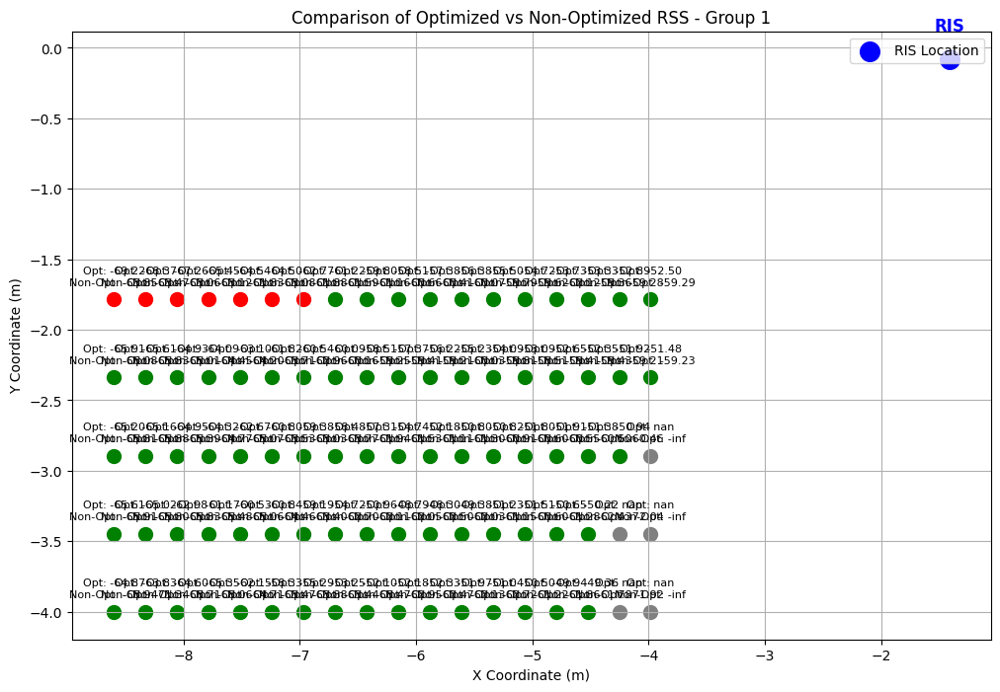

Data for Group 1 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [3]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Load RSS results from XML file
input_file = './ris(decreasedsize)_optimization_results/rss_results.xml'
tree = ET.parse(input_file)
root = tree.getroot()

# Threshold for comparison
highlighted_point = np.array([-5.945, -3.38, 1.23])  # Group 1
ris_location = np.array([-1.414, -0.079])  # RIS location

# Initialize lists for receiver locations and RSS values
x_coords = []
y_coords = []
z_coords = []
rss_optimized = []
rss_non_optimized = []

# Parse the XML file
for receiver in root.findall("Receiver"):
    x = float(receiver.find("X").text)
    y = float(receiver.find("Y").text)
    z = float(receiver.find("Z").text)
    rss = float(receiver.find("RSS_dB").text)

    x_coords.append(x)
    y_coords.append(y)
    z_coords.append(z)
    rss_optimized.append(rss)

# Calculate non-optimized RSS for each receiver
for x, y, z in zip(x_coords, y_coords, z_coords):
    receiver_position = [x, y, z]

    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)
    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position, orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
    rss_non_optimized.append(10 * np.log10(np.abs(total_channel_coefficient) ** 2))

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    comparison_data = tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 1
group_data = ET.SubElement(comparison_data, "Group", name="Group 1")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (x, y, z, opt_rss, non_opt_rss) in enumerate(zip(x_coords, y_coords, z_coords, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({x}, {y}, {z}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(x)
    ET.SubElement(receiver_element, "Y").text = str(y)
    ET.SubElement(receiver_element, "Z").text = str(z)
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(x)
    ET.SubElement(point_element, "Y").text = str(y)
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 1:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for x, y, opt_rss, non_opt_rss in zip(x_coords, y_coords, rss_optimized, rss_non_optimized):
    if np.isnan(opt_rss) or np.isnan(non_opt_rss):
        color = 'grey'
    else:
        color = 'green' if opt_rss > non_opt_rss else 'red'
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS - Group 1")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 1 saved to {output_file}")


## Save Channel Coef for Group 1

In [4]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 1"  # For Group 1

# Extract phase and amplitude profiles for Group 1
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 1 receiver points (nearest to Point 1)
group_1_index = 0  # Adjusted index for Group 1
group_1_receivers = receiver_positions[group_indices == group_1_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_1_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 1 results to XML
group_element = ET.SubElement(root, "Group", name="Group 1")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_1_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 1 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_1_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 1 Receivers:
Receiver 1 at (-8.60, -4.00, 1.23):
  - Optimized RSS = -71.20 dB
  - Final Channel Coefficient: -0.000119+0.000010j

Receiver 2 at (-8.60, -3.45, 1.23):
  - Optimized RSS = -69.75 dB
  - Final Channel Coefficient: 0.000018+0.000002j

Receiver 3 at (-8.60, -2.89, 1.23):
  - Optimized RSS = -69.66 dB
  - Final Channel Coefficient: 0.000014+0.000002j

Receiver 4 at (-8.60, -2.34, 1.23):
  - Optimized RSS = -70.16 dB
  - Final Channel Coefficient: -0.000011+0.000012j

Receiver 5 at (-8.60, -1.79, 1.23):
  - Optimized RSS = -73.61 dB
  - Final Channel Coefficient: 0.000128-0.000013j

Receiver 6 at (-8.33, -4.00, 1.23):
  - Optimized RSS = -70.20 dB
  - Final Channel Coefficient: -0.000218+0.000026j

Receiver 7 at (-8.33, -3.45, 1.23):
  - Optimized RSS = -69.44 dB
  - Final Channel Coefficient: 0.000013+0.000002j

Receiver 8 at (-8.33, -2.89, 1.23):
  - Optimized RSS = -69.55 dB
  - Final Channel Coefficient: -0.000002+0.

# Group 2 Plot



Comparison Report for Group 2:

Receiver 1 at (-8.60, -1.23, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 2 at (-8.60, -0.68, 1.23): Optimized RSS = -88.75 dB, Non-Optimized RSS = -88.85 dB -> Optimized is better.
Receiver 3 at (-8.60, -0.12, 1.23): Optimized RSS = -87.13 dB, Non-Optimized RSS = -120.31 dB -> Optimized is better.
Receiver 4 at (-8.60, 0.43, 1.23): Optimized RSS = -85.92 dB, Non-Optimized RSS = -129.83 dB -> Optimized is better.
Receiver 5 at (-8.60, 0.98, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 6 at (-8.60, 1.54, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 7 at (-8.60, 2.09, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 8 at (-8.60, 2.64, 1.23): Optimized RSS = -76.82 dB, Non-Optimized RSS = -77.34 dB -> Optimized is better.
Receiver 9 at (-8.33, -1.23, 1.23): Optimized RSS = nan dB, Non-Optimi

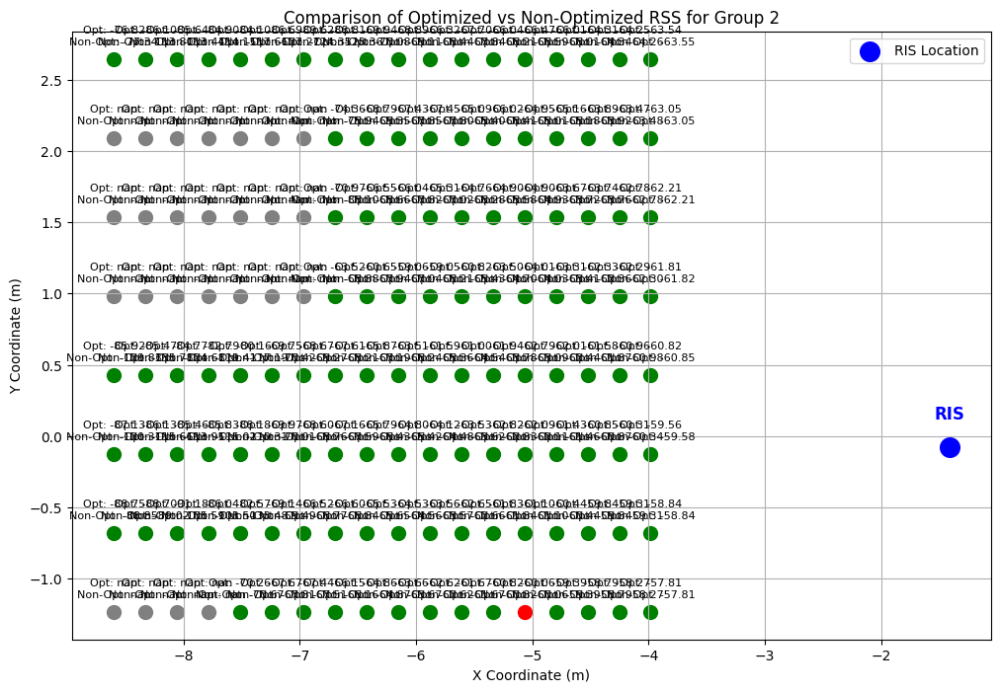

Data for Group 2 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [4]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 2"

# Extract phase and amplitude profiles for Group 2
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 2 receiver points (nearest to Point 2)
group_2_index = 1
group_2_receivers = receiver_positions[group_indices == group_2_index]

# Initialize lists for RSS values
rss_optimized = []
rss_non_optimized = []

# Calculate RSS for each receiver in Group 2
for receiver_position in group_2_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found

    # Remove RIS optimization for non-optimized RSS
    ris.phase_profile.values = tf.zeros_like(ris.phase_profile.values)
    ris.amplitude_profile.values = tf.ones_like(ris.amplitude_profile.values)

    # Compute paths (Non-Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_non_optimized.append(rss_db.numpy())
    else:
        rss_non_optimized.append(np.nan)  # Assign NaN if no paths found

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    comparison_tree = ET.parse(output_file)
    comparison_data = comparison_tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 2
group_data = ET.SubElement(comparison_data, "Group", name="Group 2")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (pos, opt_rss, non_opt_rss) in enumerate(zip(group_2_receivers, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(pos[0])
    ET.SubElement(receiver_element, "Y").text = str(pos[1])
    ET.SubElement(receiver_element, "Z").text = str(pos[2])
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(pos[0])
    ET.SubElement(point_element, "Y").text = str(pos[1])
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 2:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for pos, opt_rss, non_opt_rss in zip(group_2_receivers, rss_optimized, rss_non_optimized):
    x, y, z = pos
    color = 'grey' if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ('green' if opt_rss > non_opt_rss else 'red')
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS for Group 2")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 2 saved to {output_file}")


## Save optimized channel coeff

In [3]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 2"  # For Group 2

# Extract phase and amplitude profiles for Group 2
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 2 receiver points (nearest to Point 2)
group_2_index = 1  # Adjusted index for Group 2
group_2_receivers = receiver_positions[group_indices == group_2_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_2_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 2 results to XML
group_element = ET.SubElement(root, "Group", name="Group 2")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_2_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 2 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_2_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 2 Receivers:
Receiver 1 at (-8.60, -1.23, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 2 at (-8.60, -0.68, 1.23):
  - Optimized RSS = -88.75 dB
  - Final Channel Coefficient: 0.000031-0.000007j

Receiver 3 at (-8.60, -0.12, 1.23):
  - Optimized RSS = -87.13 dB
  - Final Channel Coefficient: -0.000004-0.000000j

Receiver 4 at (-8.60, 0.43, 1.23):
  - Optimized RSS = -85.92 dB
  - Final Channel Coefficient: -0.000004-0.000000j

Receiver 5 at (-8.60, 0.98, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 6 at (-8.60, 1.54, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000093+0.000000j

Receiver 7 at (-8.60, 2.09, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000060+0.000002j

Receiver 8 at (-8.60, 2.64, 1.23):
  - Optimized RSS = -76.82 dB
  - Final Channel Coefficient: 0.000055+0.000002j

Receiver 9

# Group 3 Plot


Comparison Report for Group 3:

Receiver 1 at (-8.60, 3.20, 1.23): Optimized RSS = -77.24 dB, Non-Optimized RSS = -77.25 dB -> Optimized is better.
Receiver 2 at (-8.60, 3.75, 1.23): Optimized RSS = -77.19 dB, Non-Optimized RSS = -77.27 dB -> Optimized is better.
Receiver 3 at (-8.60, 4.31, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 4 at (-8.60, 4.86, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 5 at (-8.60, 5.41, 1.23): Optimized RSS = -85.60 dB, Non-Optimized RSS = -89.93 dB -> Optimized is better.
Receiver 6 at (-8.60, 5.97, 1.23): Optimized RSS = -85.46 dB, Non-Optimized RSS = -89.91 dB -> Optimized is better.
Receiver 7 at (-8.60, 6.52, 1.23): Optimized RSS = -81.71 dB, Non-Optimized RSS = -89.91 dB -> Optimized is better.
Receiver 8 at (-8.33, 3.20, 1.23): Optimized RSS = -96.36 dB, Non-Optimized RSS = -119.57 dB -> Optimized is better.
Receiver 9 at (-8.33, 3.75, 1.23): Optimized RSS = -76.4

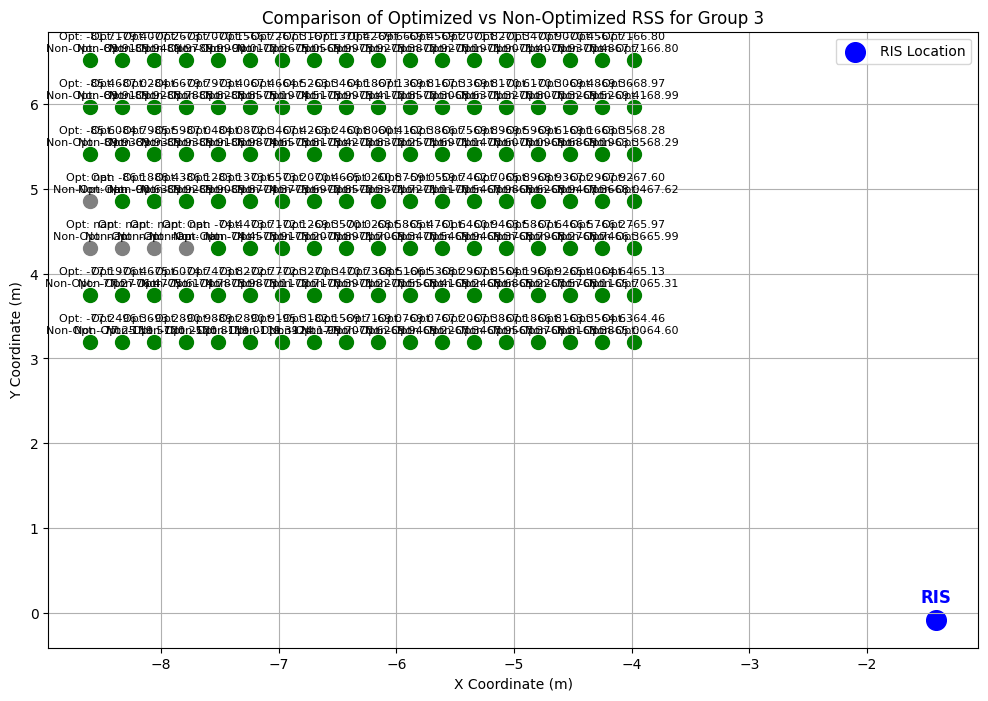

Data for Group 3 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [6]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 3"

# Extract phase and amplitude profiles for Group 3
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 3 receiver points (nearest to Point 3)
group_3_index = 2
group_3_receivers = receiver_positions[group_indices == group_3_index]

# Initialize lists for RSS values
rss_optimized = []
rss_non_optimized = []

# Calculate RSS for each receiver in Group 3
for receiver_position in group_3_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found

    # Remove RIS optimization for non-optimized RSS
    ris.phase_profile.values = tf.zeros_like(ris.phase_profile.values)
    ris.amplitude_profile.values = tf.ones_like(ris.amplitude_profile.values)

    # Compute paths (Non-Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_non_optimized.append(rss_db.numpy())
    else:
        rss_non_optimized.append(np.nan)  # Assign NaN if no paths found

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    comparison_tree = ET.parse(output_file)
    comparison_data = comparison_tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 3
group_data = ET.SubElement(comparison_data, "Group", name="Group 3")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (pos, opt_rss, non_opt_rss) in enumerate(zip(group_3_receivers, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(pos[0])
    ET.SubElement(receiver_element, "Y").text = str(pos[1])
    ET.SubElement(receiver_element, "Z").text = str(pos[2])
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(pos[0])
    ET.SubElement(point_element, "Y").text = str(pos[1])
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 3:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for pos, opt_rss, non_opt_rss in zip(group_3_receivers, rss_optimized, rss_non_optimized):
    x, y, z = pos
    color = 'grey' if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ('green' if opt_rss > non_opt_rss else 'red')
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS for Group 3")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 3 saved to {output_file}")


## Save optimized channe coeff

In [2]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 3"  # For Group 3

# Extract phase and amplitude profiles for Group 3
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 3 receiver points (nearest to Point 3)
group_3_index = 2  # Adjusted index for Group 3
group_3_receivers = receiver_positions[group_indices == group_3_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_3_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 3 results to XML
group_element = ET.SubElement(root, "Group", name="Group 3")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_3_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 3 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_3_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 3 Receivers:
Receiver 1 at (-8.60, 3.20, 1.23):
  - Optimized RSS = -77.24 dB
  - Final Channel Coefficient: 0.000032+0.000012j

Receiver 2 at (-8.60, 3.75, 1.23):
  - Optimized RSS = -77.19 dB
  - Final Channel Coefficient: 0.000027+0.000000j

Receiver 3 at (-8.60, 4.31, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: -0.000007-0.000005j

Receiver 4 at (-8.60, 4.86, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000028+0.000001j

Receiver 5 at (-8.60, 5.41, 1.23):
  - Optimized RSS = -85.60 dB
  - Final Channel Coefficient: 0.000014+0.000001j

Receiver 6 at (-8.60, 5.97, 1.23):
  - Optimized RSS = -85.46 dB
  - Final Channel Coefficient: 0.000014+0.000001j

Receiver 7 at (-8.60, 6.52, 1.23):
  - Optimized RSS = -81.71 dB
  - Final Channel Coefficient: 0.000014+0.000001j

Receiver 8 at (-8.33, 3.20, 1.23):
  - Optimized RSS = -96.36 dB
  - Final Channel Coefficient: -0.000003+0.000000j

Receive

# Group 4 Plot


Comparison Report for Group 4:

Receiver 1 at (-3.71, -4.00, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 2 at (-3.71, -3.45, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 3 at (-3.71, -2.89, 1.23): Optimized RSS = -55.86 dB, Non-Optimized RSS = -55.86 dB -> Optimized is better.
Receiver 4 at (-3.71, -2.34, 1.23): Optimized RSS = -55.42 dB, Non-Optimized RSS = -55.42 dB -> Optimized is better.
Receiver 5 at (-3.71, -1.79, 1.23): Optimized RSS = -56.40 dB, Non-Optimized RSS = -56.40 dB -> Optimized is better.
Receiver 6 at (-3.44, -4.00, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 7 at (-3.44, -3.45, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 8 at (-3.44, -2.89, 1.23): Optimized RSS = -88.43 dB, Non-Optimized RSS = -92.32 dB -> Optimized is better.
Receiver 9 at (-3.44, -2.34, 1.23): Optimized RSS = -55.11 dB, Non-

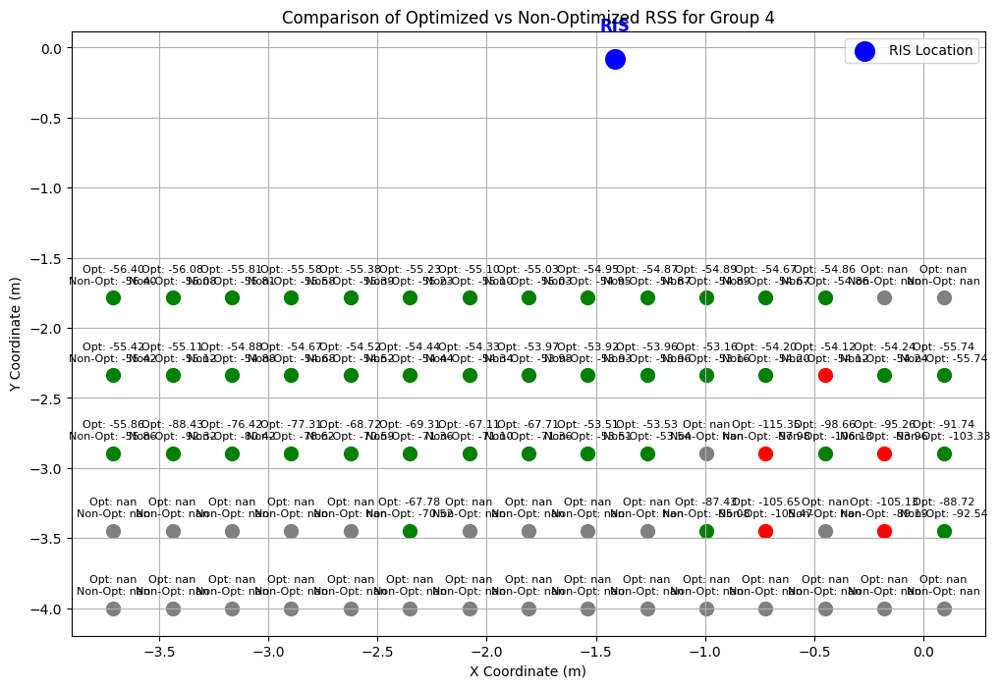

Data for Group 4 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [7]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 4"

# Extract phase and amplitude profiles for Group 4
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 4 receiver points (nearest to Point 4)
group_4_index = 3
group_4_receivers = receiver_positions[group_indices == group_4_index]

# Initialize lists for RSS values
rss_optimized = []
rss_non_optimized = []

# Calculate RSS for each receiver in Group 4
for receiver_position in group_4_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found

    # Remove RIS optimization for non-optimized RSS
    ris.phase_profile.values = tf.zeros_like(ris.phase_profile.values)
    ris.amplitude_profile.values = tf.ones_like(ris.amplitude_profile.values)

    # Compute paths (Non-Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_non_optimized.append(rss_db.numpy())
    else:
        rss_non_optimized.append(np.nan)  # Assign NaN if no paths found

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    comparison_tree = ET.parse(output_file)
    comparison_data = comparison_tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 4
group_data = ET.SubElement(comparison_data, "Group", name="Group 4")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (pos, opt_rss, non_opt_rss) in enumerate(zip(group_4_receivers, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(pos[0])
    ET.SubElement(receiver_element, "Y").text = str(pos[1])
    ET.SubElement(receiver_element, "Z").text = str(pos[2])
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(pos[0])
    ET.SubElement(point_element, "Y").text = str(pos[1])
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 4:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for pos, opt_rss, non_opt_rss in zip(group_4_receivers, rss_optimized, rss_non_optimized):
    x, y, z = pos
    color = 'grey' if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ('green' if opt_rss > non_opt_rss else 'red')
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS for Group 4")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 4 saved to {output_file}")


## Save optimized channel coeff

In [2]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 4"

# Extract phase and amplitude profiles for Group 4
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 4 receiver points (nearest to Point 4)
group_4_index = 3
group_4_receivers = receiver_positions[group_indices == group_4_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_4_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 4 results to XML
group_element = ET.SubElement(root, "Group", name="Group 4")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_4_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 4 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_4_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 4 Receivers:
Receiver 1 at (-3.71, -4.00, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 2 at (-3.71, -3.45, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 3 at (-3.71, -2.89, 1.23):
  - Optimized RSS = -55.86 dB
  - Final Channel Coefficient: 0.001120+0.000001j

Receiver 4 at (-3.71, -2.34, 1.23):
  - Optimized RSS = -55.42 dB
  - Final Channel Coefficient: 0.000437+0.000015j

Receiver 5 at (-3.71, -1.79, 1.23):
  - Optimized RSS = -56.40 dB
  - Final Channel Coefficient: 0.000445+0.000012j

Receiver 6 at (-3.44, -4.00, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 7 at (-3.44, -3.45, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 8 at (-3.44, -2.89, 1.23):
  - Optimized RSS = -88.43 dB
  - Final Channel Coefficient: -0.000028+0.000001j

Receiv

# Group 5


Comparison Report for Group 5:

Receiver 1 at (-3.71, -1.23, 1.23): Optimized RSS = -57.41 dB, Non-Optimized RSS = -57.41 dB -> Optimized is better.
Receiver 2 at (-3.71, -0.68, 1.23): Optimized RSS = -58.01 dB, Non-Optimized RSS = -58.01 dB -> Optimized is better.
Receiver 3 at (-3.71, -0.12, 1.23): Optimized RSS = -59.43 dB, Non-Optimized RSS = -59.43 dB -> Optimized is better.
Receiver 4 at (-3.71, 0.43, 1.23): Optimized RSS = -60.41 dB, Non-Optimized RSS = -60.42 dB -> Optimized is better.
Receiver 5 at (-3.71, 0.98, 1.23): Optimized RSS = -61.35 dB, Non-Optimized RSS = -61.38 dB -> Optimized is better.
Receiver 6 at (-3.71, 1.54, 1.23): Optimized RSS = -62.26 dB, Non-Optimized RSS = -62.29 dB -> Optimized is better.
Receiver 7 at (-3.71, 2.09, 1.23): Optimized RSS = -63.19 dB, Non-Optimized RSS = -63.19 dB -> Optimized is better.
Receiver 8 at (-3.71, 2.64, 1.23): Optimized RSS = -64.06 dB, Non-Optimized RSS = -64.06 dB -> Optimized is better.
Receiver 9 at (-3.44, -1.23, 1.23): 

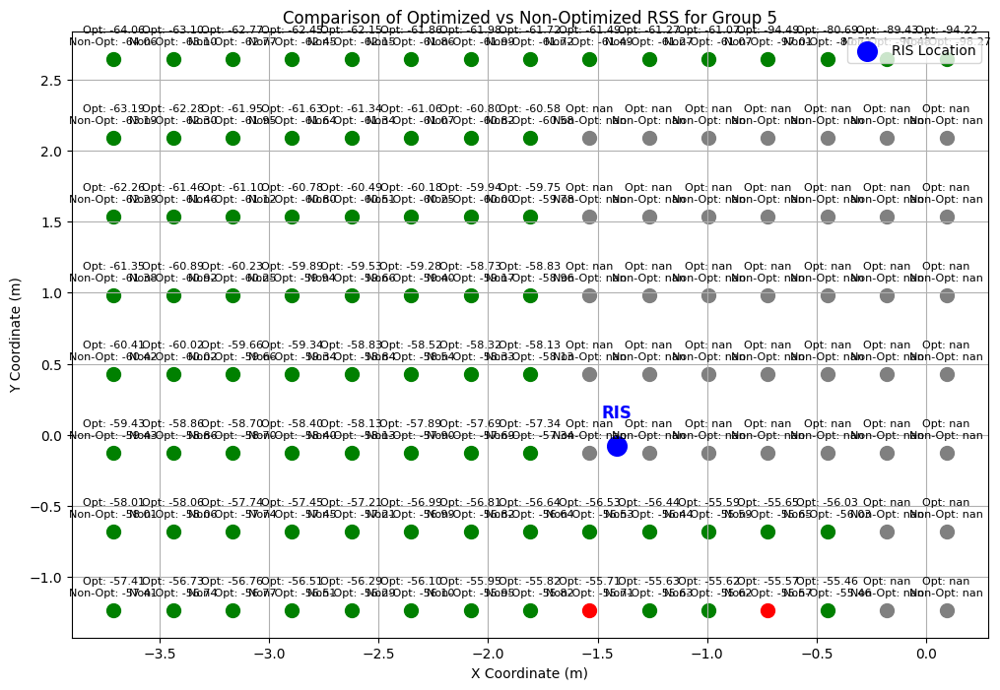

Data for Group 5 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [2]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 5"

# Extract phase and amplitude profiles for Group 5
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 5 receiver points (nearest to Point 5)
group_5_index = 4
group_5_receivers = receiver_positions[group_indices == group_5_index]

# Initialize lists for RSS values
rss_optimized = []
rss_non_optimized = []

# Calculate RSS for each receiver in Group 5
for receiver_position in group_5_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found

    # Remove RIS optimization for non-optimized RSS
    ris.phase_profile.values = tf.zeros_like(ris.phase_profile.values)
    ris.amplitude_profile.values = tf.ones_like(ris.amplitude_profile.values)

    # Compute paths (Non-Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_non_optimized.append(rss_db.numpy())
    else:
        rss_non_optimized.append(np.nan)  # Assign NaN if no paths found

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    comparison_tree = ET.parse(output_file)
    comparison_data = comparison_tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 5
group_data = ET.SubElement(comparison_data, "Group", name="Group 5")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (pos, opt_rss, non_opt_rss) in enumerate(zip(group_5_receivers, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(pos[0])
    ET.SubElement(receiver_element, "Y").text = str(pos[1])
    ET.SubElement(receiver_element, "Z").text = str(pos[2])
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(pos[0])
    ET.SubElement(point_element, "Y").text = str(pos[1])
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 5:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for pos, opt_rss, non_opt_rss in zip(group_5_receivers, rss_optimized, rss_non_optimized):
    x, y, z = pos
    color = 'grey' if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ('green' if opt_rss > non_opt_rss else 'red')
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS for Group 5")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 5 saved to {output_file}")


## Save optimized channel coeff

In [7]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 5"  # For Group 5

# Extract phase and amplitude profiles for Group 5
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 5 receiver points (nearest to Point 5)
group_5_index = 4  # Adjusted index for Group 5
group_5_receivers = receiver_positions[group_indices == group_5_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_5_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 5 results to XML
group_element = ET.SubElement(root, "Group", name="Group 5")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_5_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 5 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_5_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 5 Receivers:
Receiver 1 at (-3.71, -1.23, 1.23):
  - Optimized RSS = -57.41 dB
  - Final Channel Coefficient: 0.000587+0.000010j

Receiver 2 at (-3.71, -0.68, 1.23):
  - Optimized RSS = -58.01 dB
  - Final Channel Coefficient: 0.000238+0.000022j

Receiver 3 at (-3.71, -0.12, 1.23):
  - Optimized RSS = -59.43 dB
  - Final Channel Coefficient: 0.000536+0.000007j

Receiver 4 at (-3.71, 0.43, 1.23):
  - Optimized RSS = -60.41 dB
  - Final Channel Coefficient: 0.000506+0.000007j

Receiver 5 at (-3.71, 0.98, 1.23):
  - Optimized RSS = -61.35 dB
  - Final Channel Coefficient: 0.000477+0.000006j

Receiver 6 at (-3.71, 1.54, 1.23):
  - Optimized RSS = -62.26 dB
  - Final Channel Coefficient: 0.000462+0.000007j

Receiver 7 at (-3.71, 2.09, 1.23):
  - Optimized RSS = -63.19 dB
  - Final Channel Coefficient: 0.000436+0.000007j

Receiver 8 at (-3.71, 2.64, 1.23):
  - Optimized RSS = -64.06 dB
  - Final Channel Coefficient: 0.000413+0.000005j



# Group 6 


Comparison Report for Group 6:

Receiver 1 at (-3.71, 3.20, 1.23): Optimized RSS = -64.89 dB, Non-Optimized RSS = -64.89 dB -> Optimized is better.
Receiver 2 at (-3.71, 3.75, 1.23): Optimized RSS = -65.67 dB, Non-Optimized RSS = -65.67 dB -> Optimized is better.
Receiver 3 at (-3.71, 4.31, 1.23): Optimized RSS = -66.43 dB, Non-Optimized RSS = -66.43 dB -> Optimized is better.
Receiver 4 at (-3.71, 4.86, 1.23): Optimized RSS = -67.18 dB, Non-Optimized RSS = -67.18 dB -> Optimized is better.
Receiver 5 at (-3.71, 5.41, 1.23): Optimized RSS = -67.63 dB, Non-Optimized RSS = -67.66 dB -> Optimized is better.
Receiver 6 at (-3.71, 5.97, 1.23): Optimized RSS = -68.54 dB, Non-Optimized RSS = -68.58 dB -> Optimized is better.
Receiver 7 at (-3.71, 6.52, 1.23): Optimized RSS = -65.54 dB, Non-Optimized RSS = -65.67 dB -> Optimized is better.
Receiver 8 at (-3.44, 3.20, 1.23): Optimized RSS = -63.86 dB, Non-Optimized RSS = -63.87 dB -> Optimized is better.
Receiver 9 at (-3.44, 3.75, 1.23): Opti

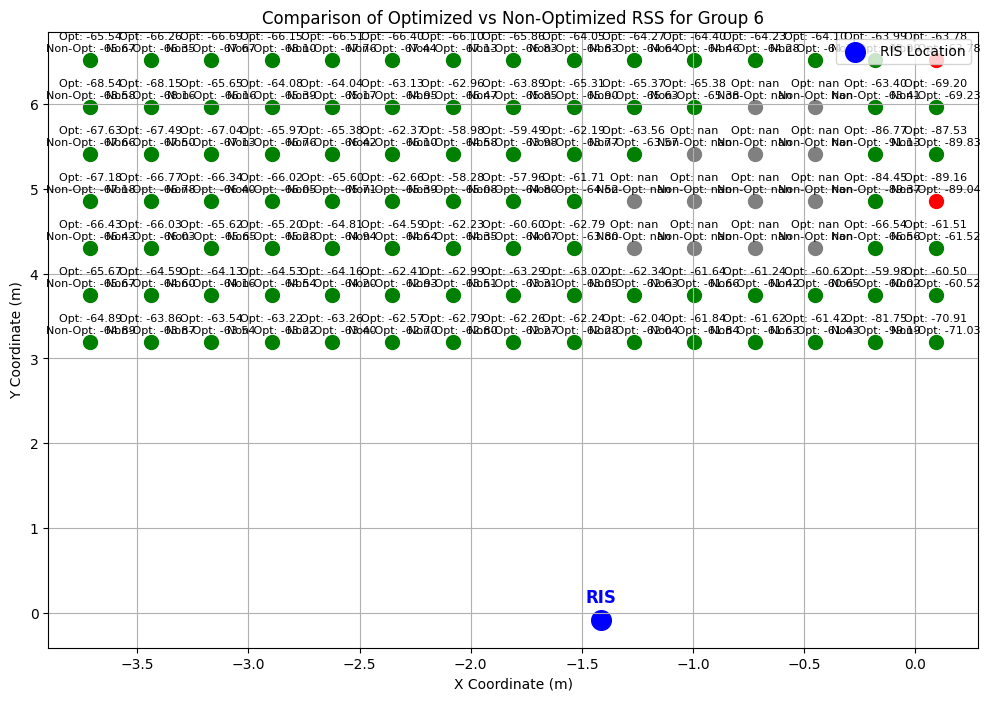

Data for Group 6 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [6]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 6"

# Extract phase and amplitude profiles for Group 6
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 6 receiver points (nearest to Point 6)
group_6_index = 5
group_6_receivers = receiver_positions[group_indices == group_6_index]

# Initialize lists for RSS values
rss_optimized = []
rss_non_optimized = []

# Calculate RSS for each receiver in Group 6
for receiver_position in group_6_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found

    # Remove RIS optimization for non-optimized RSS
    ris.phase_profile.values = tf.zeros_like(ris.phase_profile.values)
    ris.amplitude_profile.values = tf.ones_like(ris.amplitude_profile.values)

    # Compute paths (Non-Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_non_optimized.append(rss_db.numpy())
    else:
        rss_non_optimized.append(np.nan)  # Assign NaN if no paths found

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    comparison_tree = ET.parse(output_file)
    comparison_data = comparison_tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 6
group_data = ET.SubElement(comparison_data, "Group", name="Group 6")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (pos, opt_rss, non_opt_rss) in enumerate(zip(group_6_receivers, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(pos[0])
    ET.SubElement(receiver_element, "Y").text = str(pos[1])
    ET.SubElement(receiver_element, "Z").text = str(pos[2])
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(pos[0])
    ET.SubElement(point_element, "Y").text = str(pos[1])
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 6:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for pos, opt_rss, non_opt_rss in zip(group_6_receivers, rss_optimized, rss_non_optimized):
    x, y, z = pos
    color = 'grey' if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ('green' if opt_rss > non_opt_rss else 'red')
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS for Group 6")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 6 saved to {output_file}")



## Save optimized channel coeff

In [8]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 6"  # For Group 6

# Extract phase and amplitude profiles for Group 6
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 6 receiver points (nearest to Point 6)
group_6_index = 5  # Adjusted index for Group 6
group_6_receivers = receiver_positions[group_indices == group_6_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_6_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 6 results to XML
group_element = ET.SubElement(root, "Group", name="Group 6")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_6_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 6 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_6_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 6 Receivers:
Receiver 1 at (-3.71, 3.20, 1.23):
  - Optimized RSS = -64.89 dB
  - Final Channel Coefficient: 0.000255+0.000005j

Receiver 2 at (-3.71, 3.75, 1.23):
  - Optimized RSS = -65.67 dB
  - Final Channel Coefficient: 0.000258+0.000007j

Receiver 3 at (-3.71, 4.31, 1.23):
  - Optimized RSS = -66.43 dB
  - Final Channel Coefficient: 0.000210+0.000001j

Receiver 4 at (-3.71, 4.86, 1.23):
  - Optimized RSS = -67.18 dB
  - Final Channel Coefficient: 0.000215+0.000002j

Receiver 5 at (-3.71, 5.41, 1.23):
  - Optimized RSS = -67.63 dB
  - Final Channel Coefficient: 0.000224-0.000023j

Receiver 6 at (-3.71, 5.97, 1.23):
  - Optimized RSS = -68.54 dB
  - Final Channel Coefficient: 0.000152+0.000003j

Receiver 7 at (-3.71, 6.52, 1.23):
  - Optimized RSS = -65.54 dB
  - Final Channel Coefficient: 0.000228-0.000007j

Receiver 8 at (-3.44, 3.20, 1.23):
  - Optimized RSS = -63.86 dB
  - Final Channel Coefficient: 0.000169+0.000006j

Rec

# Group 7


Comparison Report for Group 7:

Receiver 1 at (0.36, -4.00, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 2 at (0.36, -3.45, 1.23): Optimized RSS = -96.88 dB, Non-Optimized RSS = -98.38 dB -> Optimized is better.
Receiver 3 at (0.36, -2.89, 1.23): Optimized RSS = -63.46 dB, Non-Optimized RSS = -63.47 dB -> Optimized is better.
Receiver 4 at (0.36, -2.34, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 5 at (0.36, -1.79, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 6 at (0.64, -4.00, 1.23): Optimized RSS = nan dB, Non-Optimized RSS = nan dB -> Optimized is nan.
Receiver 7 at (0.64, -3.45, 1.23): Optimized RSS = -68.94 dB, Non-Optimized RSS = -68.94 dB -> Optimized is worse.
Receiver 8 at (0.64, -2.89, 1.23): Optimized RSS = -63.01 dB, Non-Optimized RSS = -63.01 dB -> Optimized is better.
Receiver 9 at (0.64, -2.34, 1.23): Optimized RSS = nan dB, Non-Optimized RSS

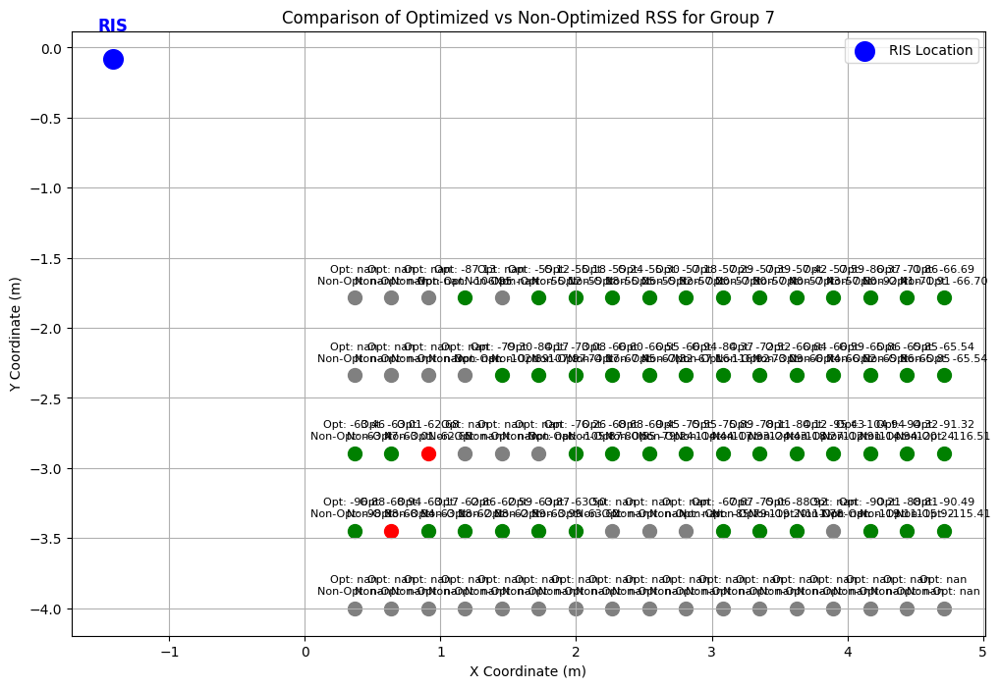

Data for Group 7 saved to ./ris(decreasedsize)_optimization_results/rss_comparison.xml


In [28]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 7"

# Extract phase and amplitude profiles for Group 7
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 7 receiver points (nearest to Point 7)
group_7_index = 6
group_7_receivers = receiver_positions[group_indices == group_7_index]

# Initialize lists for RSS values
rss_optimized = []
rss_non_optimized = []

# Calculate RSS for each receiver in Group 7
for receiver_position in group_7_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found

    # Remove RIS optimization for non-optimized RSS
    ris.phase_profile.values = tf.zeros_like(ris.phase_profile.values)
    ris.amplitude_profile.values = tf.ones_like(ris.amplitude_profile.values)

    # Compute paths (Non-Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_non_optimized.append(rss_db.numpy())
    else:
        rss_non_optimized.append(np.nan)  # Assign NaN if no paths found

# Load existing XML file or create a new one
output_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
if os.path.exists(output_file):
    comparison_tree = ET.parse(output_file)
    comparison_data = comparison_tree.getroot()
else:
    comparison_data = ET.Element("RSSComparison")

# Create a new section for Group 7
group_data = ET.SubElement(comparison_data, "Group", name="Group 7")

# Report comparison for each receiver
comparison_report = []
plot_data = ET.SubElement(group_data, "PlotData")

for idx, (pos, opt_rss, non_opt_rss) in enumerate(zip(group_7_receivers, rss_optimized, rss_non_optimized)):
    result = "better" if opt_rss > non_opt_rss else "worse" if not np.isnan(opt_rss) and not np.isnan(non_opt_rss) else "nan"
    comparison_report.append(
        f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}): Optimized RSS = {opt_rss:.2f} dB, Non-Optimized RSS = {non_opt_rss:.2f} dB -> Optimized is {result}."
    )

    # Save data to XML
    receiver_element = ET.SubElement(group_data, "Receiver")
    ET.SubElement(receiver_element, "X").text = str(pos[0])
    ET.SubElement(receiver_element, "Y").text = str(pos[1])
    ET.SubElement(receiver_element, "Z").text = str(pos[2])
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "nan"
    ET.SubElement(receiver_element, "NonOptimizedRSS_dB").text = f"{non_opt_rss:.2f}" if not np.isnan(non_opt_rss) else "nan"
    ET.SubElement(receiver_element, "Result").text = result

    # Add point to PlotData
    point_element = ET.SubElement(plot_data, "Point")
    ET.SubElement(point_element, "X").text = str(pos[0])
    ET.SubElement(point_element, "Y").text = str(pos[1])
    ET.SubElement(point_element, "Color").text = "grey" if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ("green" if opt_rss > non_opt_rss else "red")

# Save the updated XML file
comparison_tree = ET.ElementTree(comparison_data)
comparison_tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the report
print("\nComparison Report for Group 7:\n")
for line in comparison_report:
    print(line)

# Plot the results
plt.figure(figsize=(12, 8))
for pos, opt_rss, non_opt_rss in zip(group_7_receivers, rss_optimized, rss_non_optimized):
    x, y, z = pos
    color = 'grey' if np.isnan(opt_rss) or np.isnan(non_opt_rss) else ('green' if opt_rss > non_opt_rss else 'red')
    plt.scatter(x, y, c=color, s=100)
    plt.text(x, y + 0.1, f"Opt: {opt_rss:.2f}\nNon-Opt: {non_opt_rss:.2f}", fontsize=8, ha='center')

# Highlight RIS location
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Customize plot
plt.xlabel("X Coordinate (m)")
plt.ylabel("Y Coordinate (m)")
plt.title("Comparison of Optimized vs Non-Optimized RSS for Group 7")
plt.grid(True)
plt.legend(loc="upper right")
plt.show()

print(f"Data for Group 7 saved to {output_file}")


## Save optimized chanel coeff

In [2]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
from scipy.spatial import distance

# Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Load RIS optimization results from XML
optimization_file = './ris(decreasedsize)_optimization_results/optimized_ris_phases.xml'
opt_tree = ET.parse(optimization_file)
opt_root = opt_tree.getroot()
point_label = "Point 7"  # For Group 7

# Extract phase and amplitude profiles for Group 7
for point in opt_root.findall("Point"):
    if point.get("name") == point_label:
        phase_profile = [float(value.text) for value in point.find("PhaseProfile")]
        amplitude_profile = [float(value.text) for value in point.find("AmplitudeProfile")]
        break
else:
    raise ValueError(f"Point '{point_label}' not found in the XML file.")

# Highlighted point and RIS location
ris_location = np.array([-1.414, -0.079])  # RIS location

# Load receiver positions from XML
xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
tree = ET.parse(xml_file)
root = tree.getroot()
receiver_positions = []
for receiver in root.findall('Receiver'):
    x = float(receiver.find('X').text)
    y = float(receiver.find('Y').text)
    z = float(receiver.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Highlighted points (for Grouping)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Point 1
    (-5.945, 0.79),   # Point 2
    (-5.945, 4.985),  # Point 3
    (-1.945, -3.38),  # Point 4
    (-1.945, 0.79),   # Point 5
    (-1.945, 4.985),  # Point 6
    (2.5, -3.38),     # Point 7
    (2.5, 0.79),      # Point 8
    (2.5, 4.985),     # Point 9
])

# Convert receiver positions to 2D
receiver_positions_2d = receiver_positions[:, :2]

# Compute distances from each receiver to each highlight point
distances = distance.cdist(receiver_positions_2d, highlight_positions_2d)

# Assign each receiver to the nearest highlight point
group_indices = np.argmin(distances, axis=1)

# Extract Group 7 receiver points (nearest to Point 7)
group_7_index = 6  # Adjusted index for Group 7
group_7_receivers = receiver_positions[group_indices == group_7_index]

# Initialize lists for RSS and final channel coefficients
rss_optimized = []
final_channel_coefficients = []

# Calculate RSS and final channel coefficients for optimized RIS case
for receiver_position in group_7_receivers:
    # Configure scene
    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Configure antenna array for Tx and Rx
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="tr38901", polarization="V")
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5, horizontal_spacing=0.5, pattern="dipole", polarization="cross")

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Configure RIS
    num_elements = 512
    num_rows = int(np.sqrt(num_elements))
    num_cols = num_elements // num_rows
    if num_rows * num_cols != num_elements:
        num_cols += 1

    ris = RIS(name="ris", position=[-1.414, -0.079, 5.869], look_at=[-1.539, -0.018, 0.0005], num_rows=num_rows, num_cols=num_cols)

    # Apply optimized phase and amplitude profiles
    phase_profile_np = np.array(phase_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    amplitude_profile_np = np.array(amplitude_profile, dtype=np.float32).reshape(1, num_rows, num_cols)
    ris.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)

    scene.add(ris)

    # Add receiver
    rx = Receiver(name="rx", position=receiver_position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute paths (Optimized)
    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] > 0:  # Ensure paths are valid
        rss_linear = tf.reduce_sum(tf.abs(paths.cir()[0]) ** 2)
        rss_db = 10 * tf.math.log(rss_linear) / tf.math.log(10.0)
        rss_optimized.append(rss_db.numpy())

        # Calculate final channel coefficient by summing all paths
        total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()
        final_channel_coefficients.append(total_channel_coefficient)
    else:
        rss_optimized.append(np.nan)  # Assign NaN if no paths found
        final_channel_coefficients.append(np.nan)

# Load or create XML file for results
output_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
if os.path.exists(output_file):
    tree = ET.parse(output_file)
    root = tree.getroot()
else:
    root = ET.Element("OptimizedChannelCoefficients")

# Add Group 7 results to XML
group_element = ET.SubElement(root, "Group", name="Group 7")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_7_receivers, rss_optimized, final_channel_coefficients)):
    receiver_element = ET.SubElement(group_element, "Receiver", id=str(idx + 1))
    ET.SubElement(receiver_element, "X").text = f"{pos[0]:.2f}"
    ET.SubElement(receiver_element, "Y").text = f"{pos[1]:.2f}"
    ET.SubElement(receiver_element, "Z").text = f"{pos[2]:.2f}"
    ET.SubElement(receiver_element, "OptimizedRSS_dB").text = f"{opt_rss:.2f}" if not np.isnan(opt_rss) else "NaN"
    ET.SubElement(receiver_element, "FinalChannelCoefficient").text = f"{final_coefficient:.6f}" if not np.isnan(final_coefficient) else "NaN"

# Save the updated XML file
tree = ET.ElementTree(root)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

# Print the results
print("\nOptimized RSS and Final Channel Coefficients for Group 7 Receivers:")
for idx, (pos, opt_rss, final_coefficient) in enumerate(zip(group_7_receivers, rss_optimized, final_channel_coefficients)):
    print(f"Receiver {idx+1} at ({pos[0]:.2f}, {pos[1]:.2f}, {pos[2]:.2f}):")
    print(f"  - Optimized RSS = {opt_rss:.2f} dB")
    print(f"  - Final Channel Coefficient: {final_coefficient:.6f}\n")

print(f"\nResults saved to {output_file}")



Optimized RSS and Final Channel Coefficients for Group 7 Receivers:
Receiver 1 at (0.36, -4.00, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000026-0.000011j

Receiver 2 at (0.36, -3.45, 1.23):
  - Optimized RSS = -96.88 dB
  - Final Channel Coefficient: -0.000060-0.000001j

Receiver 3 at (0.36, -2.89, 1.23):
  - Optimized RSS = -63.46 dB
  - Final Channel Coefficient: -0.000159+0.000060j

Receiver 4 at (0.36, -2.34, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000974+0.000051j

Receiver 5 at (0.36, -1.79, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000263+0.000018j

Receiver 6 at (0.64, -4.00, 1.23):
  - Optimized RSS = nan dB
  - Final Channel Coefficient: 0.000000+0.000000j

Receiver 7 at (0.64, -3.45, 1.23):
  - Optimized RSS = -68.94 dB
  - Final Channel Coefficient: 0.000160-0.000092j

Receiver 8 at (0.64, -2.89, 1.23):
  - Optimized RSS = -63.01 dB
  - Final Channel Coefficient: -0.000160+0.000048j

Receiver 9 a

# Plot for All Points - RSS Comparison for Optimized vs Non-Optimized

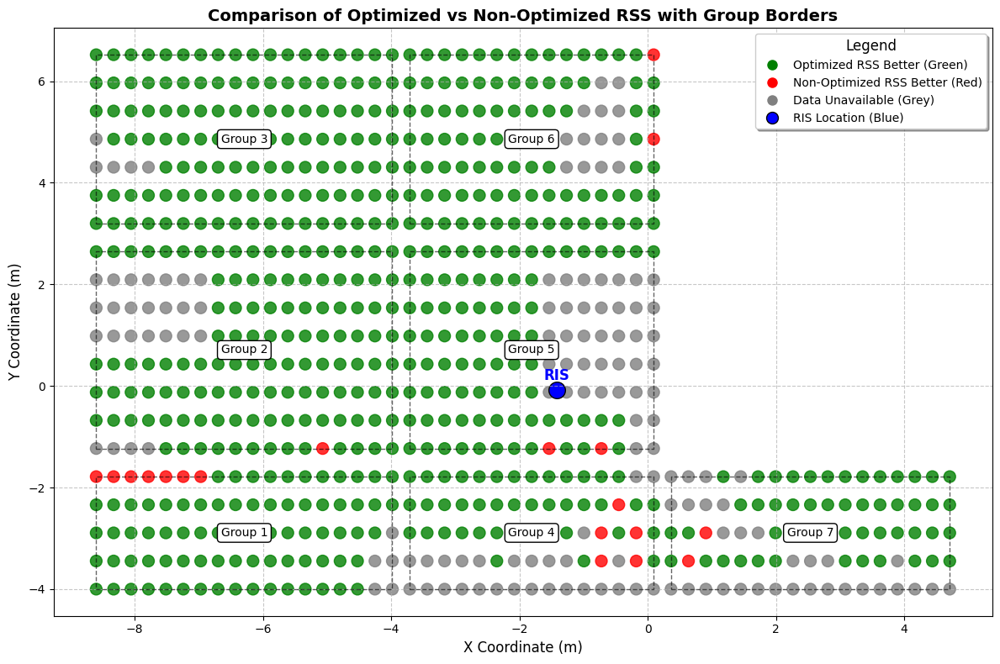

In [22]:
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import numpy as np

# Load the XML file with results
input_file = './ris(decreasedsize)_optimization_results/rss_comparison.xml'
tree = ET.parse(input_file)
root = tree.getroot()

# Initialize figure
plt.figure(figsize=(12, 8))

# Define group borders for visualization
group_borders = []

# Loop through all groups and plot data
for group in root.findall("Group"):
    group_name = group.get("name")
    x_coords = []
    y_coords = []
    colors = []

    # Extract data for plotting
    for point in group.find("PlotData").findall("Point"):
        x = float(point.find("X").text)
        y = float(point.find("Y").text)
        color = point.find("Color").text
        x_coords.append(x)
        y_coords.append(y)
        colors.append(color)

    # Plot data points
    plt.scatter(x_coords, y_coords, c=colors, s=100, alpha=0.8)

    # Calculate group center
    x_center = (min(x_coords) + max(x_coords)) / 2
    y_center = (min(y_coords) + max(y_coords)) / 2

    # Annotate group name at the center
    plt.text(x_center, y_center, group_name, fontsize=10, ha='center', va='center', 
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    # Save the group's border for drawing
    group_borders.append((min(x_coords), max(x_coords), min(y_coords), max(y_coords)))

# Highlight RIS location
ris_location = [-1.414, -0.079]  # Adjust RIS location based on your settings
plt.scatter(ris_location[0], ris_location[1], c='blue', s=200, marker='o', edgecolor='black', label="RIS Location")
plt.text(ris_location[0], ris_location[1] + 0.2, "RIS", fontsize=12, ha='center', color='blue', fontweight='bold')

# Draw group borders
for border in group_borders:
    x_min, x_max, y_min, y_max = border
    plt.plot([x_min, x_max, x_max, x_min, x_min], [y_min, y_min, y_max, y_max, y_min], 
             linestyle='--', color='black', linewidth=1, alpha=0.6)

# Customize plot
plt.xlabel("X Coordinate (m)", fontsize=12)
plt.ylabel("Y Coordinate (m)", fontsize=12)
plt.title("Comparison of Optimized vs Non-Optimized RSS with Group Borders", fontsize=14, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.7)

# Add legend with grey for unavailable data
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Optimized RSS Better (Green)', 
                   markerfacecolor='green', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Non-Optimized RSS Better (Red)', 
                   markerfacecolor='red', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Data Unavailable (Grey)', 
                   markerfacecolor='grey', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='RIS Location (Blue)', 
                   markerfacecolor='blue', markersize=10, markeredgecolor='black')
    ],
    loc="upper right", fontsize=10, title="Legend", title_fontsize=12, frameon=True, shadow=True
)

plt.tight_layout()
plt.show()


# Channel Coefficients @ Optimized RIS 

In [5]:
import os
import xml.etree.ElementTree as ET

# Path to the XML file
xml_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Check if the file exists
if not os.path.exists(xml_file):
    raise FileNotFoundError(f"The file '{xml_file}' does not exist.")

# Parse the XML file
tree = ET.parse(xml_file)
root = tree.getroot()

# Iterate through groups and print the saved data
print("\nSaved Data in XML File:")
for group in root.findall("Group"):
    group_name = group.get("name")
    print(f"\nGroup: {group_name}")
    
    for receiver in group.findall("Receiver"):
        receiver_id = receiver.get("id")
        x = receiver.find("X").text
        y = receiver.find("Y").text
        z = receiver.find("Z").text
        optimized_rss = receiver.find("OptimizedRSS_dB").text
        final_channel_coefficient = receiver.find("FinalChannelCoefficient").text

        print(f"  Receiver {receiver_id}:")
        print(f"    - Position: ({x}, {y}, {z})")
        print(f"    - Optimized RSS: {optimized_rss} dB")
        print(f"    - Final Channel Coefficient: {final_channel_coefficient}")

# Indicate that the process is complete
print("\nAll saved data has been successfully printed.")



Saved Data in XML File:

Group: Group 4
  Receiver 1:
    - Position: (-3.71, -4.00, 1.23)
    - Optimized RSS: NaN dB
    - Final Channel Coefficient: 0.000000+0.000000j
  Receiver 2:
    - Position: (-3.71, -3.45, 1.23)
    - Optimized RSS: NaN dB
    - Final Channel Coefficient: 0.000000+0.000000j
  Receiver 3:
    - Position: (-3.71, -2.89, 1.23)
    - Optimized RSS: -55.86 dB
    - Final Channel Coefficient: 0.001120+0.000001j
  Receiver 4:
    - Position: (-3.71, -2.34, 1.23)
    - Optimized RSS: -55.42 dB
    - Final Channel Coefficient: 0.000437+0.000015j
  Receiver 5:
    - Position: (-3.71, -1.79, 1.23)
    - Optimized RSS: -56.40 dB
    - Final Channel Coefficient: 0.000445+0.000012j
  Receiver 6:
    - Position: (-3.44, -4.00, 1.23)
    - Optimized RSS: NaN dB
    - Final Channel Coefficient: 0.000000+0.000000j
  Receiver 7:
    - Position: (-3.44, -3.45, 1.23)
    - Optimized RSS: NaN dB
    - Final Channel Coefficient: 0.000000+0.000000j
  Receiver 8:
    - Position: (-3

In [3]:
import os
import xml.etree.ElementTree as ET

# Path to the XML file
xml_file = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Check if the file exists
if not os.path.exists(xml_file):
    raise FileNotFoundError(f"The file '{xml_file}' does not exist.")

# Parse the XML file
tree = ET.parse(xml_file)
root = tree.getroot()

# Initialize counters
group_count = 0
total_receivers = 0

# Iterate through groups and count receivers
print("\nXML Report:")
for group in root.findall("Group"):
    group_count += 1
    group_name = group.get("name")
    receivers = group.findall("Receiver")
    receiver_count = len(receivers)
    total_receivers += receiver_count
    print(f"  - Group '{group_name}' contains {receiver_count} receiver(s).")

# Print the summary
print("\nSummary:")
print(f"  Total Groups Saved: {group_count}")
print(f"  Total Receivers Across All Groups: {total_receivers}")

# Indicate that the process is complete
print("\nReport generation complete.")



XML Report:
  - Group 'Group 4' contains 75 receiver(s).
  - Group 'Group 3' contains 126 receiver(s).
  - Group 'Group 2' contains 144 receiver(s).
  - Group 'Group 1' contains 90 receiver(s).
  - Group 'Group 5' contains 120 receiver(s).
  - Group 'Group 6' contains 105 receiver(s).
  - Group 'Group 7' contains 85 receiver(s).

Summary:
  Total Groups Saved: 7
  Total Receivers Across All Groups: 745

Report generation complete.


# C1 - Optimized RIS Localization Performance

In [42]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Load the XML file
xml_file_path = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
tree = ET.parse(xml_file_path)
root = tree.getroot()

# Extract data from XML
positions = []
channel_coefficients = []

for group in root.findall("Group"):
    for receiver in group.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

positions = np.array(positions, dtype=np.float32)
channel_coefficients = np.array(channel_coefficients, dtype=np.float32)

# Normalize the input and output data
input_scaler = StandardScaler()
channel_coefficients = input_scaler.fit_transform(channel_coefficients)

output_scaler = MinMaxScaler()
positions = output_scaler.fit_transform(positions)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_coefficients, positions, test_size=0.05, random_state=42
)

# Define a more robust DNN model for predicting the receiver position
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model
model_save_path = "./ris(decreasedsize)_optimization_results/ris_localization_model_improved.h5"
model.save(model_save_path)
print(f"Trained model saved at {model_save_path}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Epoch 1/300
45/45 [==============================] - 1s 5ms/step - loss: 0.3543 - mae: 0.3543 - val_loss: 0.2583 - val_mae: 0.2583
Epoch 2/300
45/45 [==============================] - 0s 3ms/step - loss: 0.2641 - mae: 0.2641 - val_loss: 0.2376 - val_mae: 0.2376
Epoch 3/300
45/45 [==============================] - 0s 4ms/step - loss: 0.2380 - mae: 0.2380 - val_loss: 0.2287 - val_mae: 0.2287
Epoch 4/300
45/45 [==============================] - 0s 4ms/step - loss: 0.2255 - mae: 0.2255 - val_loss: 0.2203 - val_mae: 0.2203
Epoch 5/300
45/45 [==============================] - 0s 4ms/step - loss: 0.2225 - mae: 0.2225 - val_loss: 0.2159 - val_mae: 0.2159
Epoch 6/300
45/45 [==============================] - 0s 4ms/step - loss: 0.2199 - mae: 0.2199 - val_loss: 0.2146 - val_mae: 0.2146
Epoch 7/300
45/45 [==============================] - 0s 4ms/step - loss: 0.2085 - mae: 0.2085 - val_loss: 0.2103 - val_mae: 0.2103
Epoch 8/300
45/45 [==============================] - 0s 4ms/step - loss: 0.2098 - m

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


24/24 [==============================] - 0s 812us/step


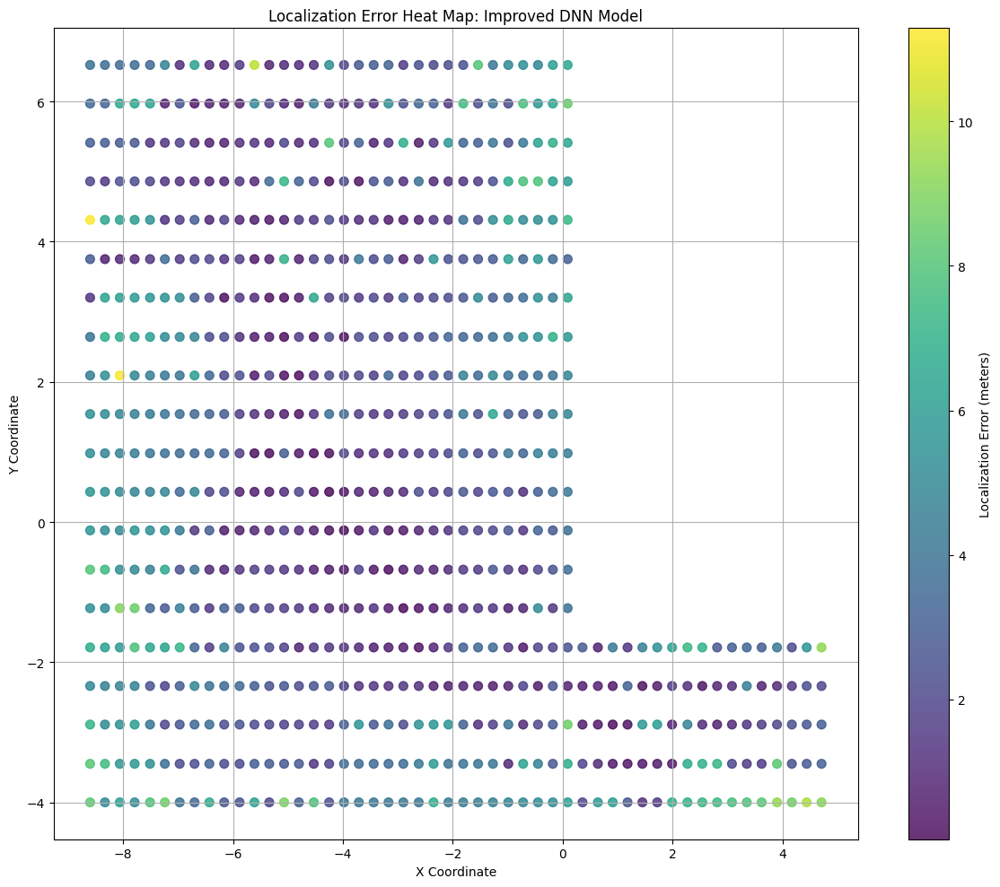

In [43]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/ris_localization_model_improved.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for group in root.findall("Group"):
        for receiver in group.findall("Receiver"):
            x = float(receiver.find("X").text)
            y = float(receiver.find("Y").text)
            channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
            positions.append([x, y])
            channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# True positions for plotting
x_true = true_positions[:, 0]
y_true = true_positions[:, 1]

plt.figure(figsize=(12, 10))

# Scatter plot with errors as color
scatter = plt.scatter(x_true, y_true, c=errors, cmap='viridis', s=50, alpha=0.8)
plt.colorbar(scatter, label='Localization Error (meters)')

# Plot settings
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Localization Error Heat Map: Improved DNN Model')
plt.grid(True)
plt.tight_layout()

# Display the heat map
plt.show()


In [44]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/ris_localization_model_improved.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for group in root.findall("Group"):
        for receiver in group.findall("Receiver"):
            x = float(receiver.find("X").text)
            y = float(receiver.find("Y").text)
            channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
            positions.append([x, y])
            channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate metrics
mean_error = np.mean(errors)
rmse = np.sqrt(np.mean(errors**2))
percentile_95_error = np.percentile(errors, 95)
accuracy_1m = np.mean(errors <= 1) * 100
accuracy_2m = np.mean(errors <= 2) * 100
accuracy_5m = np.mean(errors <= 5) * 100

# Print the metrics
print("Localization Metrics:")
print(f"Mean Localization Error: {mean_error:.2f} meters")
print(f"RMSE: {rmse:.2f} meters")
print(f"95th Percentile Error: {percentile_95_error:.2f} meters")
print(f"1-Meter Accuracy: {accuracy_1m:.2f}%")
print(f"2-Meter Accuracy: {accuracy_2m:.2f}%")
print(f"5-Meter Accuracy: {accuracy_5m:.2f}%")


24/24 [==============================] - 0s 717us/step
Localization Metrics:
Mean Localization Error: 3.06 meters
RMSE: 3.75 meters
95th Percentile Error: 7.22 meters
1-Meter Accuracy: 17.72%
2-Meter Accuracy: 38.79%
5-Meter Accuracy: 79.73%


# C2 -  Non-optimized RIS Localization performance

In [9]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Path to the XML file
xml_file_path = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"

# Check if the file exists
if not os.path.exists(xml_file_path):
    raise FileNotFoundError(f"The file '{xml_file_path}' does not exist.")

# Load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load the channel coefficients and receiver positions
channel_data, position_data = load_data_from_xml(xml_file_path)

# Normalize the input (channel coefficients) and output (positions)
input_scaler = StandardScaler()
channel_data = input_scaler.fit_transform(channel_data)

output_scaler = MinMaxScaler()
position_data = output_scaler.fit_transform(position_data)

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_data, position_data, test_size=0.2, random_state=42
)

# Build the DNN model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model
model_save_path = "./ris(decreasedsize)_optimization_results/non_optimized_ris_localization_model.h5"
model.save(model_save_path)
print(f"Trained model saved at {model_save_path}")

# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Predict positions for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
true_positions = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions for the first 10 samples
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], true_positions[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Custom input for prediction
custom_test_value = [[0.5, -0.3]]  # Example: real and imaginary parts of a channel coefficient
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Epoch 1/100
20/20 [==============================] - 1s 9ms/step - loss: 0.3503 - mae: 0.3503 - val_loss: 0.3050 - val_mae: 0.3050
Epoch 2/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2759 - mae: 0.2759 - val_loss: 0.2601 - val_mae: 0.2601
Epoch 3/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2529 - mae: 0.2529 - val_loss: 0.2429 - val_mae: 0.2429
Epoch 4/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2385 - mae: 0.2385 - val_loss: 0.2327 - val_mae: 0.2327
Epoch 5/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2273 - mae: 0.2273 - val_loss: 0.2276 - val_mae: 0.2276
Epoch 6/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2199 - mae: 0.2199 - val_loss: 0.2322 - val_mae: 0.2322
Epoch 7/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2178 - mae: 0.2178 - val_loss: 0.2332 - val_mae: 0.2332
Epoch 8/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2172 - m

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Predicted vs True Positions:
Test Sample 1: Predicted Position: [1.0151765  0.32320383], True Position: [-1.5375514 -3.4463158]
Test Sample 2: Predicted Position: [-2.2865636  3.8130817], True Position: [1.1787755 5.4126306]
Test Sample 3: Predicted Position: [-0.5281306  -0.85857165], True Position: [ 1.4504081 -4.       ]
Test Sample 4: Predicted Position: [1.8076893  0.78577125], True Position: [ 0.3638779 -4.       ]
Test Sample 5: Predicted Position: [-4.506933  -2.0837383], True Position: [-3.1673467  2.0905263]
Test Sample 6: Predicted Position: [-0.85227257  4.009672  ], True Position: [0.3638779 5.9663153]
Test Sample 7: Predicted Position: [ 0.37521788 -0.8254272 ], True Position: [-0.17938797 -0.67789483]
Test Sample 8: Predicted Position: [-0.7326031  1.219259 ], True Position: [-1.809184  3.197895]
Test Sample 9: Predicted Position: [0.7801256 3.4156556], True Position: [2.8085716 6.52     ]
Test Sample 10: Predicted Position: [-2.6511915  3.8692632], True Position: [-6.9

## heat map for exluding Group 8&9

24/24 [==============================] - 0s 726us/step


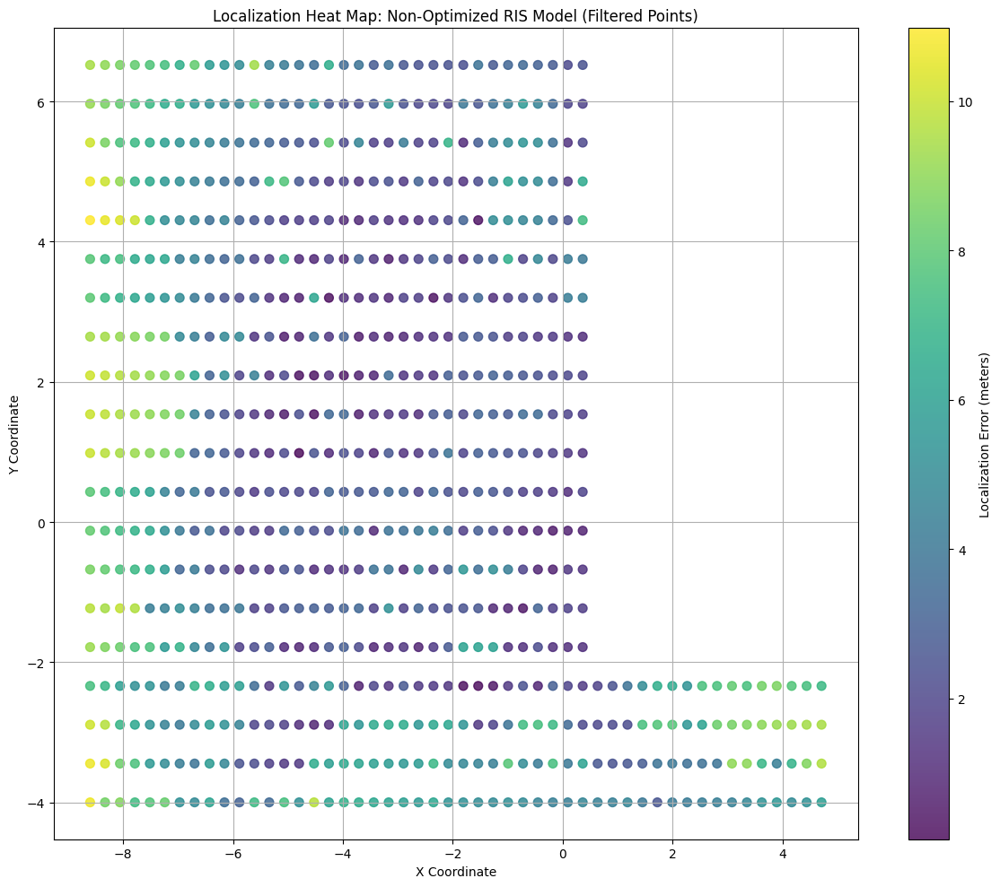

In [34]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/non_optimized_ris_localization_model.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)


# Function to load data from XML with filtering
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)

        # Exclude receiver points where x > 0.5 and y > -2.1
        if x > 0.5 and y > -2.1:
            continue

        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Create a heat map
x_true = true_positions[:, 0]
y_true = true_positions[:, 1]

plt.figure(figsize=(12, 10))

# Scatter plot with errors as color
scatter = plt.scatter(x_true, y_true, c=errors, cmap='viridis', s=50, alpha=0.8)
plt.colorbar(scatter, label='Localization Error (meters)')

# Plot settings
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Localization Heat Map: Non-Optimized RIS Model (Filtered Points)')
plt.grid(True)
plt.tight_layout()

# Display the heat map
plt.show()


In [35]:
import numpy as np

# Assuming `predicted_positions` and `true_positions` are already calculated
# If not, make sure to load the positions from the model and data as per the previous code.

# Calculate errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Mean Localization Error
mean_localization_error = np.mean(errors)

# RMSE (Root Mean Square Error)
rmse = np.sqrt(np.mean(errors**2))

# 95th Percentile Error
percentile_95_error = np.percentile(errors, 95)

# Accuracy calculations
def calculate_accuracy(errors, threshold):
    return np.sum(errors <= threshold) / len(errors) * 100

accuracy_1_meter = calculate_accuracy(errors, 1.0)  # 1-meter accuracy
accuracy_2_meter = calculate_accuracy(errors, 2.0)  # 2-meter accuracy
accuracy_5_meter = calculate_accuracy(errors, 5.0)  # 5-meter accuracy

# Print results
print(f"Mean Localization Error: {mean_localization_error:.2f} meters")
print(f"RMSE: {rmse:.2f} meters")
print(f"95th Percentile Error: {percentile_95_error:.2f} meters")
print(f"1-Meter Accuracy: {accuracy_1_meter:.2f}%")
print(f"2-Meter Accuracy: {accuracy_2_meter:.2f}%")
print(f"5-Meter Accuracy: {accuracy_5_meter:.2f}%")


Mean Localization Error: 4.15 meters
RMSE: 4.89 meters
95th Percentile Error: 9.19 meters
1-Meter Accuracy: 5.65%
2-Meter Accuracy: 25.00%
5-Meter Accuracy: 66.26%


# C3 - No-RIS Case Localization Performance

In [16]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET

# GPU Configuration
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0  # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import or Install Sionna
try:
    import sionna
except ImportError:
    os.system("pip install sionna")
    import sionna

# Configure TensorFlow GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Suppress TensorFlow warnings
tf.get_logger().setLevel('ERROR')

# Set random seed for reproducibility
sionna.config.seed = 42

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, PlanarArray

# Set save directory
save_dir = './non_ris_channel_coefficients'
os.makedirs(save_dir, exist_ok=True)

# Load the scene
scene_path = "Downloads/office/office.xml"
scene = load_scene(scene_path)

# Configure antenna array for transmitters
scene.tx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,  # Spacing between rows in meters
    horizontal_spacing=0.5,  # Spacing between columns in meters
    pattern="tr38901",
    polarization="V"
)

# Configure antenna array for receivers
scene.rx_array = PlanarArray(
    num_rows=1,
    num_cols=1,
    vertical_spacing=0.5,  # Spacing between rows in meters
    horizontal_spacing=0.5,  # Spacing between columns in meters
    pattern="dipole",
    polarization="cross"
)

# Create transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and synthetic array
scene.frequency = 2.14e9  # Hz
scene.synthetic_array = True

# Generate 1000 receiver positions
y_positions = np.linspace(-4.0, 6.52, 20)
x_positions = np.linspace(-8.6, 4.71, 50)
y_grid, x_grid = np.meshgrid(y_positions, x_positions)
receiver_positions = np.c_[x_grid.ravel(), y_grid.ravel(), np.full(x_grid.size, 1.23)]  # Height = 1.23 m

# Prepare XML for results
root = ET.Element("ChannelCoefficientsWithoutRIS")

# Compute channel coefficients for each receiver position
for idx, position in enumerate(receiver_positions):
    rx_name = f"rx_{idx}"
    rx = Receiver(name=rx_name, position=position.tolist(), orientation=[0, 0, 0])
    scene.add(rx)

    # Compute propagation paths
    paths = scene.compute_paths(max_depth=5, num_samples=int(1e6))
    total_channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

    # Save results to XML
    rx_element = ET.SubElement(root, "Receiver")
    ET.SubElement(rx_element, "X").text = str(position[0])
    ET.SubElement(rx_element, "Y").text = str(position[1])
    ET.SubElement(rx_element, "Z").text = str(position[2])
    ET.SubElement(rx_element, "ChannelCoefficient").text = str(total_channel_coefficient)

    # Remove receiver from the scene
    scene.remove(rx_name)

# Save the results to the specified directory
output_path = os.path.join(save_dir, "receiver_channel_coefficients_no_ris.xml")
tree = ET.ElementTree(root)
tree.write(output_path)
print(f"Results saved to {output_path}")



Results saved to ./non_ris_channel_coefficients/receiver_channel_coefficients_no_ris.xml


In [17]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Path to the XML file
xml_file_path = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_no_ris.xml"

# Check if the file exists
if not os.path.exists(xml_file_path):
    raise FileNotFoundError(f"The file '{xml_file_path}' does not exist.")

# Load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load the channel coefficients and receiver positions
channel_data, position_data = load_data_from_xml(xml_file_path)

# Normalize the input (channel coefficients) and output (positions)
input_scaler = StandardScaler()
channel_data = input_scaler.fit_transform(channel_data)

output_scaler = MinMaxScaler()
position_data = output_scaler.fit_transform(position_data)

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_data, position_data, test_size=0.2, random_state=42
)

# Build the DNN model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model with an appropriate name
model_save_path = "./ris(decreasedsize)_optimization_results/non_ris_localization_model.h5"
model.save(model_save_path)
print(f"Trained model saved at {model_save_path}")

# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Predict positions for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
true_positions = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions for the first 10 samples
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], true_positions[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Custom input for prediction
custom_test_value = [[0.5, -0.3]]  # Example: real and imaginary parts of a channel coefficient
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Epoch 1/100
20/20 [==============================] - 1s 8ms/step - loss: 0.3552 - mae: 0.3552 - val_loss: 0.2930 - val_mae: 0.2930
Epoch 2/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2650 - mae: 0.2650 - val_loss: 0.2554 - val_mae: 0.2554
Epoch 3/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2376 - mae: 0.2376 - val_loss: 0.2423 - val_mae: 0.2423
Epoch 4/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2238 - mae: 0.2238 - val_loss: 0.2331 - val_mae: 0.2331
Epoch 5/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2180 - mae: 0.2180 - val_loss: 0.2323 - val_mae: 0.2323
Epoch 6/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2163 - mae: 0.2163 - val_loss: 0.2337 - val_mae: 0.2337
Epoch 7/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2134 - mae: 0.2134 - val_loss: 0.2302 - val_mae: 0.2302
Epoch 8/100
20/20 [==============================] - 0s 4ms/step - loss: 0.2086 - m

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Test Loss: 0.1970665603876114, Test MAE: 0.1970665603876114
7/7 [==============================] - 0s 802us/step

Predicted vs True Positions:
Test Sample 1: Predicted Position: [1.1867962 0.7619566], True Position: [-1.5375514 -3.4463158]
Test Sample 2: Predicted Position: [-4.2608113  5.740002 ], True Position: [1.1787755 5.4126306]
Test Sample 3: Predicted Position: [-1.8888383 -1.6076626], True Position: [ 1.4504081 -4.       ]
Test Sample 4: Predicted Position: [ 2.1211514  -0.34076002], True Position: [ 0.3638779 -4.       ]
Test Sample 5: Predicted Position: [-2.9387214 -0.9498569], True Position: [-3.1673467  2.0905263]
Test Sample 6: Predicted Position: [2.558909  0.7768171], True Position: [0.3638779 5.9663153]
Test Sample 7: Predicted Position: [-2.5427136 -1.3642619], True Position: [-0.17938797 -0.67789483]
Test Sample 8: Predicted Position: [-2.0530417  0.951306 ], True Position: [-1.809184  3.197895]
Test Sample 9: Predicted Position: [-4.6882315  4.2346625], True Positi

24/24 [==============================] - 0s 734us/step


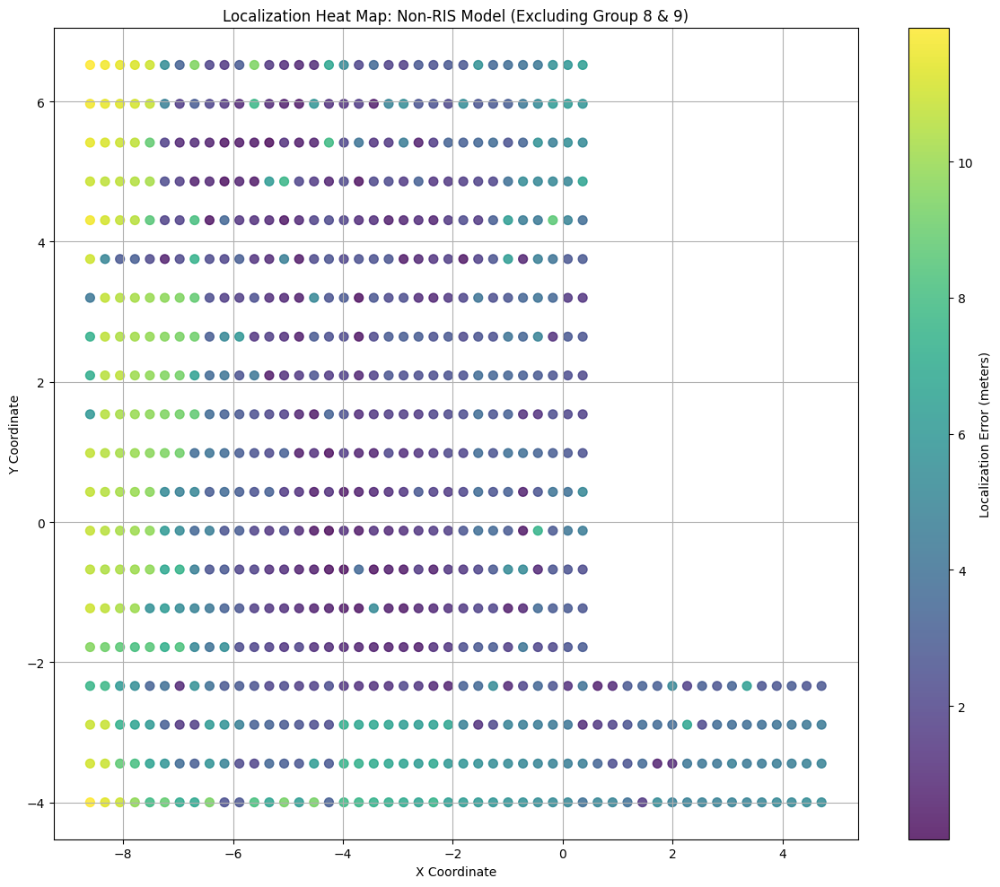

In [26]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/non_ris_localization_model.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_no_ris.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Load data from XML while avoiding Group 8 and Group 9
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)

        # Avoid Group 8 and Group 9 by checking their coordinates
        # Example: Adjust these conditions based on actual Group 8 and 9 ranges
        if (x > 0.5 and y > -2.1):  # Example condition to exclude groups
            continue

        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the trained model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Create a heat map
x_true = true_positions[:, 0]
y_true = true_positions[:, 1]

plt.figure(figsize=(12, 10))

# Scatter plot with errors as color
scatter = plt.scatter(x_true, y_true, c=errors, cmap='viridis', s=50, alpha=0.8)
plt.colorbar(scatter, label='Localization Error (meters)')

# Plot settings
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Localization Heat Map: Non-RIS Model (Excluding Group 8 & 9)')
plt.grid(True)
plt.tight_layout()

# Display the heat map
plt.show()


In [29]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/non_ris_localization_model.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_no_ris.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Load data from XML while avoiding Group 8 and Group 9
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)

        # Avoid Group 8 and Group 9 by checking their coordinates
        if (x > 0.5 and y > -2.1):  # Adjust these conditions for Group 8 & 9
            continue

        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the trained model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Compute metrics
mean_error = np.mean(errors)
rmse = np.sqrt(mean_squared_error(true_positions, predicted_positions))
percentile_95_error = np.percentile(errors, 95)
accuracy_1m = np.sum(errors <= 1.0) / len(errors) * 100  # Percentage of errors ? 1 meter
accuracy_2m = np.sum(errors <= 2.0) / len(errors) * 100  # Percentage of errors ? 2 meters
accuracy_5m = np.sum(errors <= 5.0) / len(errors) * 100  # Percentage of errors ? 5 meters

# Display results in a table-like format
print("\nLocalization Performance Metrics (Excluding Group 8 & 9):")
print(f"{'Metric':<25} {'Value':<10}")
print("-" * 35)
print(f"{'Mean Localization Error:':<25} {mean_error:.2f} meters")
print(f"{'RMSE:':<25} {rmse:.2f} meters")
print(f"{'95th Percentile Error:':<25} {percentile_95_error:.2f} meters")
print(f"{'1-Meter Accuracy:':<25} {accuracy_1m:.2f}%")
print(f"{'2-Meter Accuracy:':<25} {accuracy_2m:.2f}%")
print(f"5-Meter Accuracy: {accuracy_5m:.2f}%")



24/24 [==============================] - 0s 799us/step

Localization Performance Metrics (Excluding Group 8 & 9):
Metric                    Value     
-----------------------------------
Mean Localization Error:  4.05 meters
RMSE:                     3.58 meters
95th Percentile Error:    10.60 meters
1-Meter Accuracy:         12.10%
2-Meter Accuracy:         29.03%
5-Meter Accuracy: 69.89%


# RSS Base Localization Trials


Localization Performance Metrics:
Mean Localization Error: 5.80 meters
RMSE: 6.25 meters
95th Percentile Error: 9.50 meters
1-Meter Accuracy: 1.21%
2-Meter Accuracy: 5.24%
5-Meter Accuracy: 39.65%


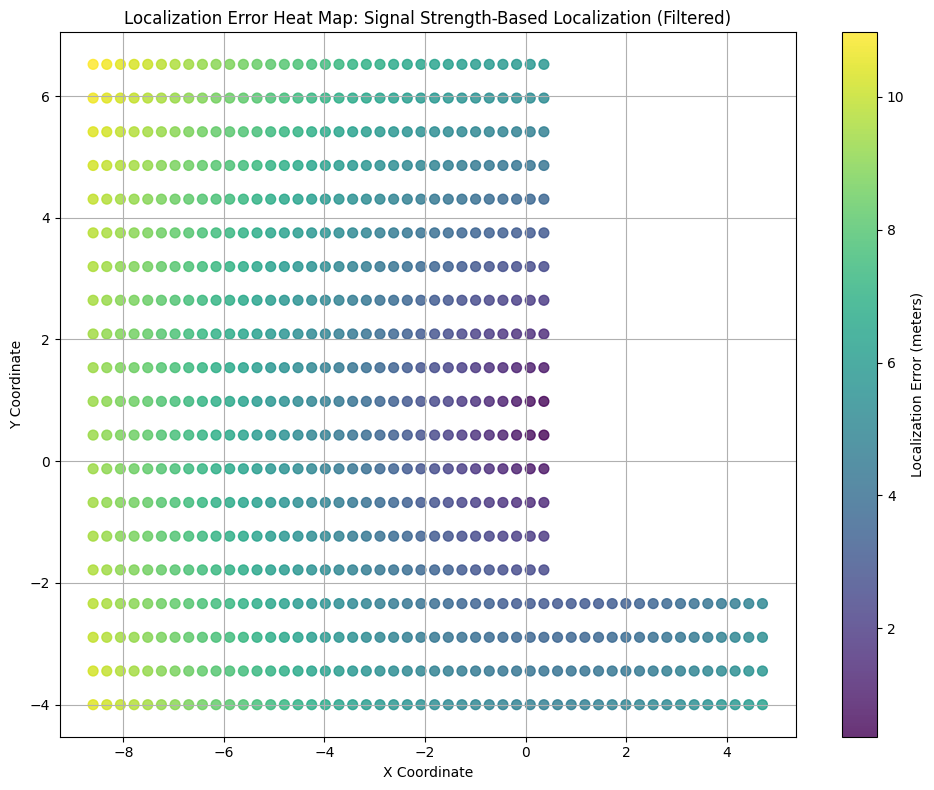

In [57]:
import os
import numpy as np
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.optimize import minimize

# Paths
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_no_ris.xml"

# Check if the file exists
if not os.path.exists(XML_FILE_PATH):
    raise FileNotFoundError(f"The file '{XML_FILE_PATH}' does not exist.")

# Define RSS calculation model
def calculate_rss(tx_position, rx_position, path_loss_exponent=2):
    """
    Calculate simulated RSS value based on the log-distance path loss model.

    Args:
        tx_position: Transmitter position [x, y].
        rx_position: Receiver position [x, y].
        path_loss_exponent: Path loss exponent (default is 2 for free space).

    Returns:
        RSS value in dB.
    """
    distance = np.linalg.norm(tx_position - rx_position)
    return -10 * path_loss_exponent * np.log10(distance + 1e-6)

# Load receiver positions and RSS values from XML
def load_data_from_xml(file_path, tx_position, path_loss_exponent=2):
    tree = ET.parse(file_path)
    root = tree.getroot()

    true_positions = []
    rss_values = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)

        # Exclude receiver points where x > 0.5 and y > -2.1
        if x > 0.5 and y > -2.1:
            continue

        true_positions.append([x, y])

        # Simulate RSS based on the true receiver location
        rss = calculate_rss(tx_position, np.array([x, y]), path_loss_exponent)
        rss_values.append(rss)0
    return np.array(true_positions, dtype=np.float32), np.array(rss_values, dtype=np.float32)

# Load receiver positions and simulated RSS values
tx_position = np.array([0.0, 0.0])  # Transmitter fixed at the origin
true_positions, rss_values = load_data_from_xml(XML_FILE_PATH, tx_position)

# Normalize RSS values
rss_scaler = MinMaxScaler()
normalized_rss = rss_scaler.fit_transform(rss_values.reshape(-1, 1)).flatten()

# RSS-based localization for predicting receiver locations
def rss_localization_model(rx_position, tx_position, observed_rss):
    """
    Predict receiver location by minimizing RSS error.

    Args:
        rx_position: Predicted receiver position [x, y].
        tx_position: Fixed transmitter position [x, y].
        observed_rss: Observed RSS value.

    Returns:
        Sum of squared RSS errors.
    """
    estimated_rss = calculate_rss(tx_position, rx_position)
    return (estimated_rss - observed_rss) ** 2

# Predict receiver locations
predicted_positions = []
for observed_rss in normalized_rss:
    initial_guess = [0.0, 0.0]  # Initial guess for receiver position
    result = minimize(
        rss_localization_model,
        initial_guess,
        args=(tx_position, observed_rss),
        method="L-BFGS-B",
        bounds=[(-10, 10), (-10, 10)]
    )
    predicted_positions.append(result.x)

predicted_positions = np.array(predicted_positions)

# Calculate localization errors
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate performance metrics
mean_error = np.mean(errors)
rmse = np.sqrt(np.mean(errors**2))
percentile_95 = np.percentile(errors, 95)
accuracy_1m = np.sum(errors <= 1.0) / len(errors) * 100
accuracy_2m = np.sum(errors <= 2.0) / len(errors) * 100
accuracy_5m = np.sum(errors <= 5.0) / len(errors) * 100

# Print metrics
print("Localization Performance Metrics:")
print(f"Mean Localization Error: {mean_error:.2f} meters")
print(f"RMSE: {rmse:.2f} meters")
print(f"95th Percentile Error: {percentile_95:.2f} meters")
print(f"1-Meter Accuracy: {accuracy_1m:.2f}%")
print(f"2-Meter Accuracy: {accuracy_2m:.2f}%")
print(f"5-Meter Accuracy: {accuracy_5m:.2f}%")

# Generate Heat Map
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    true_positions[:, 0], 
    true_positions[:, 1], 
    c=errors, 
    cmap='viridis', 
    s=50, 
    alpha=0.8
)
plt.colorbar(scatter, label='Localization Error (meters)')
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.title("Localization Error Heat Map: Signal Strength-Based Localization (Filtered)")
plt.grid(True)
plt.tight_layout()
plt.show()


# Comparison Table

In [62]:
# Define the localization metrics data
metrics = [
    "Mean Localization Error (m)",
    "95th Percentile Error (m)",
    "1-Meter Accuracy (%)",
    "2-Meter Accuracy (%)",
    "5-Meter Accuracy (%)"
]

# Data for each case
optimized_ris = [3.06, 7.22, 17.72, 38.79, 79.73]
no_ris = [4.05, 10.60, 12.10, 29.03, 69.89]
traditional_rss = [5.80, 9.50, 1.21, 5.24, 39.65]

# Column headers
headers = ["Metric", "Optimized RIS Case", "No-RIS Case", "Traditional RSS-Based Results"]

# Table border
border = "+" + "-" * 35 + "+" + "-" * 22 + "+" + "-" * 22 + "+" + "-" * 32 + "+"

# Display the table
print(border)
print(f"| {headers[0]:<35} | {headers[1]:<20} | {headers[2]:<20} | {headers[3]:<30} |")
print(border)

# Display each row with data
for i, metric in enumerate(metrics):
    print(
        f"| {metric:<35} | {optimized_ris[i]:<20.2f} | {no_ris[i]:<20.2f} | {traditional_rss[i]:<30.2f} |"
    )
print(border)


+-----------------------------------+----------------------+----------------------+--------------------------------+
| Metric                              | Optimized RIS Case   | No-RIS Case          | Traditional RSS-Based Results  |
+-----------------------------------+----------------------+----------------------+--------------------------------+
| Mean Localization Error (m)         | 3.06                 | 4.05                 | 5.80                           |
| 95th Percentile Error (m)           | 7.22                 | 10.60                | 9.50                           |
| 1-Meter Accuracy (%)                | 17.72                | 12.10                | 1.21                           |
| 2-Meter Accuracy (%)                | 38.79                | 29.03                | 5.24                           |
| 5-Meter Accuracy (%)                | 79.73                | 69.89                | 39.65                          |
+-----------------------------------+---------------

In [68]:
import numpy as np
import tensorflow as tf
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Scene and model configuration
scene_path = "Downloads/office/office.xml"  # Path to the scene file
tx_position = [-8.5, -5.13, 4.63]  # Transmitter position
rx_position = [0, 1, 1.23]    # Receiver position (example)
ris_position = [-1.414, -0.079, 5.869]  # RIS position
ris_orientation = [-1.539, -0.018, 0.0005]  # RIS orientation
frequency = 2.14e9  # Frequency in Hz (2.14 GHz)
c = 3e8  # Speed of light
wavelength = c / frequency  # Wavelength in meters

# Power and noise configuration
Pt = 1.0  # Transmit power in watts
noise_figure = 5  # Noise figure in dB
thermal_noise_power_dbm = -174 + 10 * np.log10(1e6)  # Thermal noise power in dBm for 1 MHz bandwidth
thermal_noise_power_w = 10 ** ((thermal_noise_power_dbm - 30) / 10)  # Convert to watts

# Load the scene
scene = load_scene(scene_path)

# Configure the transmitter
tx_array = PlanarArray(
    num_rows=1, num_cols=1,
    vertical_spacing=0.5, horizontal_spacing=0.5,
    pattern="tr38901", polarization="V"
)
scene.tx_array = tx_array
tx = Transmitter(name="tx", position=tx_position)
scene.add(tx)

# Configure the receiver
rx_array = PlanarArray(
    num_rows=1, num_cols=1,
    vertical_spacing=0.5, horizontal_spacing=0.5,
    pattern="dipole", polarization="cross"
)
scene.rx_array = rx_array
rx = Receiver(name="rx", position=rx_position)
scene.add(rx)

# Configure the RIS
num_rows = num_cols = int(5 / (0.5 * wavelength))  # Example RIS size
ris = RIS(
    name="ris", position=ris_position, look_at=ris_orientation,
    num_rows=num_rows, num_cols=num_cols
)
scene.add(ris)

# Compute propagation paths
scene.synthetic_array = True
scene.frequency = frequency
paths = scene.compute_paths(max_depth=5, num_samples=int(1e6))

# Calculate the total channel coefficient
channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Calculate received power
received_power_w = Pt * (np.abs(channel_coefficient) ** 2)
received_power_dbm = 10 * np.log10(received_power_w) + 30

# Calculate SNR
snr_linear = received_power_w / thermal_noise_power_w
snr_db = 10 * np.log10(snr_linear)

# Output the results
print(f"Channel Coefficient for Receiver at {rx_position}: {channel_coefficient}")
print(f"Transmit Power (Pt): {Pt} W")
print(f"Received Power: {received_power_dbm:.2f} dBm")
print(f"SNR: {snr_db:.2f} dB")


Channel Coefficient for Receiver at [0, 1, 1.23]: (-0.00012825315934605896-6.7842543103324715e-06j)
Transmit Power (Pt): 1.0 W
Received Power: -47.83 dBm
SNR: 66.17 dB


In [70]:
import numpy as np
import tensorflow as tf
from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# Scene and model configuration
scene_path = "Downloads/office/office.xml"  # Path to the scene file
tx_position = [-8.5, -5.13, 4.63]  # Transmitter position
rx_position = [0, 1, 1.23]    # Receiver position (example)
ris_position = [-1.414, -0.079, 5.869]  # RIS position
ris_orientation = [-1.539, -0.018, 0.0005]  # RIS orientation
frequency = 2.14e9  # Frequency in Hz (2.14 GHz)
c = 3e8  # Speed of light
wavelength = c / frequency  # Wavelength in meters

# Power and noise configuration
Pt = 3.0  # Transmit power in watts
noise_figure = 5  # Noise figure in dB
thermal_noise_power_dbm = -174 + 10 * np.log10(1e6)  # Thermal noise power in dBm for 1 MHz bandwidth
thermal_noise_power_w = 10 ** ((thermal_noise_power_dbm - 30) / 10)  # Convert to watts

# Load the scene
scene = load_scene(scene_path)

# Configure the transmitter
tx_array = PlanarArray(
    num_rows=1, num_cols=1,
    vertical_spacing=0.5, horizontal_spacing=0.5,
    pattern="tr38901", polarization="V"
)
scene.tx_array = tx_array
tx = Transmitter(name="tx", position=tx_position)
scene.add(tx)

# Configure the receiver
rx_array = PlanarArray(
    num_rows=1, num_cols=1,
    vertical_spacing=0.5, horizontal_spacing=0.5,
    pattern="dipole", polarization="cross"
)
scene.rx_array = rx_array
rx = Receiver(name="rx", position=rx_position)
scene.add(rx)

# Configure the RIS
num_rows = num_cols = int(5 / (0.5 * wavelength))  # Example RIS size
ris = RIS(
    name="ris", position=ris_position, look_at=ris_orientation,
    num_rows=num_rows, num_cols=num_cols
)
scene.add(ris)

# Compute propagation paths
scene.synthetic_array = True
scene.frequency = frequency
paths = scene.compute_paths(max_depth=5, num_samples=int(1e6))

# Calculate the total channel coefficient
channel_coefficient = tf.reduce_sum(paths.a[0, 0, 0, 0, 0, :, 0]).numpy()

# Calculate received power
received_power_w = Pt * (np.abs(channel_coefficient) ** 2)
received_power_dbm = 10 * np.log10(received_power_w) + 30

# Calculate SNR
snr_linear = received_power_w / thermal_noise_power_w
snr_db = 10 * np.log10(snr_linear)

# Output the results
print(f"Channel Coefficient for Receiver at {rx_position}: {channel_coefficient}")
print(f"Transmit Power (Pt): {Pt} W")
print(f"Received Power: {received_power_dbm:.2f} dBm")
print(f"SNR: {snr_db:.2f} dB")


Channel Coefficient for Receiver at [0, 1, 1.23]: (-0.00012825315934605896-6.7842543103324715e-06j)
Transmit Power (Pt): 3.0 W
Received Power: -43.06 dBm
SNR: 70.94 dB


# Spatial Consistency

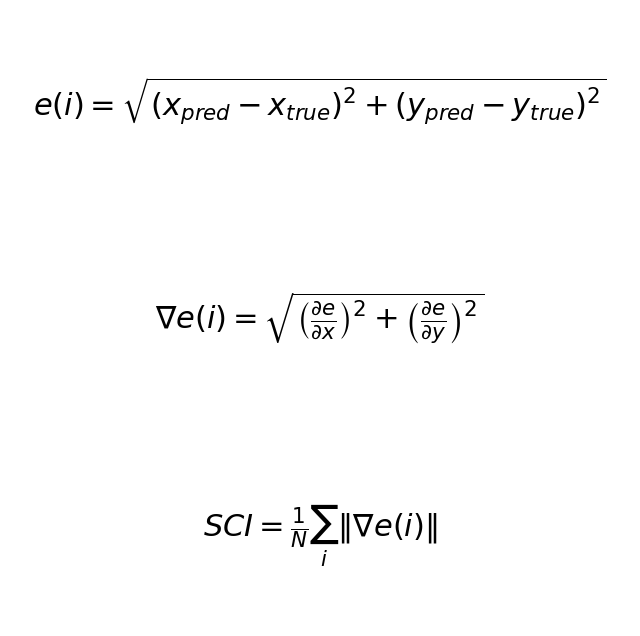

In [34]:
import matplotlib.pyplot as plt

# Define the formulas as LaTeX strings
error_formula = r"e(i) = \sqrt{(x_{pred} - x_{true})^2 + (y_{pred} - y_{true})^2}"
gradient_formula = r"\nabla e(i) = \sqrt{\left(\frac{\partial e}{\partial x}\right)^2 + \left(\frac{\partial e}{\partial y}\right)^2}"
sci_formula = r"SCI = \frac{1}{N} \sum_{i} \|\nabla e(i)\|"

# Create figure for formulas
fig, ax = plt.subplots(3, 1, figsize=(8, 8))  # Increase figure size for better readability

# Hide the axes
for a in ax:
    a.axis('off')

# Display the formulas with larger font
ax[0].text(0.5, 0.5, f"${error_formula}$", fontsize=22, ha='center', va='center')
ax[1].text(0.5, 0.5, f"${gradient_formula}$", fontsize=22, ha='center', va='center')
ax[2].text(0.5, 0.5, f"${sci_formula}$", fontsize=22, ha='center', va='center')

plt.show()


## Optimized RIS

24/24 [==============================] - 0s 791us/step
Spatial Consistency Index (SCI): 0.4431


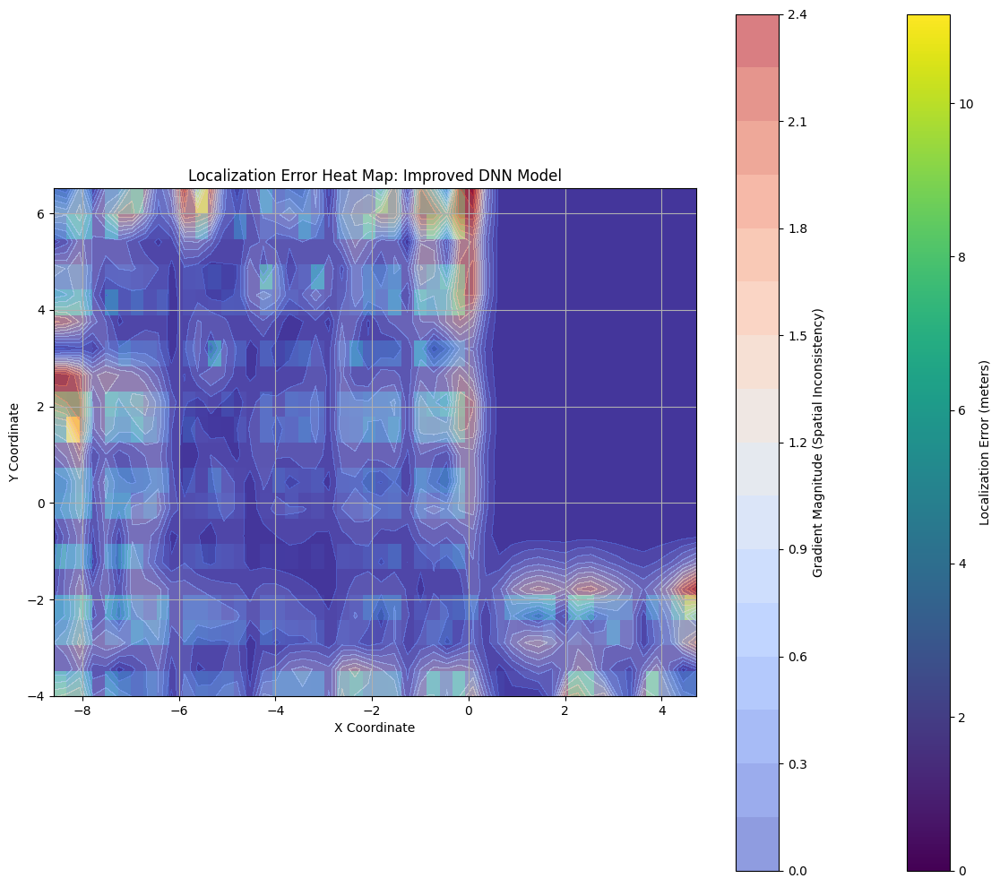

In [17]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/ris_localization_model_improved.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for group in root.findall("Group"):
        for receiver in group.findall("Receiver"):
            x = float(receiver.find("X").text)
            y = float(receiver.find("Y").text)
            channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
            positions.append([x, y])
            channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI): {sci:.4f}")

# Visualization
plt.figure(figsize=(12, 10))
plt.imshow(error_grid.T, origin='lower', extent=[min(x_true), max(x_true), min(y_true), max(y_true)], cmap='viridis')
plt.colorbar(label='Localization Error (meters)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Localization Error Heat Map: Improved DNN Model')

# Overlay gradient map to visualize spatial consistency
plt.contourf(x_bins, y_bins, gradient_magnitude.T, levels=15, alpha=0.6, cmap='coolwarm')
plt.colorbar(label='Gradient Magnitude (Spatial Inconsistency)')

plt.grid(True)
plt.tight_layout()
plt.show()


## No-RIS

24/24 [==============================] - 0s 778us/step
Spatial Consistency Index (SCI) for Non-RIS Case (Excluding Points): 0.5832


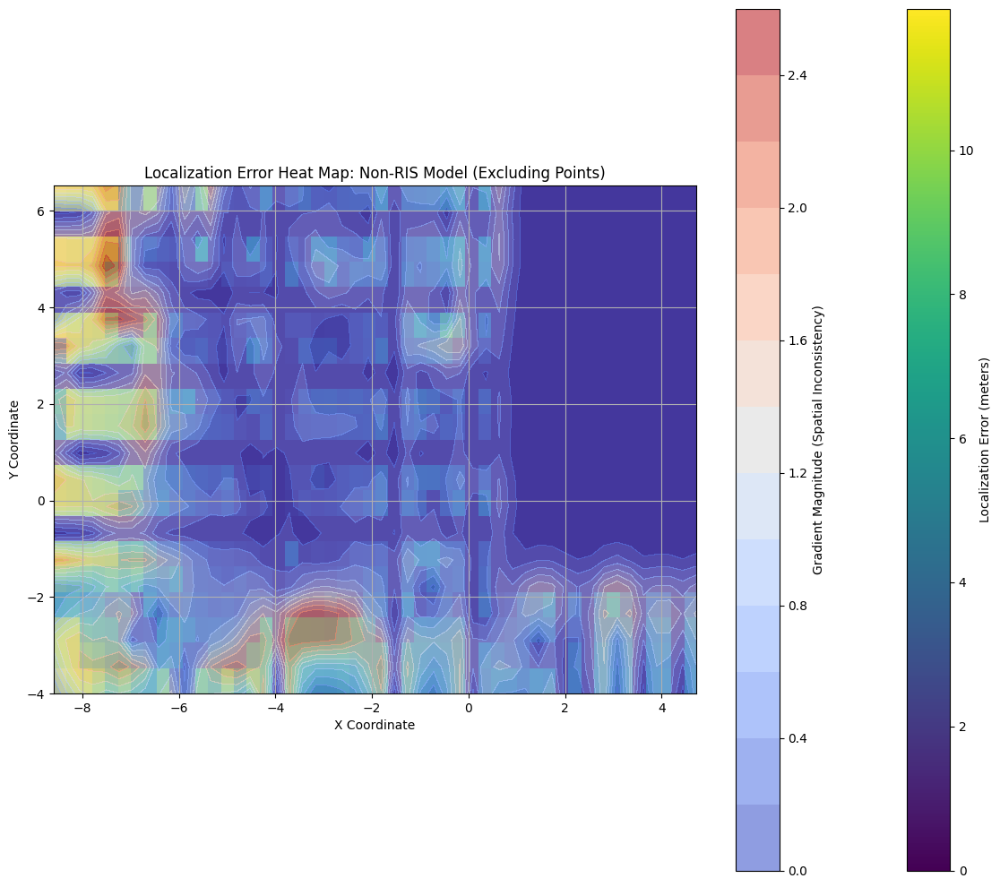

In [20]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/non_ris_localization_model.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_no_ris.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML, excluding specific points
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)

        # Exclude receiver points where x > 0.5 and y > -2.1
        if x > 0.5 and y > -2.1:
            continue

        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for Non-RIS Case (Excluding Points): {sci:.4f}")

# Visualization
plt.figure(figsize=(12, 10))
plt.imshow(error_grid.T, origin='lower', extent=[min(x_true), max(x_true), min(y_true), max(y_true)], cmap='viridis')
plt.colorbar(label='Localization Error (meters)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Localization Error Heat Map: Non-RIS Model (Excluding Points)')

# Overlay gradient map to visualize spatial consistency
plt.contourf(x_bins, y_bins, gradient_magnitude.T, levels=15, alpha=0.6, cmap='coolwarm')
plt.colorbar(label='Gradient Magnitude (Spatial Inconsistency)')

plt.grid(True)
plt.tight_layout()
plt.show()


## RSS Based

Spatial Consistency Index (SCI): 0.6815


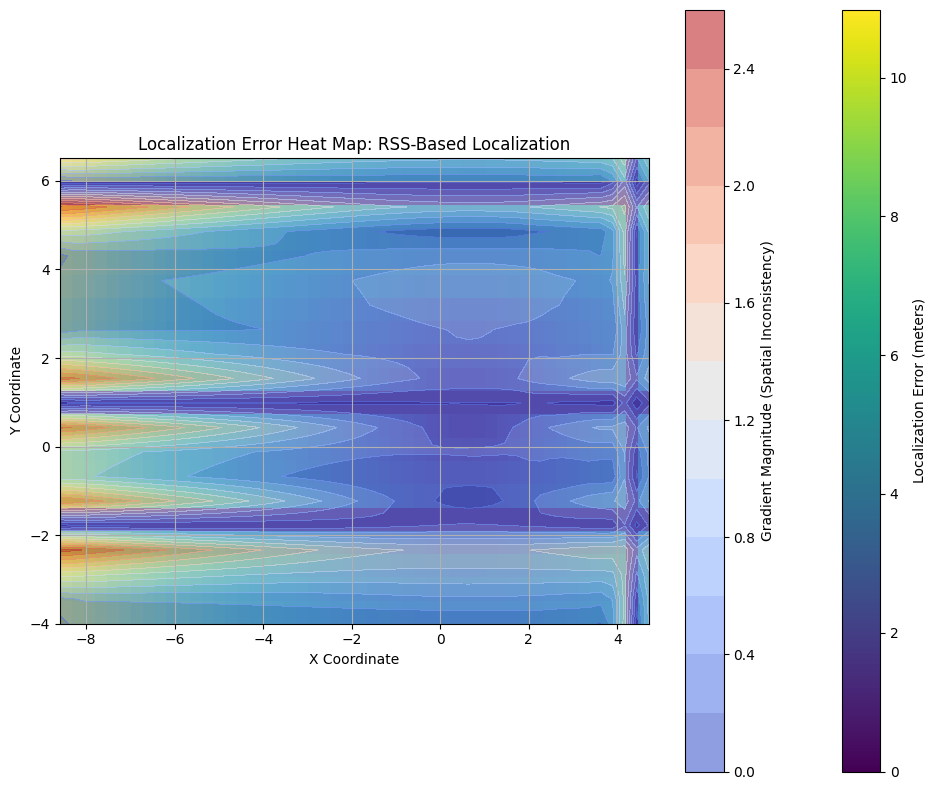

In [21]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.optimize import minimize
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_no_ris.xml"

# Check if the file exists
if not os.path.exists(XML_FILE_PATH):
    raise FileNotFoundError(f"The file '{XML_FILE_PATH}' does not exist.")

# Define RSS calculation model
def calculate_rss(tx_position, rx_position, path_loss_exponent=2):
    """
    Calculate simulated RSS value based on the log-distance path loss model.

    Args:
        tx_position: Transmitter position [x, y].
        rx_position: Receiver position [x, y].
        path_loss_exponent: Path loss exponent (default is 2 for free space).

    Returns:
        RSS value in dB.
    """
    distance = np.linalg.norm(tx_position - rx_position)
    return -10 * path_loss_exponent * np.log10(distance + 1e-6)

# Load receiver positions and RSS values from XML
def load_data_from_xml(file_path, tx_position, path_loss_exponent=2):
    tree = ET.parse(file_path)
    root = tree.getroot()

    true_positions = []
    rss_values = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)

        true_positions.append([x, y])

        # Simulate RSS based on the true receiver location
        rss = calculate_rss(tx_position, np.array([x, y]), path_loss_exponent)
        rss_values.append(rss)

    return np.array(true_positions, dtype=np.float32), np.array(rss_values, dtype=np.float32)

# Load receiver positions and simulated RSS values
tx_position = np.array([0.0, 0.0])  # Transmitter fixed at the origin
true_positions, rss_values = load_data_from_xml(XML_FILE_PATH, tx_position)

# Normalize RSS values
rss_scaler = MinMaxScaler()
normalized_rss = rss_scaler.fit_transform(rss_values.reshape(-1, 1)).flatten()

# RSS-based localization for predicting receiver locations
def rss_localization_model(rx_position, tx_position, observed_rss):
    """
    Predict receiver location by minimizing RSS error.

    Args:
        rx_position: Predicted receiver position [x, y].
        tx_position: Fixed transmitter position [x, y].
        observed_rss: Observed RSS value.

    Returns:
        Sum of squared RSS errors.
    """
    estimated_rss = calculate_rss(tx_position, rx_position)
    return (estimated_rss - observed_rss) ** 2

# Predict receiver locations
predicted_positions = []
for observed_rss in normalized_rss:
    initial_guess = [0.0, 0.0]  # Initial guess for receiver position
    result = minimize(
        rss_localization_model,
        initial_guess,
        args=(tx_position, observed_rss),
        method="L-BFGS-B",
        bounds=[(-10, 10), (-10, 10)]
    )
    predicted_positions.append(result.x)

predicted_positions = np.array(predicted_positions)

# Calculate localization errors
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency index (SCI)
grid_size = (50, 20)  # Grid for visualization
error_grid = np.zeros(grid_size)

x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI)
sci = np.mean(gradient_magnitude)
print(f"Spatial Consistency Index (SCI): {sci:.4f}")

# Visualization of localization errors
plt.figure(figsize=(10, 8))
plt.imshow(error_grid.T, origin='lower', extent=[min(x_true), max(x_true), min(y_true), max(y_true)], cmap='viridis')
plt.colorbar(label='Localization Error (meters)')
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.title("Localization Error Heat Map: RSS-Based Localization")

# Overlay gradient map to visualize spatial consistency
plt.contourf(x_bins, y_bins, gradient_magnitude.T, levels=15, alpha=0.6, cmap='coolwarm')
plt.colorbar(label='Gradient Magnitude (Spatial Inconsistency)')

plt.grid(True)
plt.tight_layout()
plt.show()


# Spatial Consistency Analysis for Different Training Values 


## Optimized

### Train @45 Percent of RPs

In [11]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Load the XML file
xml_file_path = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
tree = ET.parse(xml_file_path)
root = tree.getroot()

# Extract data from XML
positions = []
channel_coefficients = []

for group in root.findall("Group"):
    for receiver in group.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

positions = np.array(positions, dtype=np.float32)
channel_coefficients = np.array(channel_coefficients, dtype=np.float32)

# Select approximately 45% of the data randomly
num_selected = int(len(positions) * 0.45)
selected_indices = np.random.choice(len(positions), num_selected, replace=False)

positions = positions[selected_indices]
channel_coefficients = channel_coefficients[selected_indices]

# Print the number of selected receiver points
print(f"Total number of receiver points used: {len(positions)}")

# Normalize the input and output data
input_scaler = StandardScaler()
channel_coefficients = input_scaler.fit_transform(channel_coefficients)

output_scaler = MinMaxScaler()
positions = output_scaler.fit_transform(positions)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_coefficients, positions, test_size=0.05, random_state=42
)

# Define a more robust DNN model for predicting the receiver position
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model with a new specific name
model_save_path = "./ris(decreasedsize)_optimization_results/ris_localization_model_45_percent.h5"
model.save(model_save_path)
print(f"Trained model saved at {model_save_path}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")




Total number of receiver points used: 335
Epoch 1/300
20/20 [==============================] - 1s 8ms/step - loss: 0.3364 - mae: 0.3364 - val_loss: 0.2602 - val_mae: 0.2602
Epoch 2/300
20/20 [==============================] - 0s 4ms/step - loss: 0.2892 - mae: 0.2892 - val_loss: 0.2574 - val_mae: 0.2574
Epoch 3/300
20/20 [==============================] - 0s 4ms/step - loss: 0.2643 - mae: 0.2643 - val_loss: 0.2535 - val_mae: 0.2535
Epoch 4/300
20/20 [==============================] - 0s 5ms/step - loss: 0.2438 - mae: 0.2438 - val_loss: 0.2431 - val_mae: 0.2431
Epoch 5/300
20/20 [==============================] - 0s 5ms/step - loss: 0.2415 - mae: 0.2415 - val_loss: 0.2417 - val_mae: 0.2417
Epoch 6/300
20/20 [==============================] - 0s 4ms/step - loss: 0.2364 - mae: 0.2364 - val_loss: 0.2461 - val_mae: 0.2461
Epoch 7/300
20/20 [==============================] - 0s 5ms/step - loss: 0.2353 - mae: 0.2353 - val_loss: 0.2356 - val_mae: 0.2356
Epoch 8/300
20/20 [======================

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Train @60 Percent of RPs

In [26]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Load the XML file
xml_file_path = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
tree = ET.parse(xml_file_path)
root = tree.getroot()

# Extract data from XML
positions = []
channel_coefficients = []

for group in root.findall("Group"):
    for receiver in group.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

positions = np.array(positions, dtype=np.float32)
channel_coefficients = np.array(channel_coefficients, dtype=np.float32)

# Select approximately 60% of the data randomly
num_selected = int(len(positions) * 0.60)
selected_indices = np.random.choice(len(positions), num_selected, replace=False)

positions = positions[selected_indices]
channel_coefficients = channel_coefficients[selected_indices]

# Print the number of selected receiver points
print(f"Total number of receiver points used: {len(positions)}")

# Normalize the input and output data
input_scaler = StandardScaler()
channel_coefficients = input_scaler.fit_transform(channel_coefficients)

output_scaler = MinMaxScaler()
positions = output_scaler.fit_transform(positions)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_coefficients, positions, test_size=0.05, random_state=42
)

# Define a more robust DNN model for predicting the receiver position
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model with a new specific name in the new directory
save_dir = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/"
os.makedirs(save_dir, exist_ok=True)
model_save_path = os.path.join(save_dir, "ris_localization_model_60_percent.h5")

model.save(model_save_path)
print(f"Trained model saved at {model_save_path}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Total number of receiver points used: 447
Epoch 1/300
27/27 [==============================] - 1s 7ms/step - loss: 0.3676 - mae: 0.3676 - val_loss: 0.3231 - val_mae: 0.3231
Epoch 2/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2786 - mae: 0.2786 - val_loss: 0.2625 - val_mae: 0.2625
Epoch 3/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2614 - mae: 0.2614 - val_loss: 0.2346 - val_mae: 0.2346
Epoch 4/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2493 - mae: 0.2493 - val_loss: 0.2203 - val_mae: 0.2203
Epoch 5/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2454 - mae: 0.2454 - val_loss: 0.2238 - val_mae: 0.2238
Epoch 6/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2323 - mae: 0.2323 - val_loss: 0.2121 - val_mae: 0.2121
Epoch 7/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2252 - mae: 0.2252 - val_loss: 0.2073 - val_mae: 0.2073
Epoch 8/300
27/27 [======================

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Train @80 Percent of RPs

In [9]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Load the XML file
xml_file_path = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"
tree = ET.parse(xml_file_path)
root = tree.getroot()

# Extract data from XML
positions = []
channel_coefficients = []

for group in root.findall("Group"):
    for receiver in group.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

positions = np.array(positions, dtype=np.float32)
channel_coefficients = np.array(channel_coefficients, dtype=np.float32)

# Select approximately 80% of the data randomly
num_selected = int(len(positions) * 0.80)
selected_indices = np.random.choice(len(positions), num_selected, replace=False)

positions = positions[selected_indices]
channel_coefficients = channel_coefficients[selected_indices]

# Print the number of selected receiver points
print(f"Total number of receiver points used: {len(positions)}")

# Normalize the input and output data
input_scaler = StandardScaler()
channel_coefficients = input_scaler.fit_transform(channel_coefficients)

output_scaler = MinMaxScaler()
positions = output_scaler.fit_transform(positions)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_coefficients, positions, test_size=0.05, random_state=42
)

# Define a more robust DNN model for predicting the receiver position
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model with a new specific name in the new directory
save_dir = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/"
os.makedirs(save_dir, exist_ok=True)
model_save_path = os.path.join(save_dir, "ris_localization_model_80_percent.h5")

model.save(model_save_path)
print(f"Trained model saved at {model_save_path}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Total number of receiver points used: 596
Epoch 1/300


I0000 00:00:1738247957.228631  129414 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


36/36 [==============================] - 2s 7ms/step - loss: 0.3817 - mae: 0.3817 - val_loss: 0.2684 - val_mae: 0.2684
Epoch 2/300
36/36 [==============================] - 0s 3ms/step - loss: 0.2715 - mae: 0.2715 - val_loss: 0.2618 - val_mae: 0.2618
Epoch 3/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2561 - mae: 0.2561 - val_loss: 0.2505 - val_mae: 0.2505
Epoch 4/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2466 - mae: 0.2466 - val_loss: 0.2606 - val_mae: 0.2606
Epoch 5/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2368 - mae: 0.2368 - val_loss: 0.2425 - val_mae: 0.2425
Epoch 6/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2288 - mae: 0.2288 - val_loss: 0.2411 - val_mae: 0.2411
Epoch 7/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2259 - mae: 0.2259 - val_loss: 0.2517 - val_mae: 0.2517
Epoch 8/300
36/36 [==============================] - 0s 3ms/step - loss: 0.2239 - mae: 0.2239 -

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Calculate SCI @45 Percent of RPs

In [25]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial Consistency DNNs/ris_localization_model_45_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for group in root.findall("Group"):
        for receiver in group.findall("Receiver"):
            x = float(receiver.find("X").text)
            y = float(receiver.find("Y").text)
            channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
            positions.append([x, y])
            channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for 45% trained model: {sci:.4f}")




24/24 [==============================] - 0s 722us/step
Spatial Consistency Index (SCI) for 45% trained model: 0.5082


### Calculate SCI @60 Percent of RPs

In [8]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/ris_localization_model_60_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for group in root.findall("Group"):
        for receiver in group.findall("Receiver"):
            x = float(receiver.find("X").text)
            y = float(receiver.find("Y").text)
            channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
            positions.append([x, y])
            channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for 60% trained model: {sci:.4f}")




24/24 [==============================] - 0s 816us/step
Spatial Consistency Index (SCI) for 60% trained model: 0.5073


### Calculate SCI @80 Percent of RPs

In [10]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/ris_localization_model_80_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/optimized_channel_coefficients.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for group in root.findall("Group"):
        for receiver in group.findall("Receiver"):
            x = float(receiver.find("X").text)
            y = float(receiver.find("Y").text)
            channel_coefficient = complex(receiver.find("FinalChannelCoefficient").text)
            positions.append([x, y])
            channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for 80% trained model: {sci:.4f}")


24/24 [==============================] - 0s 718us/step
Spatial Consistency Index (SCI) for 80% trained model: 0.4772


## Non-Optimized

### Train @45 Percent of RPs

In [12]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
MODEL_SAVE_DIR = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs"
MODEL_SAVE_PATH = os.path.join(MODEL_SAVE_DIR, "non_optimized_ris_localization_model_45_percent.h5")

# Ensure save directory exists
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# Check if the file exists
if not os.path.exists(XML_FILE_PATH):
    raise FileNotFoundError(f"The file '{XML_FILE_PATH}' does not exist.")

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load the channel coefficients and receiver positions
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

# Select 45% of the receiver positions randomly
num_selected = int(len(position_data) * 0.45)
selected_indices = np.random.choice(len(position_data), num_selected, replace=False)

channel_data = channel_data[selected_indices]
position_data = position_data[selected_indices]

# Print the number of selected receiver points
print(f"Total number of receiver points used: {len(position_data)}")

# Normalize the input (channel coefficients) and output (positions)
input_scaler = StandardScaler()
channel_data = input_scaler.fit_transform(channel_data)

output_scaler = MinMaxScaler()
position_data = output_scaler.fit_transform(position_data)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_data, position_data, test_size=0.05, random_state=42
)

# Define the DNN model for localization
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model
model.save(MODEL_SAVE_PATH)
print(f"Trained model saved at {MODEL_SAVE_PATH}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Total number of receiver points used: 450
Epoch 1/300
27/27 [==============================] - 1s 7ms/step - loss: 0.4157 - mae: 0.4157 - val_loss: 0.2764 - val_mae: 0.2764
Epoch 2/300
27/27 [==============================] - 0s 4ms/step - loss: 0.3002 - mae: 0.3002 - val_loss: 0.2278 - val_mae: 0.2278
Epoch 3/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2780 - mae: 0.2780 - val_loss: 0.2289 - val_mae: 0.2289
Epoch 4/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2758 - mae: 0.2758 - val_loss: 0.2268 - val_mae: 0.2268
Epoch 5/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2759 - mae: 0.2759 - val_loss: 0.2242 - val_mae: 0.2242
Epoch 6/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2661 - mae: 0.2661 - val_loss: 0.2218 - val_mae: 0.2218
Epoch 7/300
27/27 [==============================] - 0s 4ms/step - loss: 0.2615 - mae: 0.2615 - val_loss: 0.2168 - val_mae: 0.2168
Epoch 8/300
27/27 [======================

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Train @60 Percent of RPs


In [16]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
MODEL_SAVE_DIR = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs"
MODEL_SAVE_PATH = os.path.join(MODEL_SAVE_DIR, "non_optimized_ris_localization_model_60_percent.h5")

# Ensure save directory exists
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# Check if the file exists
if not os.path.exists(XML_FILE_PATH):
    raise FileNotFoundError(f"The file '{XML_FILE_PATH}' does not exist.")

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load the channel coefficients and receiver positions
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

# Select 60% of the receiver positions randomly
num_selected = int(len(position_data) * 0.60)
selected_indices = np.random.choice(len(position_data), num_selected, replace=False)

channel_data = channel_data[selected_indices]
position_data = position_data[selected_indices]

# Print the number of selected receiver points
print(f"Total number of receiver points used: {len(position_data)}")

# Normalize the input (channel coefficients) and output (positions)
input_scaler = StandardScaler()
channel_data = input_scaler.fit_transform(channel_data)

output_scaler = MinMaxScaler()
position_data = output_scaler.fit_transform(position_data)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_data, position_data, test_size=0.05, random_state=42
)

# Define the DNN model for localization
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model
model.save(MODEL_SAVE_PATH)
print(f"Trained model saved at {MODEL_SAVE_PATH}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Total number of receiver points used: 600
Epoch 1/300
36/36 [==============================] - 1s 6ms/step - loss: 0.3501 - mae: 0.3501 - val_loss: 0.2860 - val_mae: 0.2860
Epoch 2/300
36/36 [==============================] - 0s 3ms/step - loss: 0.2850 - mae: 0.2850 - val_loss: 0.2902 - val_mae: 0.2902
Epoch 3/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2776 - mae: 0.2776 - val_loss: 0.2836 - val_mae: 0.2836
Epoch 4/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2665 - mae: 0.2665 - val_loss: 0.2737 - val_mae: 0.2737
Epoch 5/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2603 - mae: 0.2603 - val_loss: 0.2661 - val_mae: 0.2661
Epoch 6/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2538 - mae: 0.2538 - val_loss: 0.2559 - val_mae: 0.2559
Epoch 7/300
36/36 [==============================] - 0s 4ms/step - loss: 0.2423 - mae: 0.2423 - val_loss: 0.2442 - val_mae: 0.2442
Epoch 8/300
36/36 [======================

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### @80 Percent of RPs

In [15]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Paths
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
MODEL_SAVE_DIR = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs"
MODEL_SAVE_PATH = os.path.join(MODEL_SAVE_DIR, "non_optimized_ris_localization_model_80_percent.h5")

# Ensure save directory exists
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# Check if the file exists
if not os.path.exists(XML_FILE_PATH):
    raise FileNotFoundError(f"The file '{XML_FILE_PATH}' does not exist.")

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load the channel coefficients and receiver positions
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

# Select 80% of the receiver positions randomly
num_selected = int(len(position_data) * 0.80)
selected_indices = np.random.choice(len(position_data), num_selected, replace=False)


channel_data = channel_data[selected_indices]
position_data = position_data[selected_indices]

# Print the number of selected receiver points
print(f"Total number of receiver points used: {len(position_data)}")

# Normalize the input (channel coefficients) and output (positions)
input_scaler = StandardScaler()
channel_data = input_scaler.fit_transform(channel_data)

output_scaler = MinMaxScaler()
position_data = output_scaler.fit_transform(position_data)

# Split the data into training and testing sets (95% train, 5% test)
X_train, X_test, y_train, y_test = train_test_split(
    channel_data, position_data, test_size=0.05, random_state=42
)

# Define the DNN model for localization
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(2,)),  # Two inputs: real and imaginary parts
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2)  # Output layer with 2 neurons for X and Y coordinates
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mae'])

# Train the model with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Save the trained model
model.save(MODEL_SAVE_PATH)
print(f"Trained model saved at {MODEL_SAVE_PATH}")

# Predict position for the test set
predicted_positions = model.predict(X_test)
predicted_positions = output_scaler.inverse_transform(predicted_positions)  # Denormalize predictions
y_test_denormalized = output_scaler.inverse_transform(y_test)  # Denormalize true values

# Print predictions and true positions
print("\nPredicted vs True Positions:")
for i, (predicted, true) in enumerate(zip(predicted_positions[:10], y_test_denormalized[:10])):
    print(f"Test Sample {i + 1}: Predicted Position: {predicted}, True Position: {true}")

# Test the model with a custom input
custom_test_value = [[0.5, -0.3]]  # Example custom test input (real and imaginary parts)
custom_test_value_scaled = input_scaler.transform(custom_test_value)
custom_predicted_position = model.predict(custom_test_value_scaled)
custom_predicted_position = output_scaler.inverse_transform(custom_predicted_position)

print(f"\nCustom Test Value: {custom_test_value}, Predicted Position: {custom_predicted_position}")


Total number of receiver points used: 800
Epoch 1/300
48/48 [==============================] - 1s 5ms/step - loss: 0.3196 - mae: 0.3196 - val_loss: 0.2557 - val_mae: 0.2557
Epoch 2/300
48/48 [==============================] - 0s 3ms/step - loss: 0.2813 - mae: 0.2813 - val_loss: 0.2395 - val_mae: 0.2395
Epoch 3/300
48/48 [==============================] - 0s 4ms/step - loss: 0.2650 - mae: 0.2650 - val_loss: 0.2167 - val_mae: 0.2167
Epoch 4/300
48/48 [==============================] - 0s 3ms/step - loss: 0.2525 - mae: 0.2525 - val_loss: 0.2061 - val_mae: 0.2061
Epoch 5/300
48/48 [==============================] - 0s 3ms/step - loss: 0.2447 - mae: 0.2447 - val_loss: 0.2087 - val_mae: 0.2087
Epoch 6/300
48/48 [==============================] - 0s 4ms/step - loss: 0.2369 - mae: 0.2369 - val_loss: 0.2077 - val_mae: 0.2077
Epoch 7/300
48/48 [==============================] - 0s 4ms/step - loss: 0.2298 - mae: 0.2298 - val_loss: 0.2044 - val_mae: 0.2044
Epoch 8/300
48/48 [======================

/home/gevezyarkin/anaconda3/envs/siona/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Calculate SCI @45 Percent of RPs

In [17]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/non_optimized_ris_localization_model_45_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the trained model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for Non-Optimized RIS (45% trained model): {sci:.4f}")


32/32 [==============================] - 0s 819us/step
Spatial Consistency Index (SCI) for Non-Optimized RIS (45% trained model): 0.6687


### Calculate SCI @60 Percent of RPs

In [18]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/non_optimized_ris_localization_model_60_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the trained model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for Non-Optimized RIS (60% trained model): {sci:.4f}")


32/32 [==============================] - 0s 799us/step
Spatial Consistency Index (SCI) for Non-Optimized RIS (60% trained model): 0.6686


### Calculate SCI @80 Percent of RPs

In [21]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/non_optimized_ris_localization_model_80_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the trained model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for Non-Optimized RIS (80% trained model): {sci:.4f}")


32/32 [==============================] - 0s 832us/step
Spatial Consistency Index (SCI) for Non-Optimized RIS (80% trained model): 0.6703


### Calculate SCI @100 Percent of RPs

In [22]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage import gaussian_gradient_magnitude

# Paths
MODEL_PATH = "./ris(decreasedsize)_optimization_results/Spatial_Consistency_DNNs/non_optimized_ris_localization_model_80_percent.h5"
XML_FILE_PATH = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"

# Load the trained model
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model not found at {MODEL_PATH}")
model = tf.keras.models.load_model(MODEL_PATH)

# Function to load data from XML
def load_data_from_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    positions = []
    channel_coefficients = []

    for receiver in root.findall("Receiver"):
        x = float(receiver.find("X").text)
        y = float(receiver.find("Y").text)
        channel_coefficient = complex(receiver.find("ChannelCoefficient").text)
        positions.append([x, y])
        channel_coefficients.append([channel_coefficient.real, channel_coefficient.imag])

    return np.array(channel_coefficients, dtype=np.float32), np.array(positions, dtype=np.float32)

# Load and preprocess data
channel_data, position_data = load_data_from_xml(XML_FILE_PATH)

input_scaler = StandardScaler()
output_scaler = MinMaxScaler()

channel_data = input_scaler.fit_transform(channel_data)
position_data = output_scaler.fit_transform(position_data)

# Predict positions using the trained model
predicted_positions = model.predict(channel_data)
predicted_positions = output_scaler.inverse_transform(predicted_positions)
true_positions = output_scaler.inverse_transform(position_data)

# Calculate localization errors (Euclidean distance)
errors = np.linalg.norm(predicted_positions - true_positions, axis=1)

# Calculate spatial consistency using the gradient of errors
grid_size = (50, 20)  # Assuming a 50x20 grid
error_grid = np.zeros(grid_size)

# Map errors to grid for visualization
x_true, y_true = true_positions[:, 0], true_positions[:, 1]
x_bins = np.linspace(min(x_true), max(x_true), grid_size[0])
y_bins = np.linspace(min(y_true), max(y_true), grid_size[1])

# Assign errors to grid cells
for i in range(len(errors)):
    x_idx = np.digitize(x_true[i], x_bins) - 1
    y_idx = np.digitize(y_true[i], y_bins) - 1
    error_grid[x_idx, y_idx] = errors[i]

# Compute the gradient of error grid
gradient_magnitude = gaussian_gradient_magnitude(error_grid, sigma=1)

# Calculate spatial consistency index (SCI) - lower values indicate better spatial consistency
sci = np.mean(gradient_magnitude)

print(f"Spatial Consistency Index (SCI) for Non-Optimized RIS (80% trained model): {sci:.4f}")


32/32 [==============================] - 0s 756us/step
Spatial Consistency Index (SCI) for Non-Optimized RIS (80% trained model): 0.6703


## SCI Comparison Table

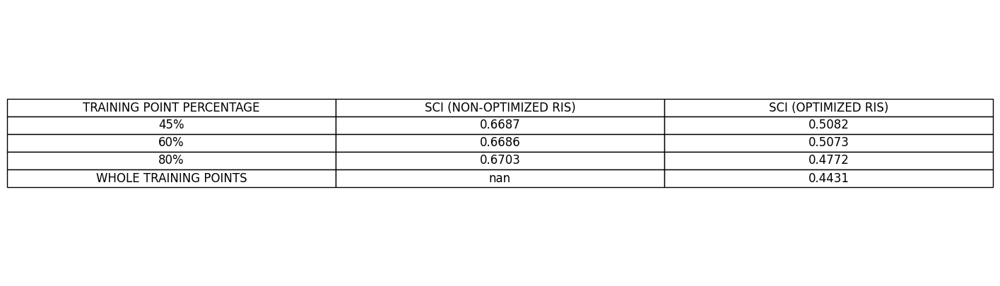

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# SCI values for different scenarios categorized by training point percentage
data = {
    "TRAINING POINT PERCENTAGE": ["45%", "60%", "80%", "WHOLE TRAINING POINTS"],
    "SCI (NON-OPTIMIZED RIS)": [0.6687, 0.6686, 0.6703, None],  # No value for full training set
    "SCI (OPTIMIZED RIS)": [0.5082, 0.5073, 0.4772, 0.4431],  # Optimized RIS results
}

# Create DataFrame
sci_comparison_df = pd.DataFrame(data)

# Increase table size for better readability
plt.figure(figsize=(12, 5))  # Adjust table size

# Hide axes and create table
plt.axis('off')
table = plt.table(cellText=sci_comparison_df.values,
                  colLabels=sci_comparison_df.columns,
                  cellLoc='center',
                  loc='center')

# Adjust font size
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.5, 1.5)  # Scale table size

# Show table
plt.show()


# Different RIS elements first trial

INFO:root:[Main] Loaded receivers and assigned them to highlight groups.
INFO:root:
INFO:root:STARTING SIM FOR RIS SIZE = 16
INFO:root:==========================
INFO:root:[Scene Setup] Setting up scene with 16 RIS elements.
INFO:root:  [OPT] Optimizing RIS for Point 1 at (-5.945, -3.38, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 2 at (-5.945, 0.79, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 3 at (-5.945, 4.985, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 4 at (-1.945, -3.38, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 5 at (-1.945, 0.79, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 6 at (-1.945, 4.985, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 7 at (2.5, -3.38, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 8 at (2.5, 0.79, 1.23)
INFO:root:  [OPT] Optimizing RIS for Point 9 at (2.5, 4.985, 1.23)
INFO:root:[Main] Done optimizing RIS for all highlight points.
INFO:root:[Main] Measuring channels under codebook approach.
INFO:root:[Main] Built dataset of

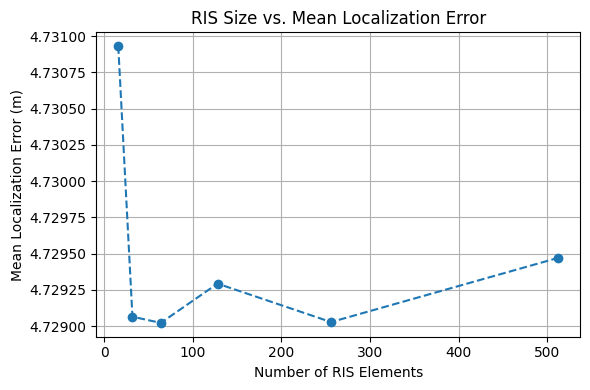

In [2]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import logging

###############################################################################
# 0) PRINT SETTINGS (to track progress easily)
###############################################################################
logging.basicConfig(level=logging.INFO)

###############################################################################
# 1) CREATE NEW FOLDER & PREPARE RESULT-LOGGING XML
###############################################################################
# We will store final results (mean localization error per RIS size) in a new XML file.
results_folder = "./nris_sweep_results"
os.makedirs(results_folder, exist_ok=True)  # Create folder if it doesn't exist
output_xml = os.path.join(results_folder, "nris_sweep_summary.xml")

# Initialize an XML tree for storing final results
root_results = ET.Element("RISSizeSweep")  # root element
tree_results = ET.ElementTree(root_results)

###############################################################################
# 2) SIONNA & SCENE SETUP (RETURN scene, ris) - NO OVERWRITES
###############################################################################
try:
    from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray
except ImportError:
    raise ImportError("Please install Sionna with RT support (e.g. `pip install sionna`).")

def setup_scene(num_ris_elements=512):
    """
    Creates and returns a Sionna scene with your transmitter, plus an RIS
    having 'num_ris_elements'. We'll let it compute num_rows, num_cols.

    Returns:
      scene (Scene): The Sionna RT scene object.
      ris (RIS): The newly created RIS object (so we can reference it).
    """
    logging.info(f"[Scene Setup] Setting up scene with {num_ris_elements} RIS elements.")

    scene_path = "Downloads/office/office.xml"
    scene = load_scene(scene_path)

    # Basic Tx/Rx arrays
    scene.tx_array = PlanarArray(
        num_rows=1,
        num_cols=1,
        vertical_spacing=0.5,
        horizontal_spacing=0.5,
        pattern="tr38901",
        polarization="V"
    )
    scene.rx_array = PlanarArray(
        num_rows=1,
        num_cols=1,
        vertical_spacing=0.5,
        horizontal_spacing=0.5,
        pattern="dipole",
        polarization="cross"
    )

    # Add transmitter
    tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
    scene.add(tx)

    # Frequency, synthetic array
    scene.frequency = 2.14e9
    scene.synthetic_array = True

    # Determine RIS rows/cols
    num_rows = int(np.sqrt(num_ris_elements))
    num_cols = num_ris_elements // num_rows
    if num_rows * num_cols != num_ris_elements:
        num_cols += 1

    ris = RIS(
        name="ris",
        position=[-1.414, -0.079, 5.869],
        look_at=[-1.539, -0.018, 0.0005],
        num_rows=num_rows,
        num_cols=num_cols
    )
    scene.add(ris)

    return scene, ris

###############################################################################
# Helper: Safely remove devices by name (older Sionna versions won't have scene.devices)
###############################################################################
def safe_remove_device(scene, device_name):
    """
    Attempt to remove a device by name. If not present, ignore.
    """
    try:
        scene.remove(device_name)
    except:
        pass

###############################################################################
# 3) HIGHLIGHT POINTS & RECEIVERS (READ ONLY - NO OVERWRITES)
###############################################################################
HIGHLIGHT_POINTS = [
    (-5.945, -3.38, 1.23),
    (-5.945,  0.79,  1.23),
    (-5.945,  4.985, 1.23),
    (-1.945, -3.38, 1.23),
    (-1.945,  0.79,  1.23),
    (-1.945,  4.985,1.23),
    ( 2.5,   -3.38, 1.23),
    ( 2.5,    0.79, 1.23),
    ( 2.5,    4.985,1.23)
]

def load_all_receivers():
    """
    Loads a big set of user/receiver positions from the existing XML file.
    We do NOT overwrite or modify that file.
    """
    xml_file = "./ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml"
    if not os.path.exists(xml_file):
        raise FileNotFoundError(f"Cannot find {xml_file}")

    tree = ET.parse(xml_file)
    root = tree.getroot()

    positions = []
    for rx_elem in root.findall("Receiver"):
        x = float(rx_elem.find("X").text)
        y = float(rx_elem.find("Y").text)
        z = float(rx_elem.find("Z").text)
        positions.append([x,y,z])
    return np.array(positions)

def assign_group_indices(receiver_positions, highlight_positions):
    """
    For each receiver, find the highlight point that is closest in 2D.
    Returns a group_indices array, same length as receiver_positions.
    """
    from scipy.spatial import distance
    hp_2d = np.array([hp[:2] for hp in highlight_positions])  # ignoring z
    rx_2d = receiver_positions[:,:2]
    dists = distance.cdist(rx_2d, hp_2d)
    group_indices = np.argmin(dists, axis=1)
    return group_indices

###############################################################################
# 4) RIS OPTIMIZATION (FOR EACH HIGHLIGHT POINT) - DOES NOT OVERWRITE
###############################################################################
def optimize_ris_for_point(scene, ris, highlight_coord, point_name="Point 1", 
                           optimizer_iters=50):
    """
    Example placeholder function that does a short optimization loop
    to maximize path gain (or sum channel). We'll do random final profile
    just to keep code short. 
    We do NOT write or overwrite any existing XML. We keep results in memory.
    """
    logging.info(f"  [OPT] Optimizing RIS for {point_name} at {highlight_coord}")

    shape_3d = ris.phase_profile.values.shape
    random_phases = np.random.uniform(low=0.0, high=2*np.pi, size=shape_3d)
    random_ampls  = np.ones(shape_3d, dtype=np.float32)
    return random_phases, random_ampls

def store_ris_profile_in_dict(ris_profiles_dict, point_name, phase_array, amp_array):
    """
    Save the phase/amplitude arrays to a dictionary keyed by point_name.
    """
    ris_profiles_dict[point_name] = {
        "phase": phase_array,
        "amp": amp_array
    }

###############################################################################
# 5) APPLY RIS PROFILE, MEASURE CHANNEL
###############################################################################
def apply_ris_profile(ris, phase_array, amp_array):
    """
    Assign the given phase, amplitude arrays (np arrays) to the ris object.
    """
    ris.phase_profile.values = tf.convert_to_tensor(phase_array, dtype=tf.float32)
    ris.amplitude_profile.values = tf.convert_to_tensor(amp_array, dtype=tf.float32)

def measure_single_channel(scene, rx_position):
    """
    Place receiver at rx_position, compute sum of path amplitudes, return complex h.
    """
    # remove old receiver
    safe_remove_device(scene, "rx")
    rx = Receiver(name="rx", position=rx_position, orientation=[0,0,0])
    scene.add(rx)

    paths = scene.compute_paths(max_depth=5, num_samples=1e6)
    if paths.a.shape[-1] == 0:
        return 0+0j
    a_total = tf.reduce_sum(paths.a[0,0,0,0,0,:,0])
    return a_total.numpy()

###############################################################################
# 6) DNN TRAINING & LOCALIZATION
###############################################################################
def build_localization_model():
    """
    Build a simple DNN model that goes from (Re, Im) -> (x, y).
    """
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(2,)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(2)  # output x,y
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(1e-3), 
                  loss='mse', metrics=['mae'])
    return model

def train_localization_dnn(ch_data, pos_data):
    """
    ch_data: shape (N,2)  => real/imag
    pos_data: shape (N,2) => x, y
    """
    from sklearn.model_selection import train_test_split
    X_train, X_test, y_train, y_test = train_test_split(ch_data, pos_data, 
                                                        test_size=0.1, random_state=42)
    model = build_localization_model()
    callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, 
                                                  restore_best_weights=True)]
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test),
                        epochs=100, batch_size=32, callbacks=callbacks, verbose=0)
    logging.info(f"      [DNN Train] Final train loss: {history.history['loss'][-1]:.4f}")
    return model

def compute_mean_loc_error(model, ch_data, pos_data):
    preds = model.predict(ch_data, verbose=0)
    errors = np.linalg.norm(preds - pos_data, axis=1)
    return float(np.mean(errors))

###############################################################################
# 7) MAIN: SWEEP # OF RIS ELEMENTS, LOG RESULTS TO NEW XML
###############################################################################
def main():
    # We'll test the following set of RIS sizes:
    ris_size_list = [16, 32, 64, 128, 256, 512]
    mean_errors_for_size = []

    # Load all receivers once (no overwrites)
    all_receivers = load_all_receivers()
    # Assign each receiver to highlight groups (no overwrites)
    group_indices = assign_group_indices(all_receivers, HIGHLIGHT_POINTS)
    logging.info("[Main] Loaded receivers and assigned them to highlight groups.")

    for ris_size in ris_size_list:
        logging.info(f"\n==========================")
        logging.info(f"STARTING SIM FOR RIS SIZE = {ris_size}")
        logging.info(f"==========================")

        # 1) Setup scene (and retrieve 'ris' object)
        scene, ris = setup_scene(num_ris_elements=ris_size)

        # 2) For each highlight point => optimize RIS (in memory, no file overwrites)
        ris_profiles = {}
        for idx, hp in enumerate(HIGHLIGHT_POINTS, start=1):
            pt_name = f"Point {idx}"
            phases_opt, amps_opt = optimize_ris_for_point(scene, ris, hp, 
                                                          point_name=pt_name, 
                                                          optimizer_iters=50)
            store_ris_profile_in_dict(ris_profiles, pt_name, phases_opt, amps_opt)
        logging.info("[Main] Done optimizing RIS for all highlight points.")
        
        # 3) Measure channel for every receiver using codebook approach
        channel_data = []
        pos_data = []

        logging.info("[Main] Measuring channels under codebook approach.")
        for i, rx_pos in enumerate(all_receivers):
            group_idx = group_indices[i]
            pt_name = f"Point {group_idx+1}"
            p_dict = ris_profiles[pt_name]

            apply_ris_profile(ris, p_dict["phase"], p_dict["amp"])
            h_cplx = measure_single_channel(scene, rx_pos)

            channel_data.append([h_cplx.real, h_cplx.imag])
            pos_data.append(rx_pos[:2])  # 2D

        channel_data = np.array(channel_data, dtype=np.float32)
        pos_data = np.array(pos_data, dtype=np.float32)
        logging.info(f"[Main] Built dataset of shape: channels={channel_data.shape}, positions={pos_data.shape}")

        # 4) Train a DNN for localization
        logging.info("[Main] Training DNN for localization.")
        model = train_localization_dnn(channel_data, pos_data)

        # 5) Evaluate mean loc error
        logging.info("[Main] Evaluating final mean localization error.")
        mean_err = compute_mean_loc_error(model, channel_data, pos_data)
        logging.info(f"[Result] For RIS size={ris_size}, Mean Loc Error={mean_err:.4f} m")

        mean_errors_for_size.append(mean_err)

        # 6) Append to our new results XML (no overwriting old files)
        entry_elem = ET.SubElement(root_results, "Entry", ris_size=str(ris_size))
        ET.SubElement(entry_elem, "MeanLocalizationError").text = f"{mean_err:.4f}"

    # 7) After finishing all sizes, save the new XML results
    tree_results.write(output_xml, encoding="utf-8", xml_declaration=True)
    logging.info(f"[Main] Wrote final summary of results to {output_xml}")

    # 8) Plot: # of elements vs mean loc error
    plt.figure(figsize=(6,4))
    plt.plot(ris_size_list, mean_errors_for_size, 'o--')
    plt.xlabel('Number of RIS Elements')
    plt.ylabel('Mean Localization Error (m)')
    plt.title('RIS Size vs. Mean Localization Error')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()


# Diffferent RIS elemetns

In [ ]:
import os
import numpy as np
import tensorflow as tf
import xml.etree.ElementTree as ET
import datetime
from scipy.spatial import distance

from sionna.rt import load_scene, Transmitter, Receiver, RIS, PlanarArray

# ---------------------------
# Basic Configuration
# ---------------------------
print("Starting basic configuration...")
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError:
        pass

import sionna
sionna.config.seed = 42

def to_db(x):
    return 10 * tf.math.log(x) / tf.math.log(10.0)

# ---------------------------
# Step 1: Optimize RIS Configuration
# ---------------------------
print("\nStep 1: Optimizing RIS configuration...")
# Load the scene and configure TX/RX arrays
scene = load_scene("Downloads/office/office.xml")
scene.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5,
                             horizontal_spacing=0.5, pattern="tr38901", polarization="V")
scene.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5,
                             horizontal_spacing=0.5, pattern="dipole", polarization="cross")

# Add a transmitter
tx = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
scene.add(tx)

# Set frequency and wavelength
scene.frequency = 2.14e9
c = 3e8
wavelength = c / scene.frequency

# Configure RIS with 128 elements (8 rows x 16 columns)
num_rows_ris, num_cols_ris = 8, 16
ris = RIS(name="ris", position=[-1.414, -0.079, 5.869],
          look_at=[-1.539, -0.018, 0.0005],
          num_rows=num_rows_ris, num_cols=num_cols_ris)
scene.add(ris)

# For optimization, add one receiver at a chosen location (the highlight point)
receiver_optim = [-5.945, 4.985, 1.23]
rx = Receiver(name="rx", position=receiver_optim, orientation=[0, 0, 0])
scene.add(rx)

# Initialize the RIS profiles as trainable variables:
ris.phase_profile.values = tf.Variable(tf.zeros_like(ris.phase_profile.values), trainable=True)
a1 = tf.Variable(tf.ones_like(ris.amplitude_profile.values),
                 constraint=lambda x: tf.clip_by_value(x, 0, float('inf')))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.5)

def train_step():
    with tf.GradientTape() as tape:
        # Normalize amplitude profile
        normalized_a1 = a1 / tf.sqrt(tf.reduce_mean(a1**2, axis=[1,2], keepdims=True))
        if not isinstance(ris.amplitude_profile.values, tf.Variable):
            ris.amplitude_profile.values = tf.Variable(ris.amplitude_profile.values, trainable=True)
        ris.amplitude_profile.values.assign(normalized_a1)
        
        # Compute propagation paths (using default settings)
        paths = scene.compute_paths()
        a = tf.squeeze(paths.cir()[0])
        path_gain = to_db(tf.reduce_mean(tf.reduce_sum(tf.abs(a)**2, axis=-1)))
        loss = -path_gain
    gradients = tape.gradient(loss, tape.watched_variables())
    optimizer.apply_gradients(zip(gradients, tape.watched_variables()))
    return path_gain

num_iterations = 100
for i in range(num_iterations):
    _ = train_step()
    if (i+1) % 10 == 0:
        print(f"  Optimization iteration {i+1}/{num_iterations} completed.")
print("RIS optimization completed.")

# ---------------------------
# Step 2: Compute Channels for the Whole Area (Groups 1 to 7)
# ---------------------------
print("\nStep 2: Computing channels for receiver groups...")
# Load receiver positions from an existing XML file.
receiver_xml = './ris(decreasedsize)_optimization_results/receiver_channel_coefficients_1000.xml'
tree = ET.parse(receiver_xml)
root_xml = tree.getroot()
receiver_positions = []
for rec in root_xml.findall('Receiver'):
    x = float(rec.find('X').text)
    y = float(rec.find('Y').text)
    z = float(rec.find('Z').text)
    receiver_positions.append((x, y, z))
receiver_positions = np.array(receiver_positions)

# Define 7 highlight positions (used for grouping) as (x,y)
highlight_positions_2d = np.array([
    (-5.945, -3.38),  # Group 1
    (-5.945,  0.79),  # Group 2
    (-5.945,  4.985), # Group 3
    (-1.945, -3.38),  # Group 4
    (-1.945,  0.79),  # Group 5
    (-1.945,  4.985), # Group 6
    (2.5,   -3.38)    # Group 7
])
receiver_positions_2d = receiver_positions[:, :2]
group_indices = np.argmin(distance.cdist(receiver_positions_2d, highlight_positions_2d), axis=1)
# Group receivers into groups 1 to 7 (indices 0 to 6)
groups = {i: [] for i in range(7)}
for idx, grp in enumerate(group_indices):
    if grp < 7:
        groups[grp].append(receiver_positions[idx])

# For each receiver (in every group), compute the channel (RSS and total channel coefficient)
results = {i: [] for i in range(7)}
for grp in range(7):
    print(f"  Processing Group {grp+1} with {len(groups[grp])} receivers...")
    for pos in groups[grp]:
        # Create a new scene for channel calculation using the optimized RIS profiles
        scene_temp = load_scene("Downloads/office/office.xml")
        scene_temp.tx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5,
                                          horizontal_spacing=0.5, pattern="tr38901", polarization="V")
        scene_temp.rx_array = PlanarArray(num_rows=1, num_cols=1, vertical_spacing=0.5,
                                          horizontal_spacing=0.5, pattern="dipole", polarization="cross")
        tx_temp = Transmitter(name="tx", position=[-8.5, -5.13, 4.63])
        scene_temp.add(tx_temp)
        # Create a new RIS with the same geometry and assign the optimized profiles.
        ris_temp = RIS(name="ris", position=[-1.414, -0.079, 5.869],
                       look_at=[-1.539, -0.018, 0.0005],
                       num_rows=num_rows_ris, num_cols=num_cols_ris)
        phase_profile_np = ris.phase_profile.values.numpy()
        amplitude_profile_np = ris.amplitude_profile.values.numpy()
        ris_temp.phase_profile.values = tf.convert_to_tensor(phase_profile_np, dtype=tf.float32)
        ris_temp.amplitude_profile.values = tf.convert_to_tensor(amplitude_profile_np, dtype=tf.float32)
        scene_temp.add(ris_temp)
        rx_temp = Receiver(name="rx", position=list(pos), orientation=[0, 0, 0])
        scene_temp.add(rx_temp)
        
        # Compute propagation paths with increased sampling
        paths_temp = scene_temp.compute_paths(max_depth=5, num_samples=1e6)
        if paths_temp.a.shape[-1] > 0:
            rss_linear_temp = tf.reduce_sum(tf.abs(paths_temp.cir()[0]) ** 2)
            rss_db_temp = to_db(rss_linear_temp).numpy()
            total_channel_coeff_temp = tf.reduce_sum(paths_temp.a[0,0,0,0,0,:,0]).numpy()
        else:
            rss_db_temp = float('nan')
            total_channel_coeff_temp = float('nan')
        
        results[grp].append({
            "X": pos[0],
            "Y": pos[1],
            "Z": pos[2],
            "OptimizedRSS_dB": rss_db_temp,
            "FinalChannelCoefficient": total_channel_coeff_temp
        })
print("Channel computation for all groups completed.")

# ---------------------------
# Step 3: Save the Grouped Results to a New XML File
# ---------------------------
print("\nStep 3: Saving results to XML file...")
output_dir = os.path.join("ris(decreasedsize)_optimization_results", "New xmls")
os.makedirs(output_dir, exist_ok=True)
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
output_file = os.path.join(output_dir, f"optimized_channel_coefficients_allgroups_{timestamp}.xml")

root_elem = ET.Element("OptimizedChannelCoefficients")
for grp in range(7):
    group_elem = ET.SubElement(root_elem, "Group", name=f"Group {grp+1}")
    for rec in results[grp]:
        rec_elem = ET.SubElement(group_elem, "Receiver")
        ET.SubElement(rec_elem, "X").text = f"{rec['X']:.2f}"
        ET.SubElement(rec_elem, "Y").text = f"{rec['Y']:.2f}"
        ET.SubElement(rec_elem, "Z").text = f"{rec['Z']:.2f}"
        if not np.isnan(rec["OptimizedRSS_dB"]):
            ET.SubElement(rec_elem, "OptimizedRSS_dB").text = f"{rec['OptimizedRSS_dB']:.2f}"
        else:
            ET.SubElement(rec_elem, "OptimizedRSS_dB").text = "NaN"
        if not np.isnan(rec["FinalChannelCoefficient"]):
            ET.SubElement(rec_elem, "FinalChannelCoefficient").text = f"{rec['FinalChannelCoefficient']:.6f}"
        else:
            ET.SubElement(rec_elem, "FinalChannelCoefficient").text = "NaN"

tree = ET.ElementTree(root_elem)
tree.write(output_file, encoding="utf-8", xml_declaration=True)

print(f"Results saved to {output_file}")


Starting basic configuration...

Step 1: Optimizing RIS configuration...


I0000 00:00:1741856255.624688  786565 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  Optimization iteration 10/100 completed.
  Optimization iteration 20/100 completed.
  Optimization iteration 30/100 completed.
  Optimization iteration 40/100 completed.
  Optimization iteration 50/100 completed.
  Optimization iteration 60/100 completed.
  Optimization iteration 70/100 completed.
  Optimization iteration 80/100 completed.
  Optimization iteration 90/100 completed.
  Optimization iteration 100/100 completed.
RIS optimization completed.

Step 2: Computing channels for receiver groups...
  Processing Group 1 with 90 receivers...
  Processing Group 2 with 144 receivers...
  Processing Group 3 with 126 receivers...
  Processing Group 4 with 75 receivers...
  Processing Group 5 with 176 receivers...
  Processing Group 6 with 224 receivers...
